# Import Library


In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.svm import SVR
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split


# Data Understanding


In [24]:
df = pd.read_csv(r'DataProduksi.csv')
df

,Tanggal,Minyak Sawit,Karet Kering,Teh
0,Jan-09,1427.10,50.00,8.80
1,Feb-09,1188.00,45.50,7.90
2,Mar-09,1346.70,40.10,8.50
3,Apr-09,1193.50,38.80,9.30
4,May-09,1239.50,47.20,10.30
...,...,...,...,...
115,Aug-18,2075.95,35.32,5.99
116,Sep-18,2093.69,49.37,6.78
117,Oct-18,2075.70,51.21,8.12
118,Nov-18,1931.94,48.77,8.48


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Tanggal       120 non-null    object 
 1   Minyak Sawit  120 non-null    float64
 2   Karet Kering  120 non-null    float64
 3   Teh           120 non-null    float64
dtypes: float64(3), object(1)
memory usage: 3.9+ KB


# Preprocessing


## Change date format


In [26]:
df['Tanggal'] = pd.to_datetime(
    df['Tanggal'], format='%b-%y').dt.strftime('%Y-%m')
df.head()

,Tanggal,Minyak Sawit,Karet Kering,Teh
0,2009-01,1427.1,50.0,8.8
1,2009-02,1188.0,45.5,7.9
2,2009-03,1346.7,40.1,8.5
3,2009-04,1193.5,38.8,9.3
4,2009-05,1239.5,47.2,10.3


## Separating DataFrame Columns into Separate Variables


In [27]:
dates = df['Tanggal'].values
minyak_sawit = df['Minyak Sawit'].values
karet_kering = df['Karet Kering'].values
teh = df['Teh'].values

## Split Dataset


In [28]:
def split_data(X, y, split_percentage):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=split_percentage, shuffle=False)
    return X_train, X_test, y_train, y_test

## Normalization


In [29]:
scaler = MinMaxScaler()
def normalization(data):
    return scaler.fit_transform(data.reshape(-1, 1))


def to_original_value(data):
    return scaler.inverse_transform(data.reshape(-1, 1))

# Generate Output


## Generate R2 Score


In [30]:
def generate_r2(y_test, y_pred):
    r2 = r2_score(y_test,y_pred)
    print("R2 score: {:.2%}".format(r2))

## Generate Plot

In [31]:
def generate_plot(X_data, y_data, X_name, y_name, attribute_name):
    plt.figure(figsize=(10, 6))
    plt.plot(X_data, label=X_name)
    plt.plot(y_data, label=y_name)
    plt.title(f'{X_name} vs {y_name} {attribute_name}')
    plt.xlabel('Month')
    plt.ylabel('Production Amount')
    plt.legend()
    plt.show()
    print('\n')

# LSTM model


In [32]:
def model_lstm(data, attribute_name, split_percentage=0.2, epochs=50, units=60, activation='relu'):
    X_train, X_test, y_train, y_test = split_data(normalization(data), normalization(data), split_percentage)

    model = Sequential([
        LSTM(units, return_sequences=True),
        Dropout(0.1),
        LSTM(units, return_sequences=True),
        Dropout(0.1),
        LSTM(units),
        Dropout(0.1),
        Dense(30, activation),
        Dense(10, activation),
        Dense(1)
    ])
    model.compile(loss="mae", optimizer=Adam() , metrics=["mae"])
    model.fit(tf.expand_dims(X_train, axis=-1), tf.expand_dims(y_train, axis=-1), epochs=epochs, verbose=0)


    y_pred = model.predict(X_test)
    # train_pred = model.predict(X_train)

    generate_r2(y_test, y_pred)

    generate_plot(to_original_value(y_test), to_original_value(y_pred), 'Actual Data', 'Prediction Data', attribute_name)
    # generate_plot(to_original_value(X_train), to_original_value(train_pred), 'Data Training','Data Prediksi', attribute_name)


# LSTM Evaluation


## Minyak Sawit


In [33]:
# model_lstm(minyak_sawit, 'Minyak Sawit', 0.3, 1000, 'sigmoid')

## Karet Kering


In [34]:
# model_lstm(karet_kering, 'Karet Kering', 0.3, 1000, 'sigmoid')

## Teh


In [35]:
# model_lstm(teh, 'Teh', 0.3, 1000, 'sigmoid')

Pembagian 90:10
relu-100
1/1 [==============================] - 1s 974ms/step
R2 score: 99.27%


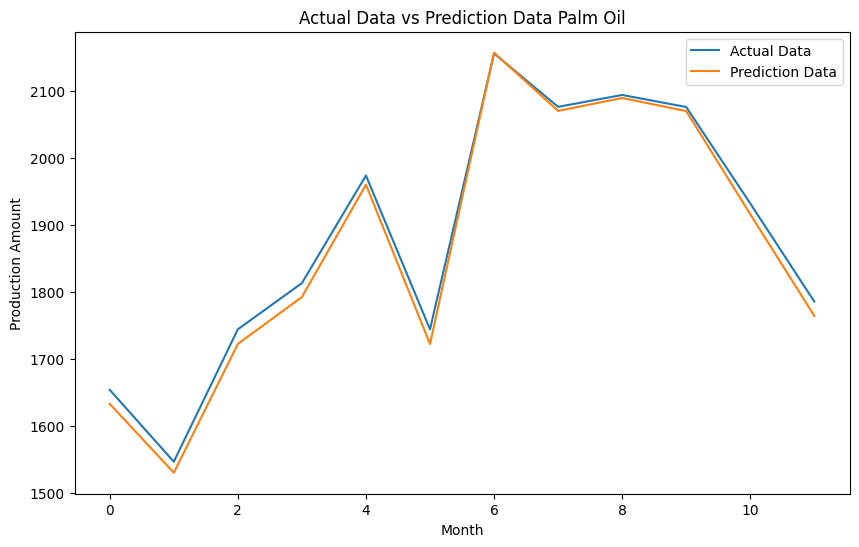



relu-100
1/1 [==============================] - 1s 945ms/step
R2 score: 99.40%


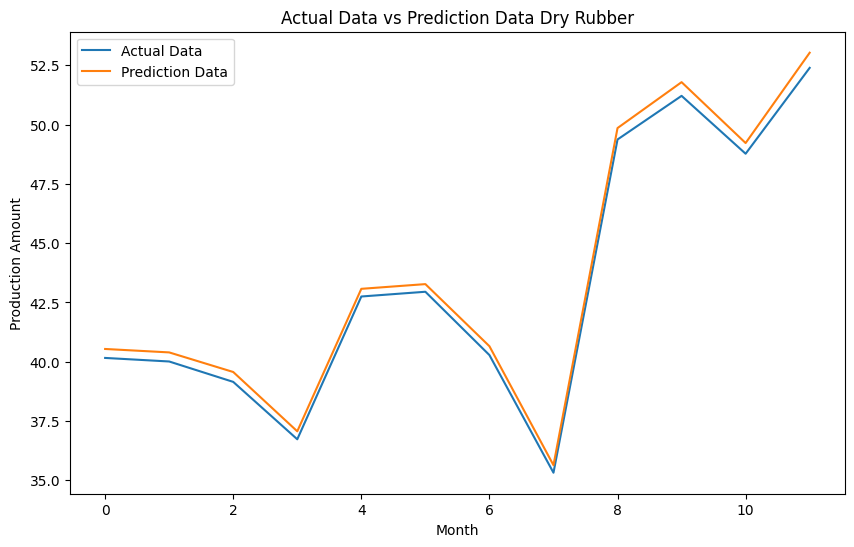



relu-100
1/1 [==============================] - 1s 925ms/step
R2 score: 99.57%


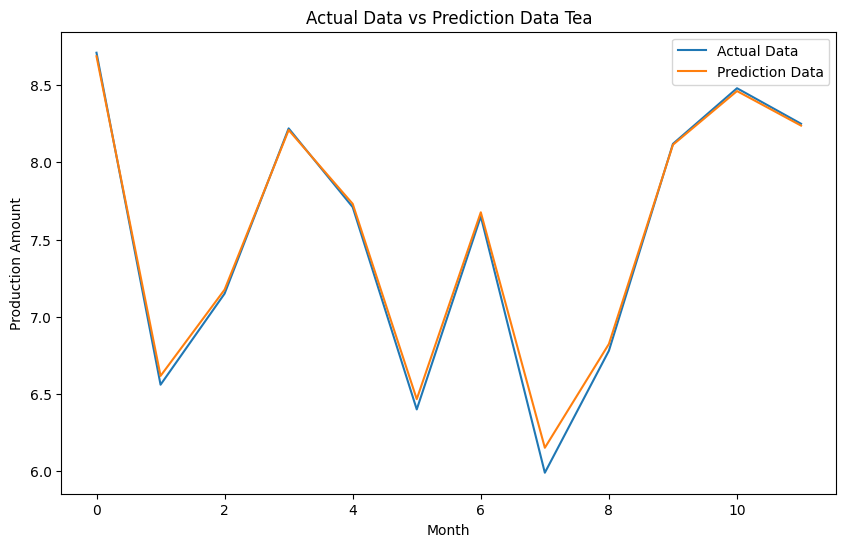



Pembagian 80:20
relu-100
1/1 [==============================] - 1s 959ms/step
R2 score: 99.52%


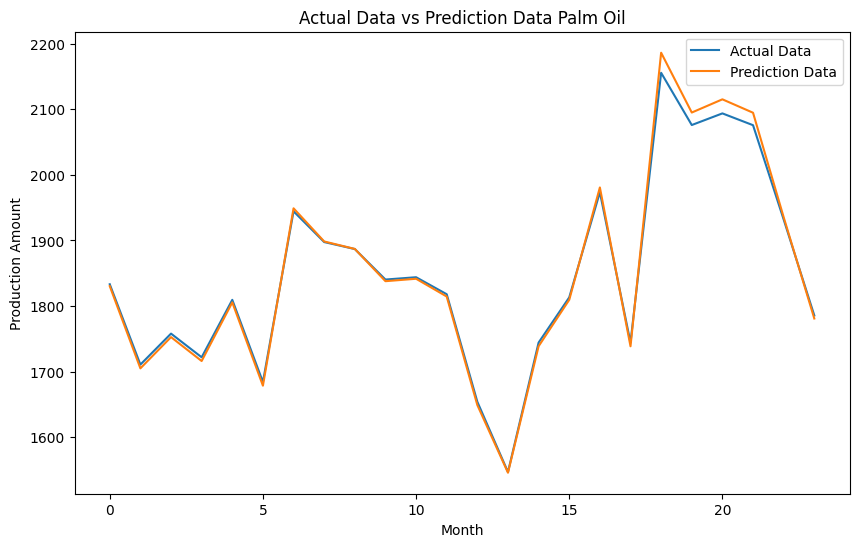



relu-100
1/1 [==============================] - 1s 1s/step
R2 score: 99.91%


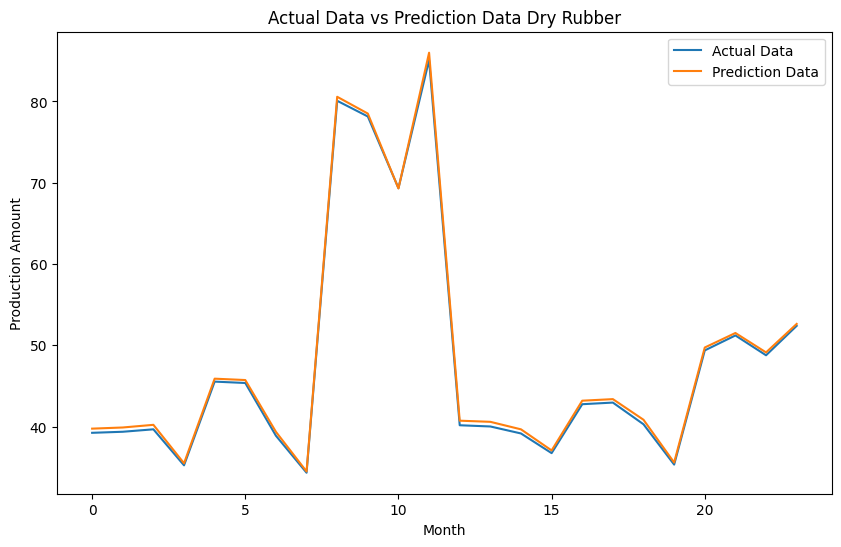



relu-100
1/1 [==============================] - 1s 988ms/step
R2 score: 99.96%


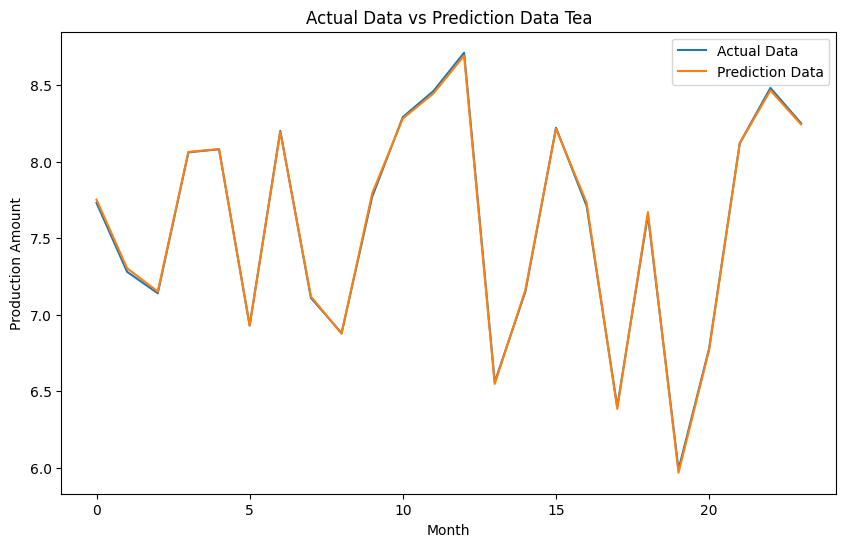



Pembagian 70:30
relu-100
2/2 [==============================] - 1s 3ms/step
R2 score: 98.39%


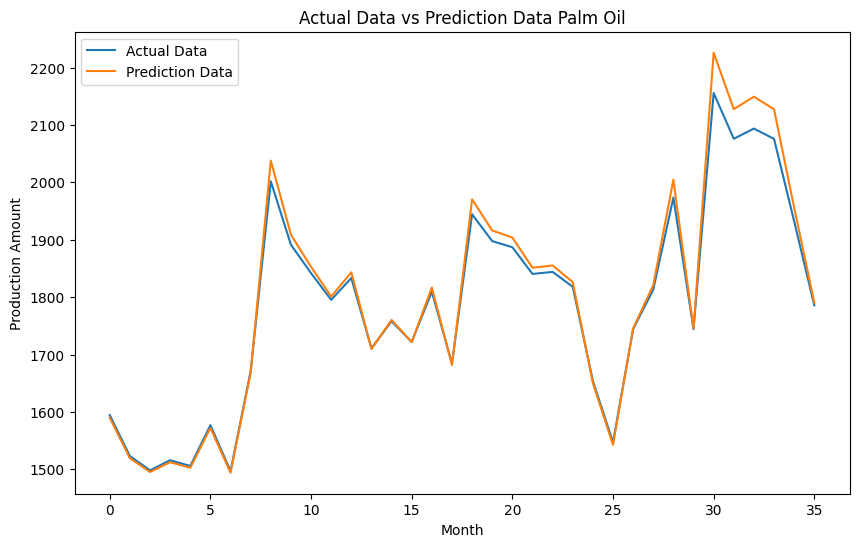



relu-100
2/2 [==============================] - 1s 3ms/step
R2 score: 99.89%


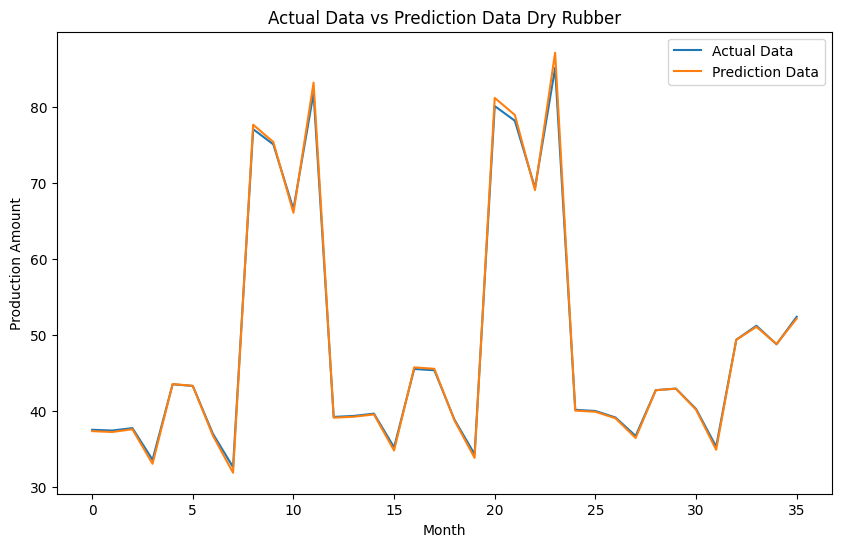



relu-100
2/2 [==============================] - 1s 3ms/step
R2 score: 97.99%


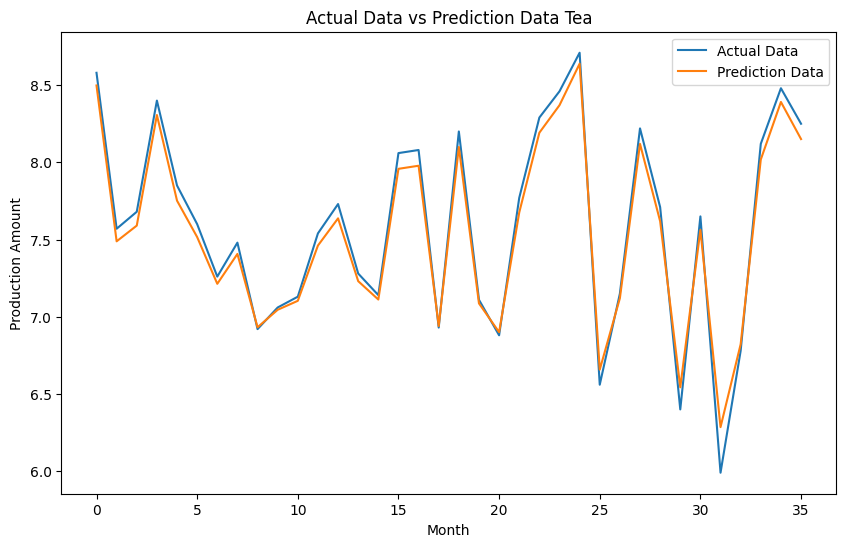



Pembagian 90:10
sigmoid-100
1/1 [==============================] - 1s 1s/step
R2 score: 85.47%


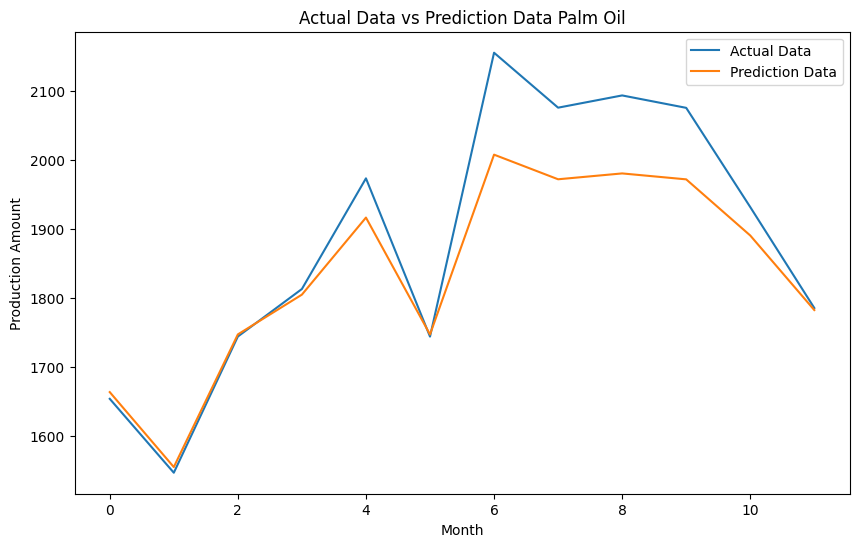



sigmoid-100
1/1 [==============================] - 1s 1s/step
R2 score: 99.51%


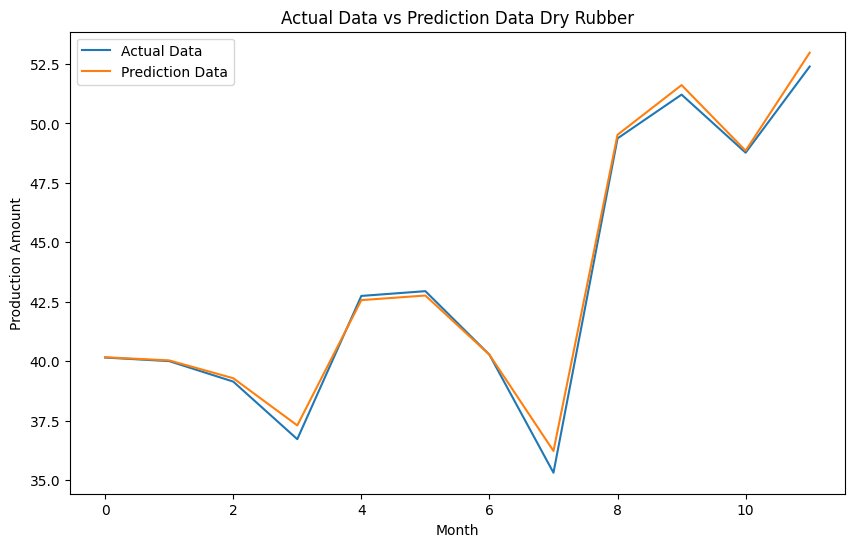



sigmoid-100
1/1 [==============================] - 1s 1s/step
R2 score: 95.62%


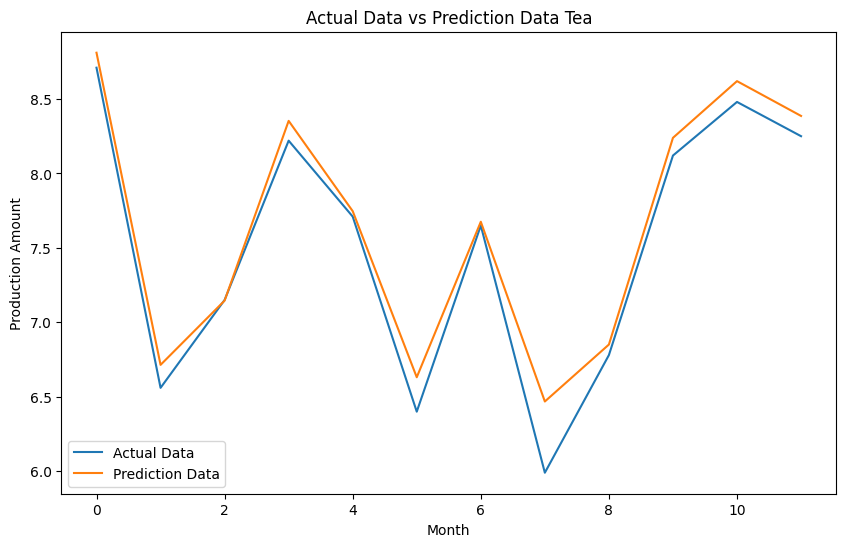



Pembagian 80:20
sigmoid-100
1/1 [==============================] - 1s 1s/step
R2 score: 86.29%


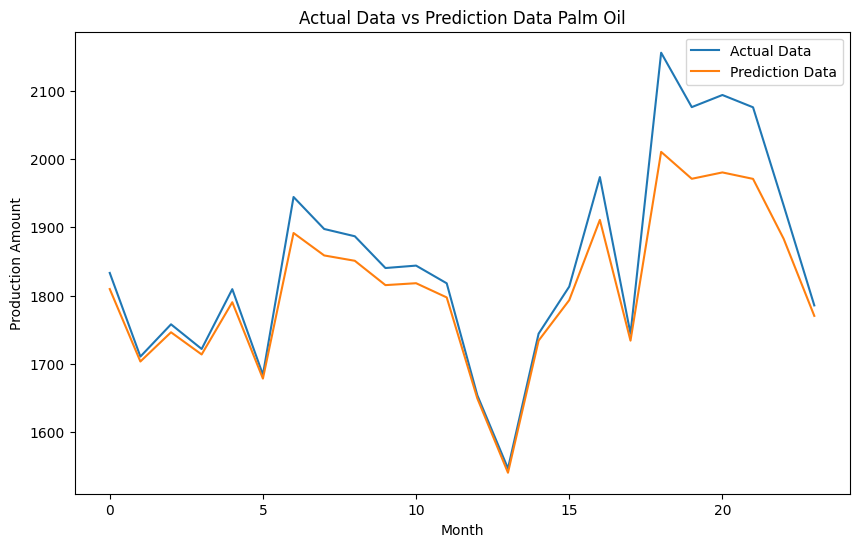



sigmoid-100
1/1 [==============================] - 1s 1s/step
R2 score: 98.86%


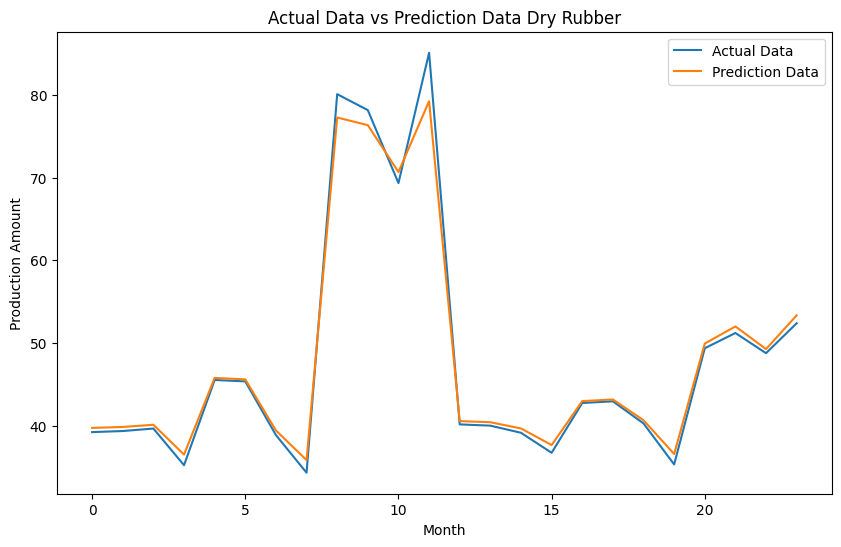



sigmoid-100
1/1 [==============================] - 1s 1s/step
R2 score: 98.94%


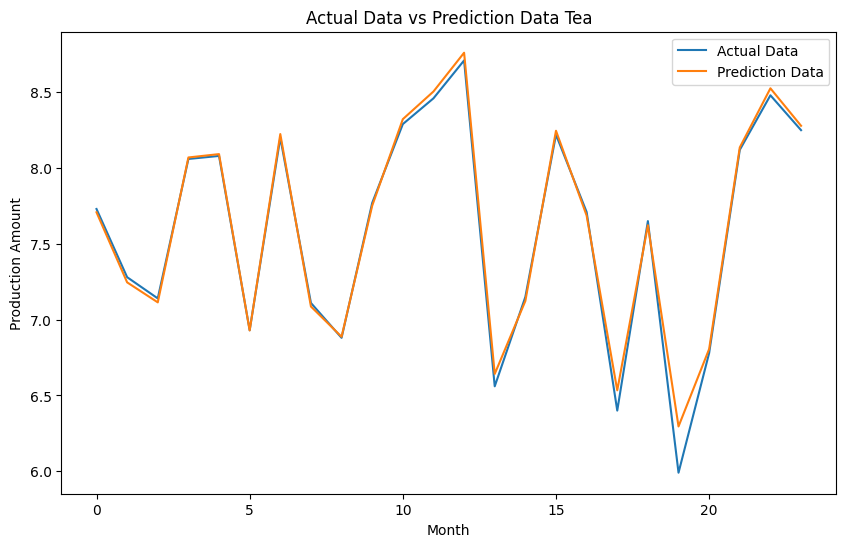



Pembagian 70:30
sigmoid-100
2/2 [==============================] - 1s 2ms/step
R2 score: 69.57%


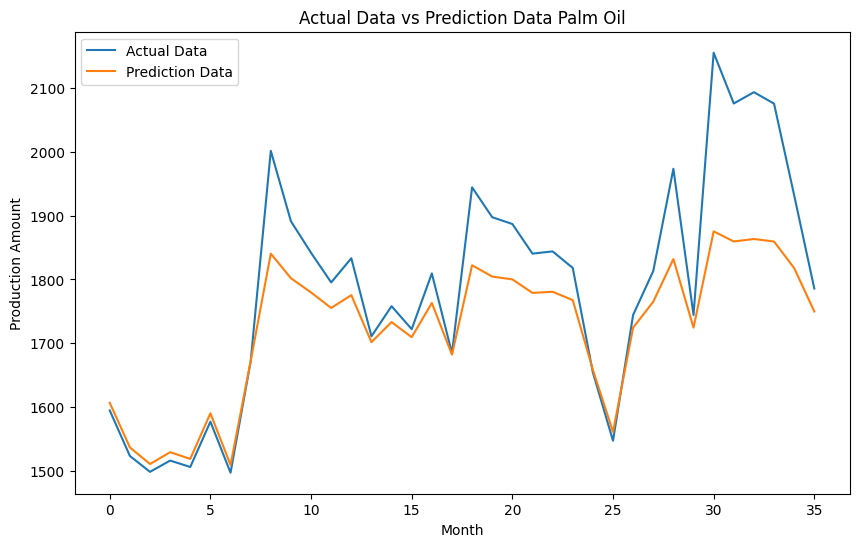



sigmoid-100
2/2 [==============================] - 1s 4ms/step
R2 score: 94.44%


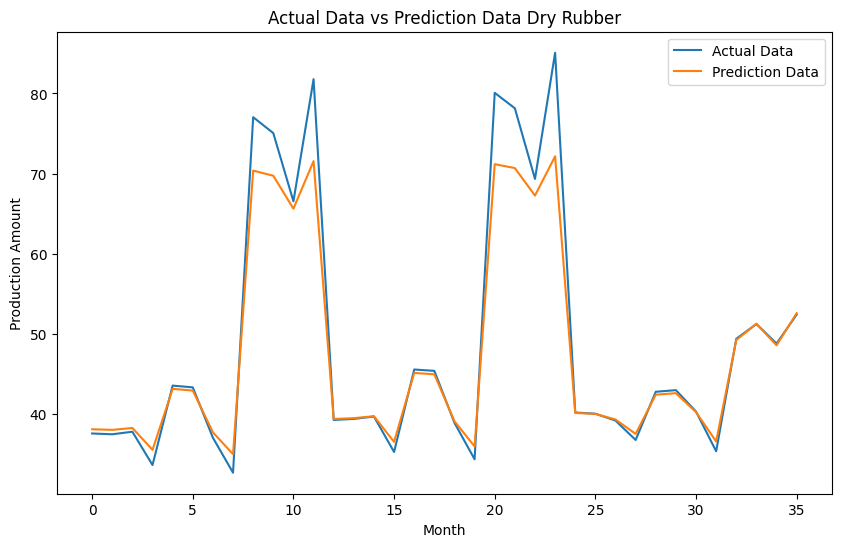



sigmoid-100
2/2 [==============================] - 1s 5ms/step
R2 score: 98.44%


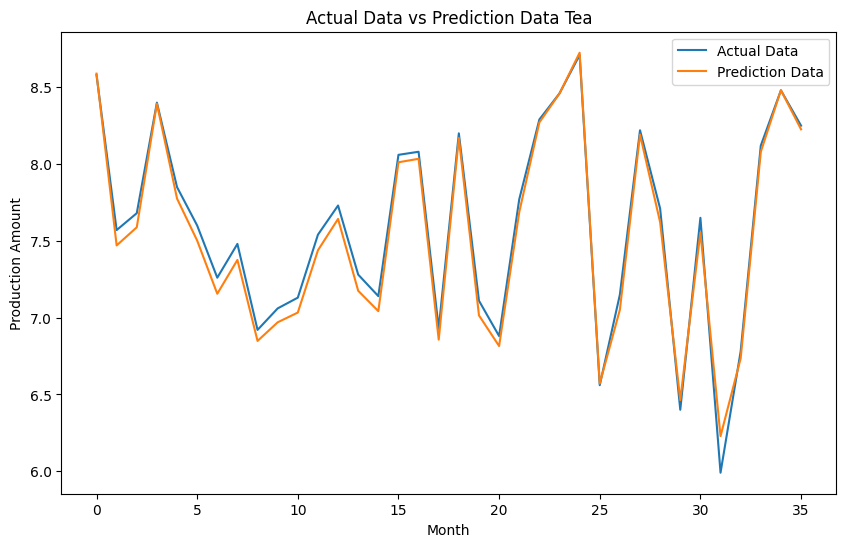



Pembagian 90:10
tanh-100
1/1 [==============================] - 1s 1s/step
R2 score: 98.97%


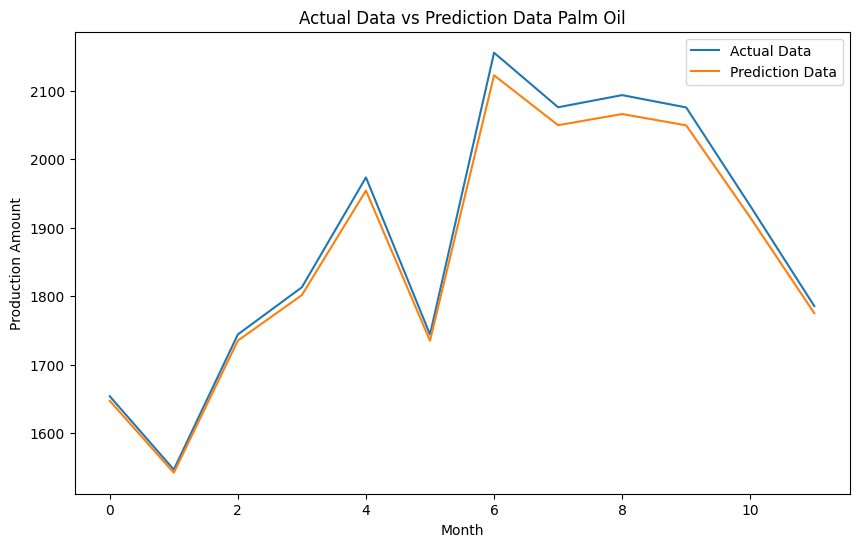



tanh-100
1/1 [==============================] - 1s 1s/step
R2 score: 99.56%


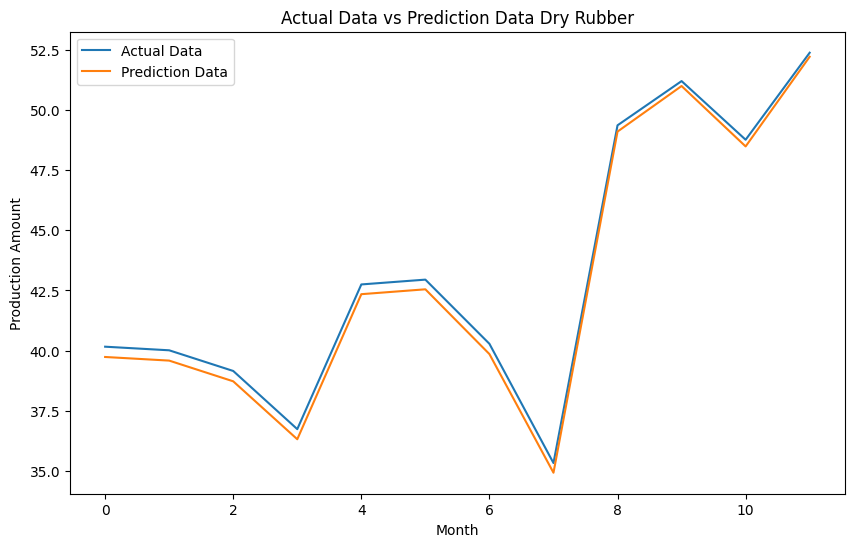



tanh-100
1/1 [==============================] - 1s 1s/step
R2 score: 99.38%


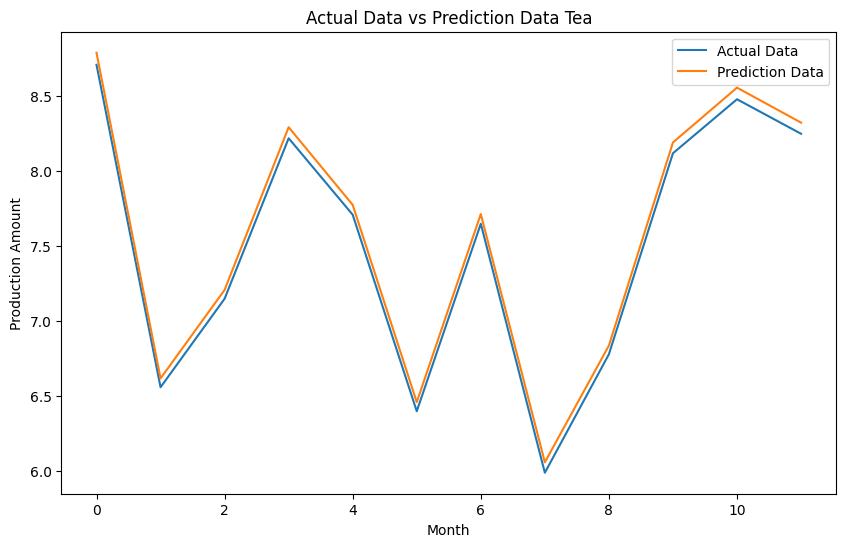



Pembagian 80:20
tanh-100
1/1 [==============================] - 1s 1s/step
R2 score: 99.97%


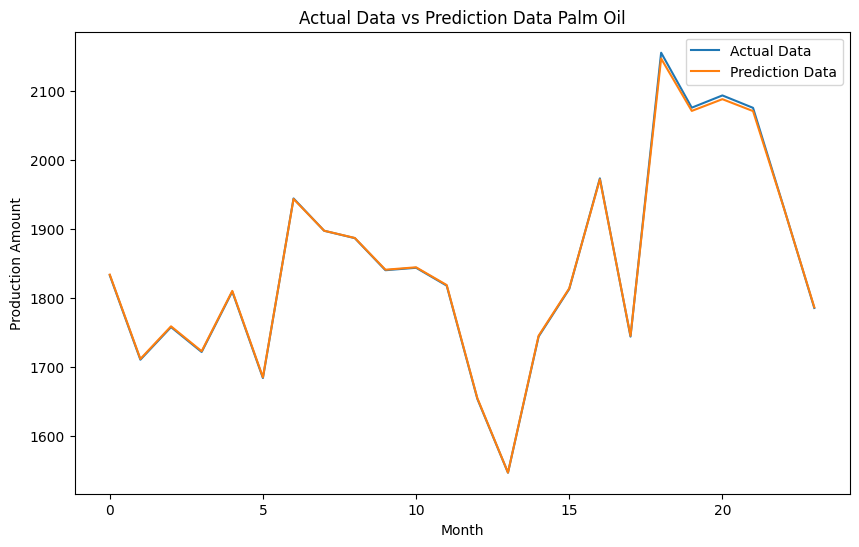



tanh-100
1/1 [==============================] - 1s 1s/step
R2 score: 99.88%


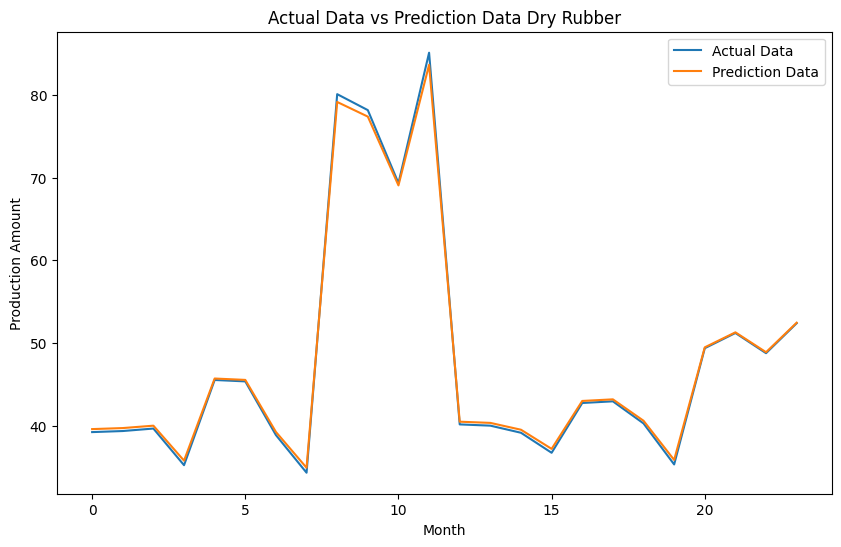



tanh-100
1/1 [==============================] - 1s 1s/step
R2 score: 99.90%


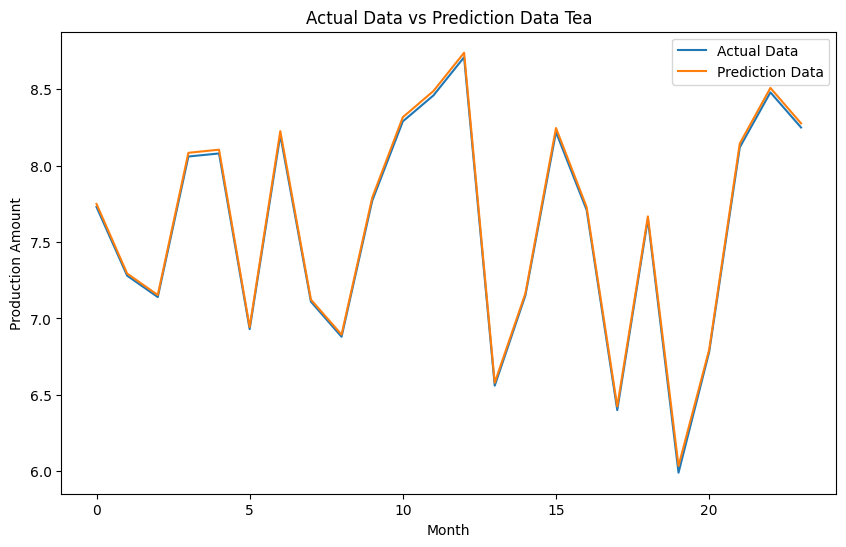



Pembagian 70:30
tanh-100
2/2 [==============================] - 1s 3ms/step
R2 score: 97.70%


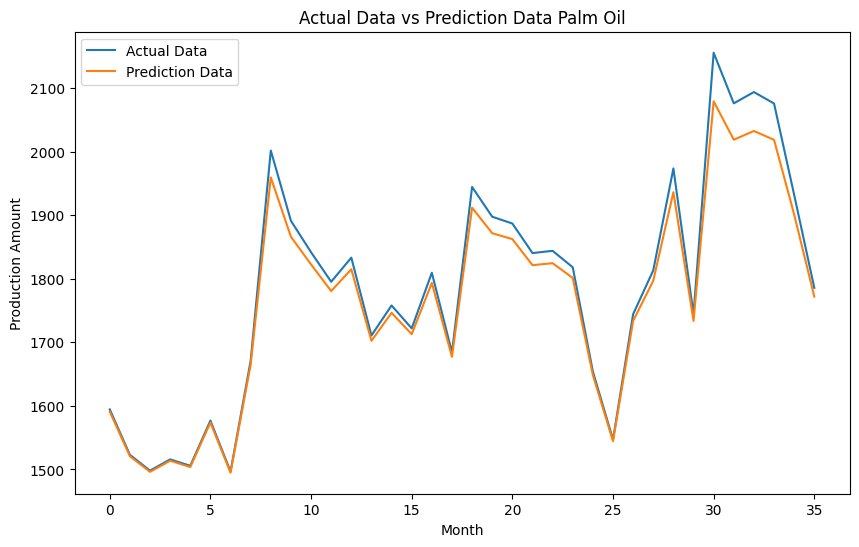



tanh-100
2/2 [==============================] - 1s 4ms/step
R2 score: 99.95%


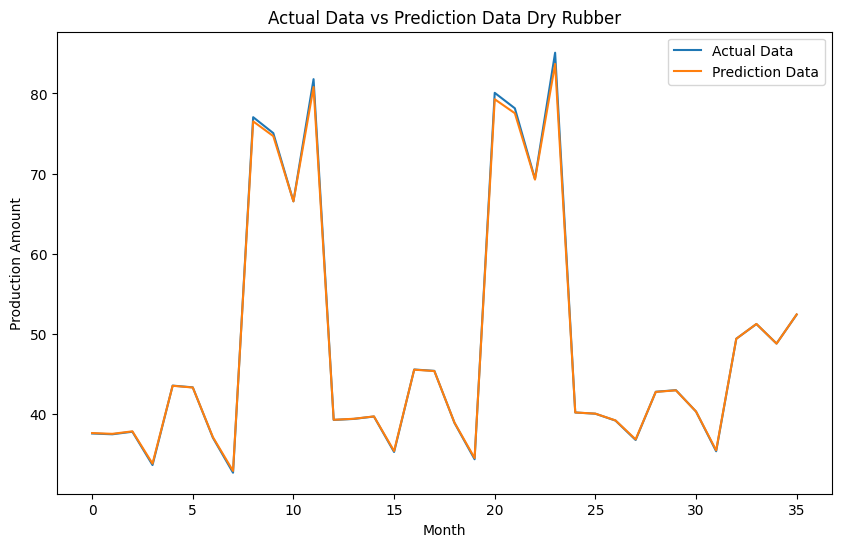



tanh-100
2/2 [==============================] - 1s 4ms/step
R2 score: 99.70%


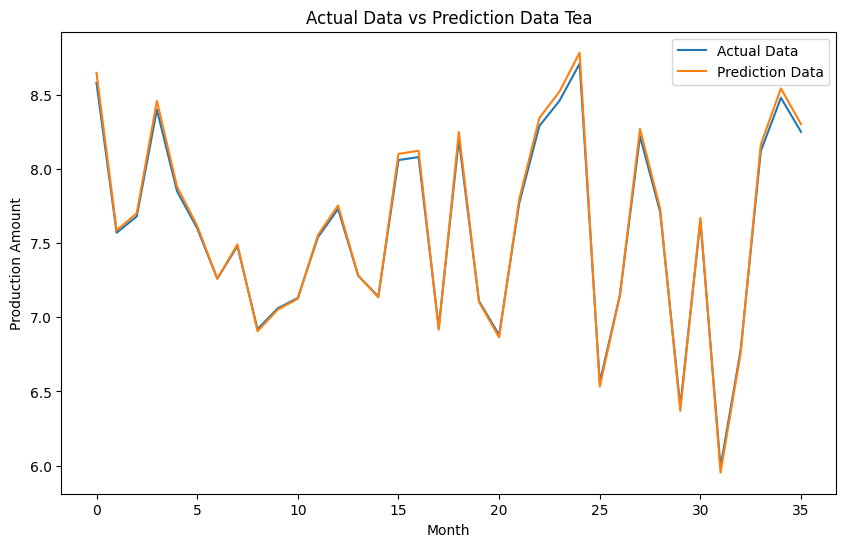



Pembagian 90:10
relu-400
1/1 [==============================] - 2s 2s/step
R2 score: 98.72%


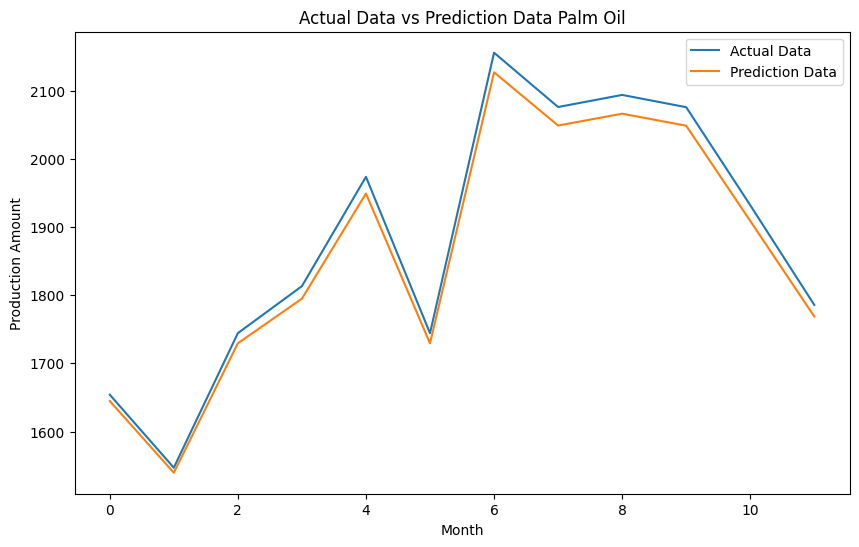



relu-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.48%


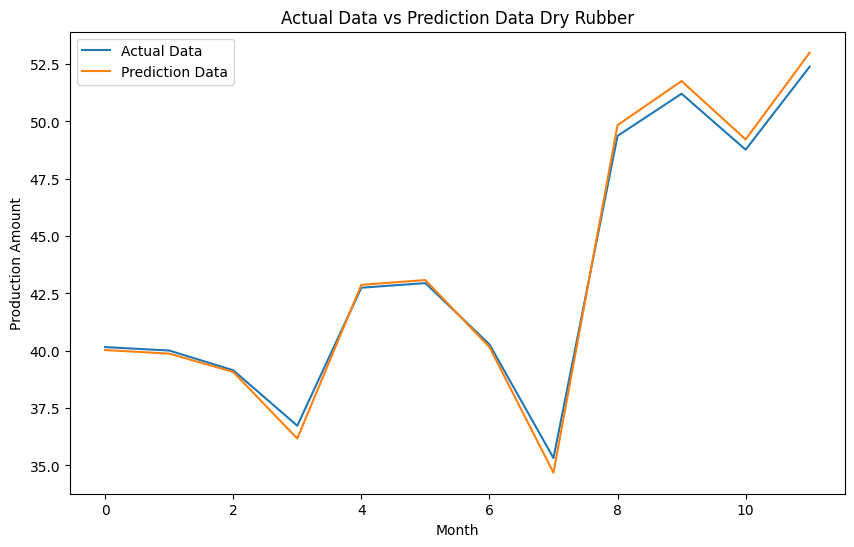



relu-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.80%


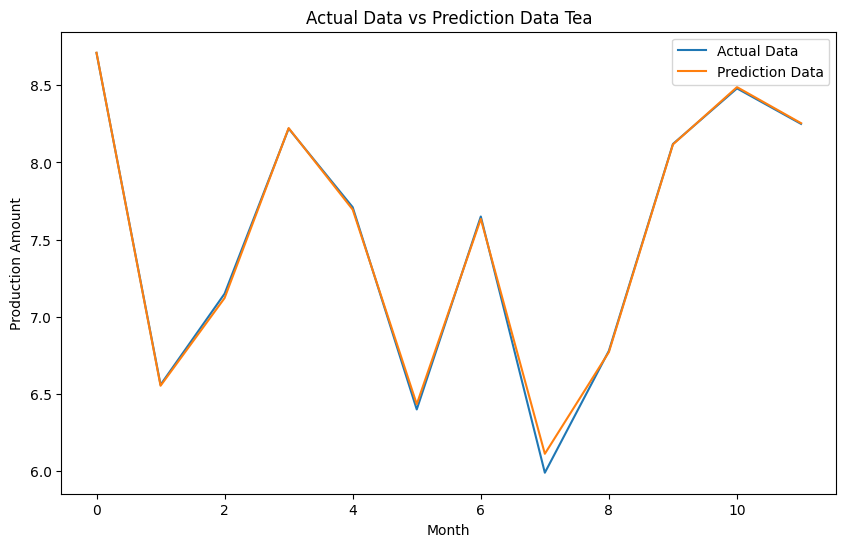



Pembagian 80:20
relu-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.79%


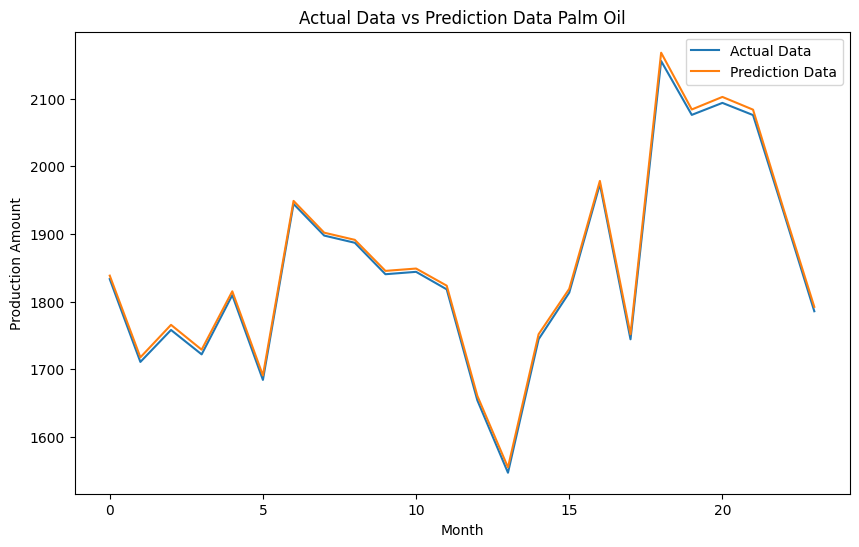



relu-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.99%


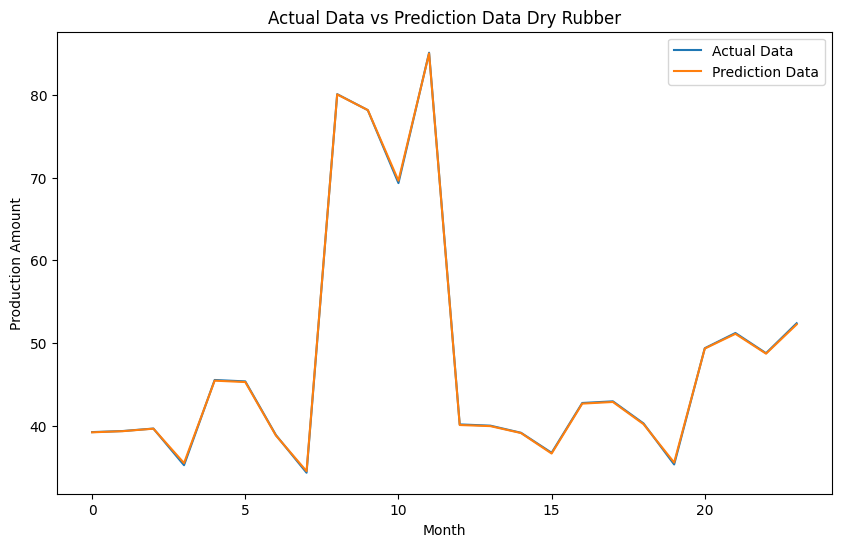



relu-400
2/2 [==============================] - 1s 4ms/step
R2 score: 99.57%


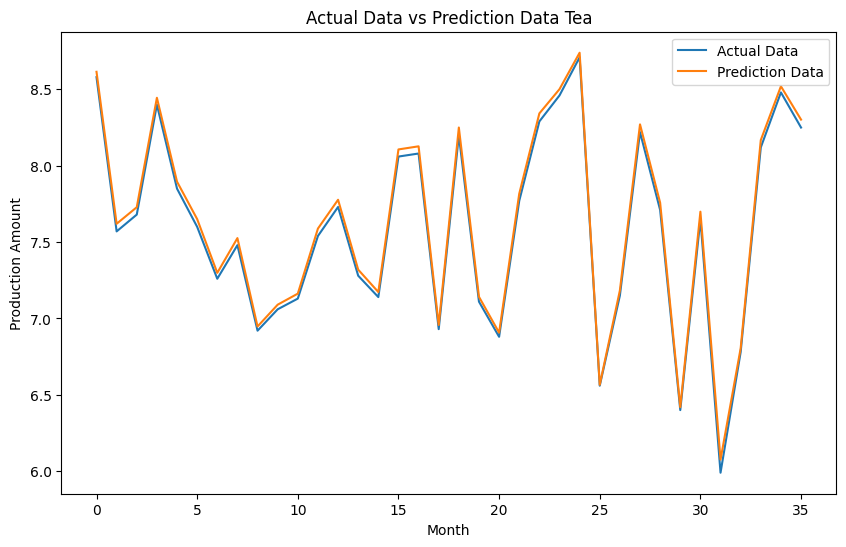



Pembagian 70:30
relu-400
2/2 [==============================] - 1s 3ms/step
R2 score: 99.76%


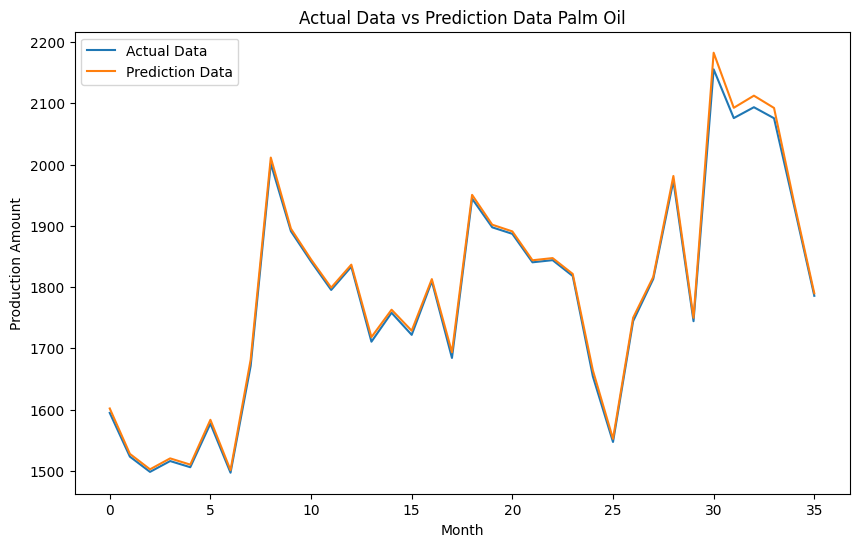



relu-400
2/2 [==============================] - 1s 5ms/step
R2 score: 99.91%


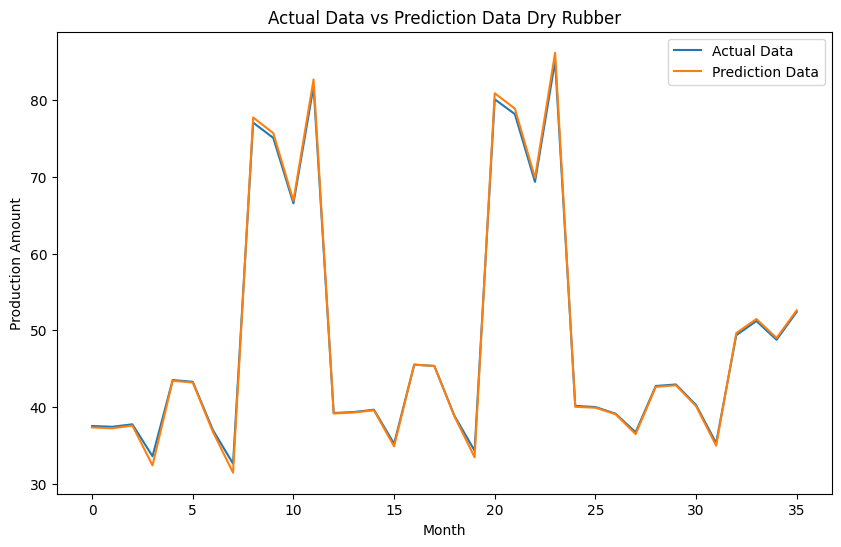



relu-400
2/2 [==============================] - 1s 4ms/step
R2 score: 99.92%


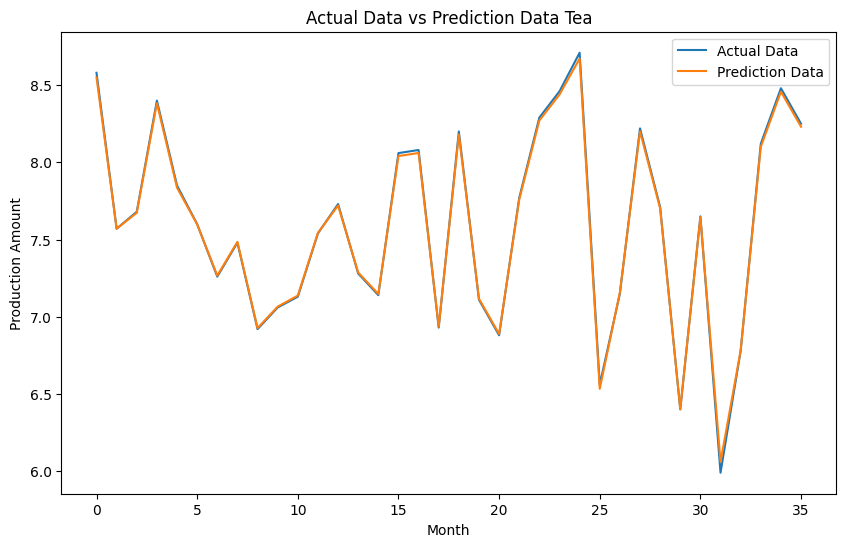



Pembagian 90:10
sigmoid-400
1/1 [==============================] - 1s 1s/step
R2 score: 92.03%


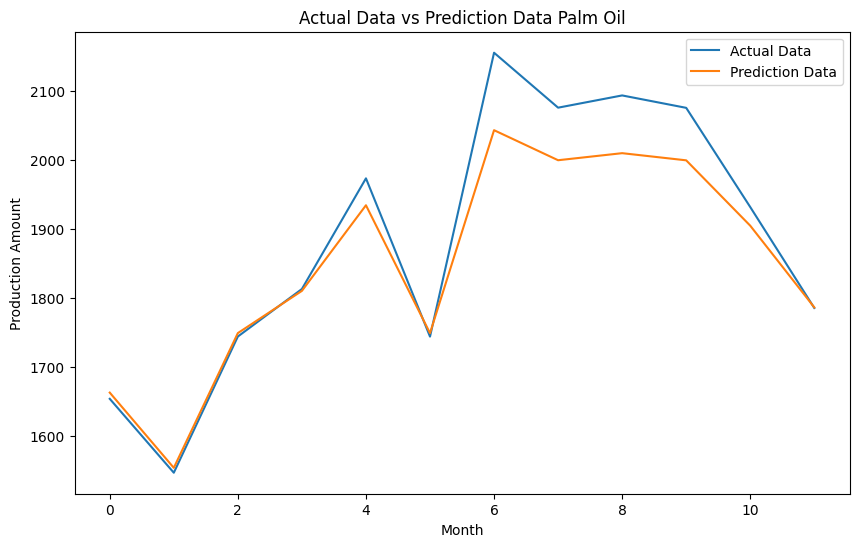



sigmoid-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.81%


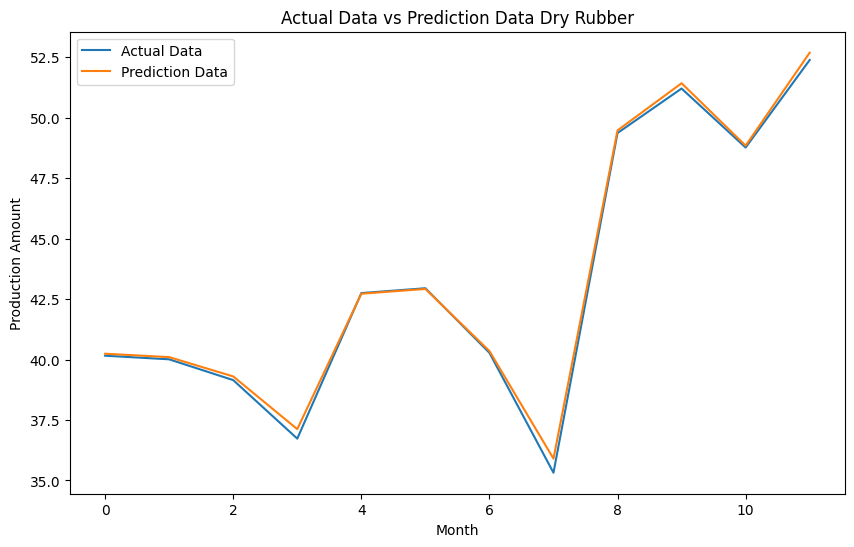



sigmoid-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.80%


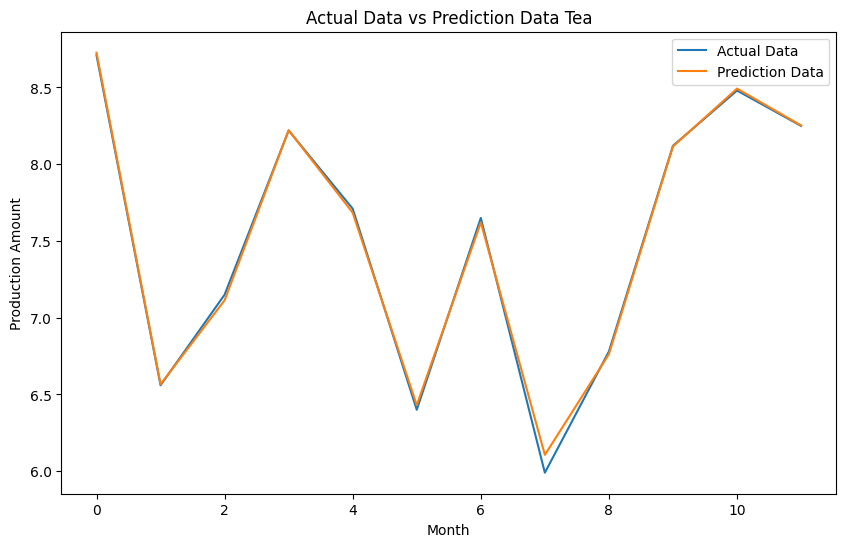



Pembagian 80:20
sigmoid-400
1/1 [==============================] - 1s 1s/step
R2 score: 87.95%


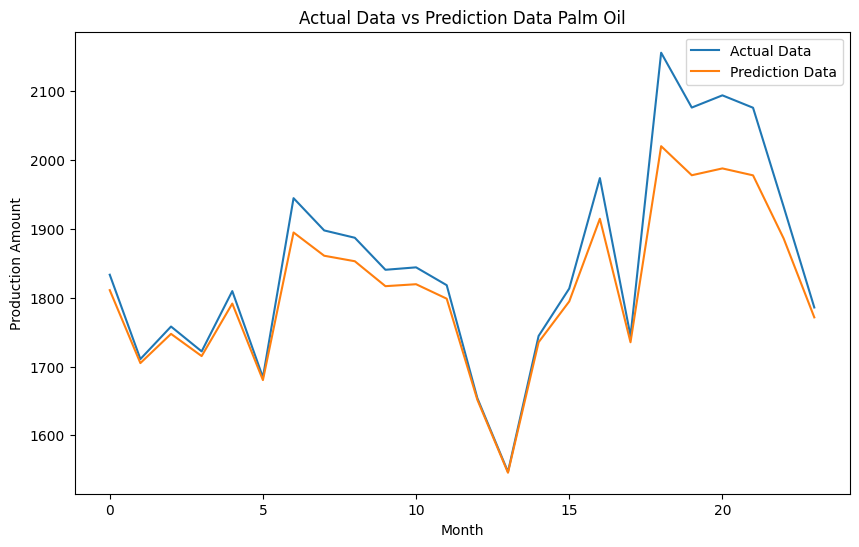



sigmoid-400
1/1 [==============================] - 2s 2s/step
R2 score: 99.62%


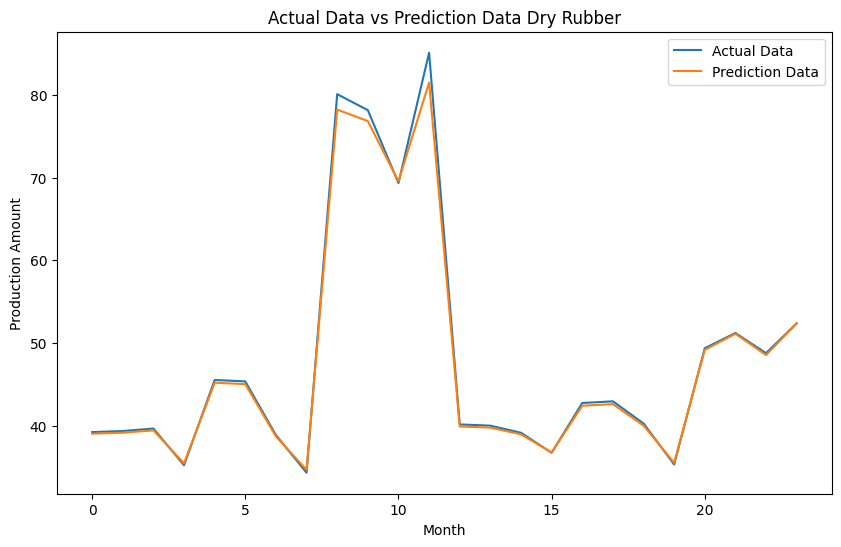



sigmoid-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.72%


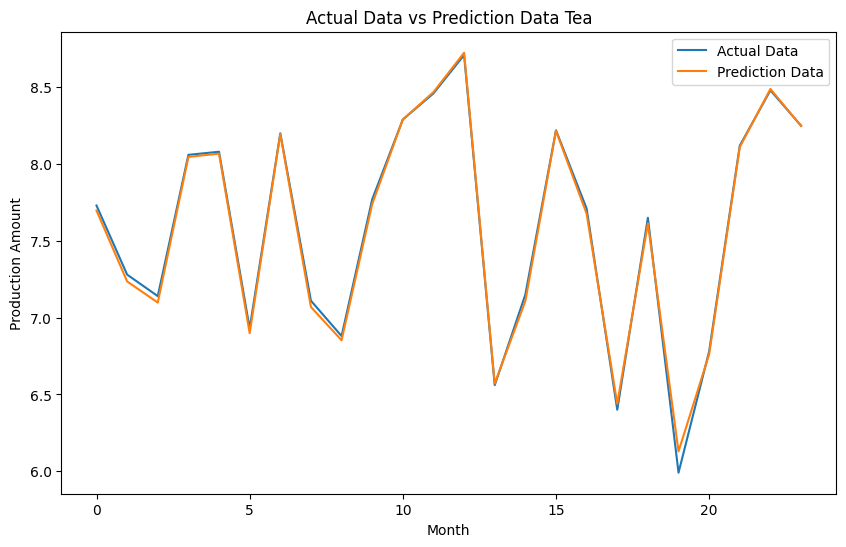



Pembagian 70:30
sigmoid-400
2/2 [==============================] - 1s 3ms/step
R2 score: 96.07%


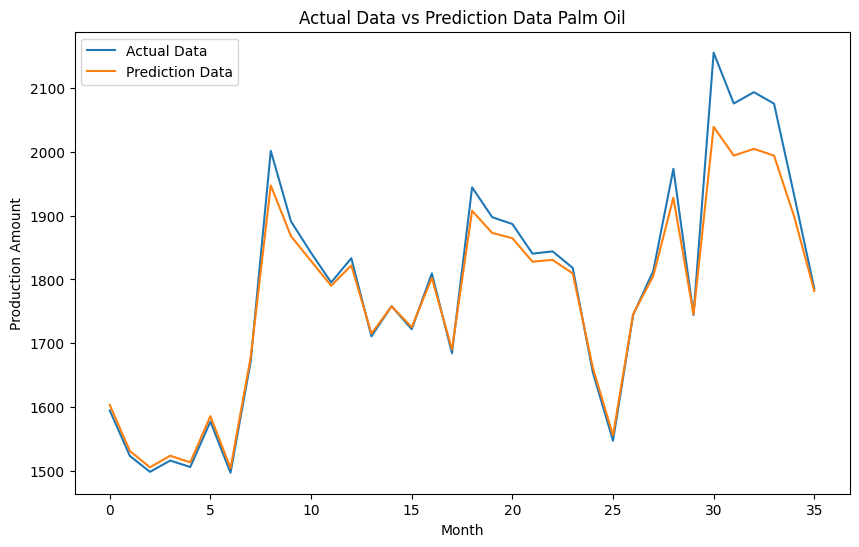



sigmoid-400
2/2 [==============================] - 1s 3ms/step
R2 score: 99.37%


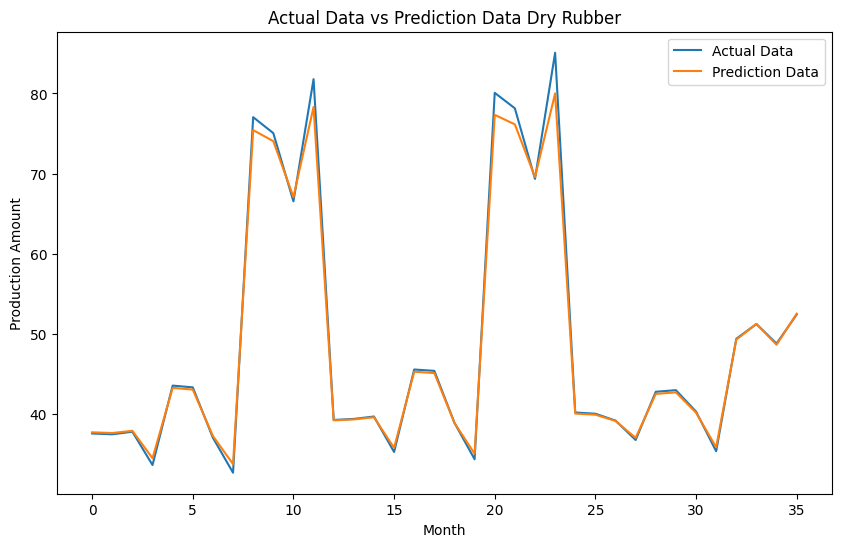



sigmoid-400
2/2 [==============================] - 1s 4ms/step
R2 score: 99.66%


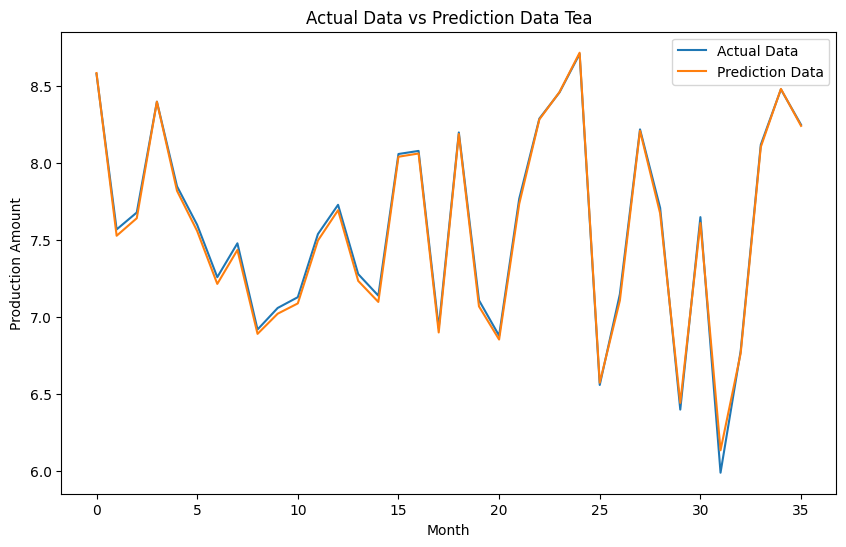



Pembagian 90:10
tanh-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.76%


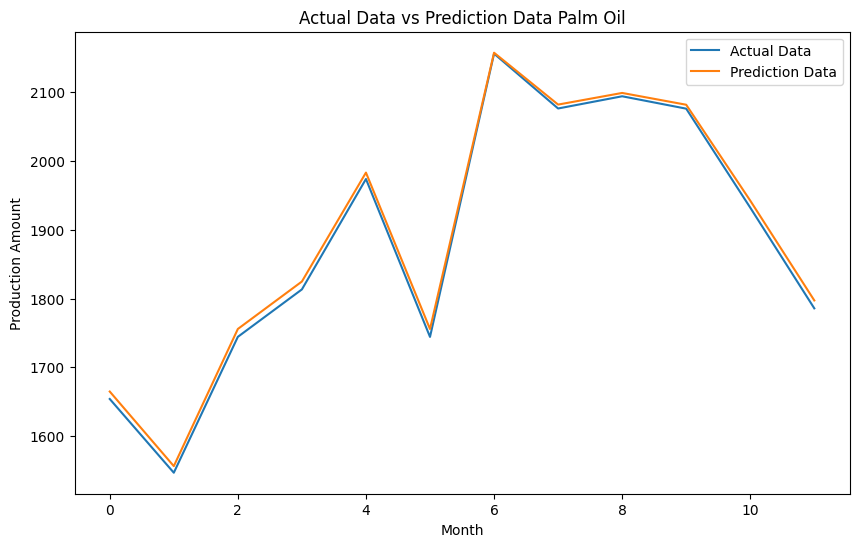



tanh-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.67%


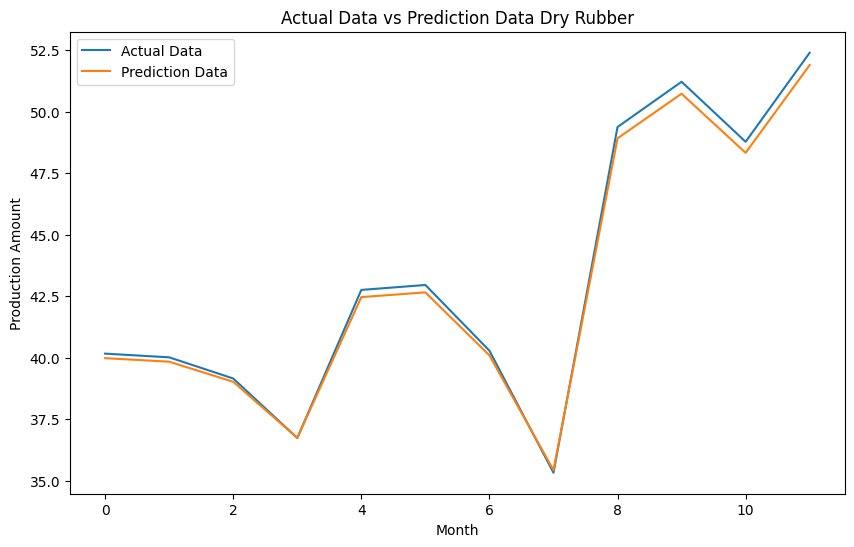



tanh-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.85%


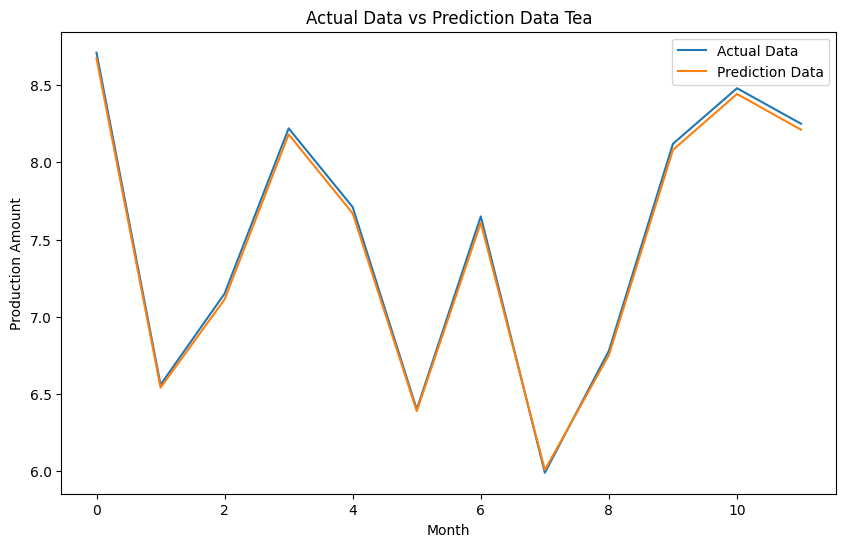



Pembagian 80:20
tanh-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.62%


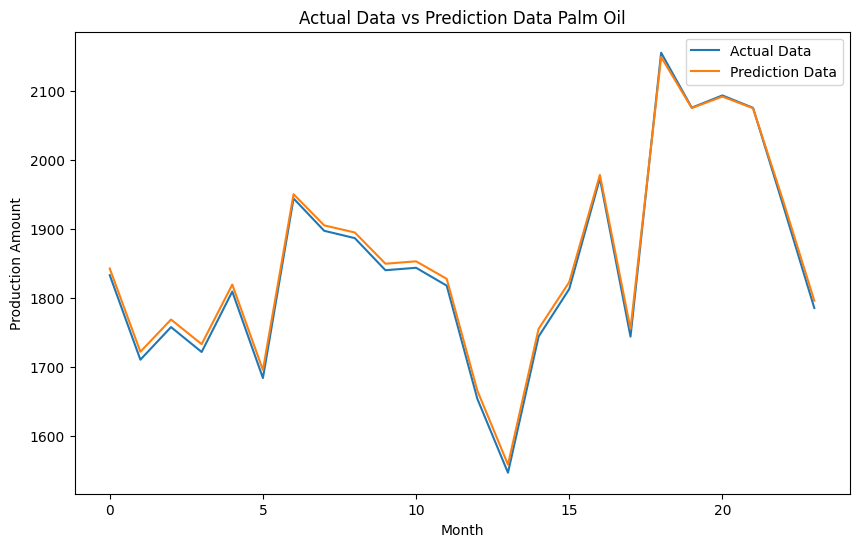



tanh-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.78%


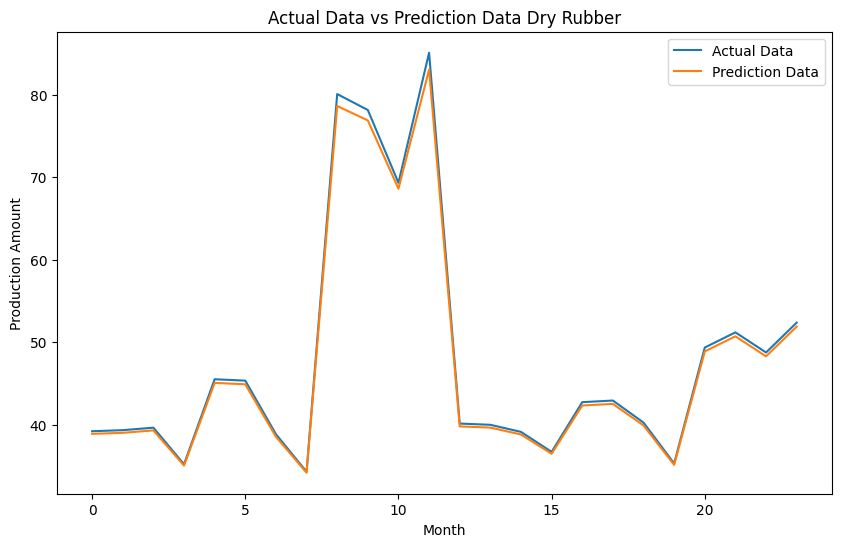



tanh-400
1/1 [==============================] - 1s 1s/step
R2 score: 99.62%


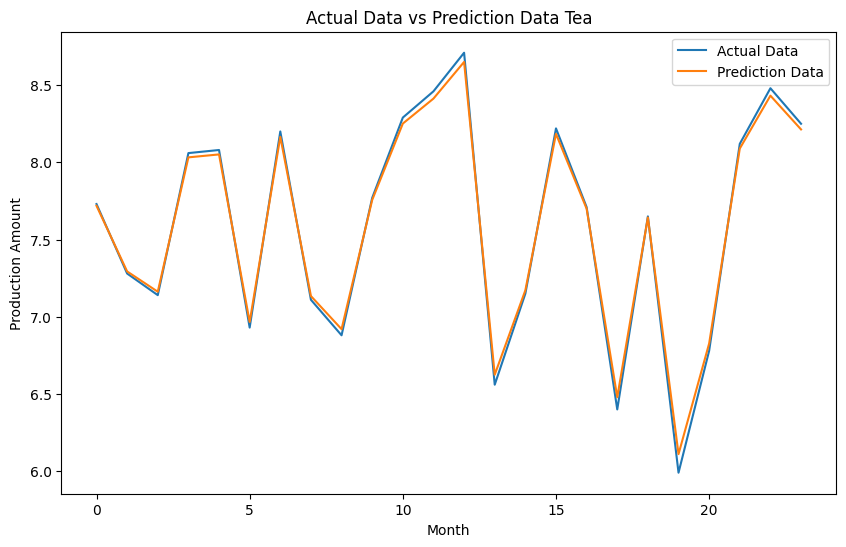



Pembagian 70:30
tanh-400
2/2 [==============================] - 1s 2ms/step
R2 score: 99.28%


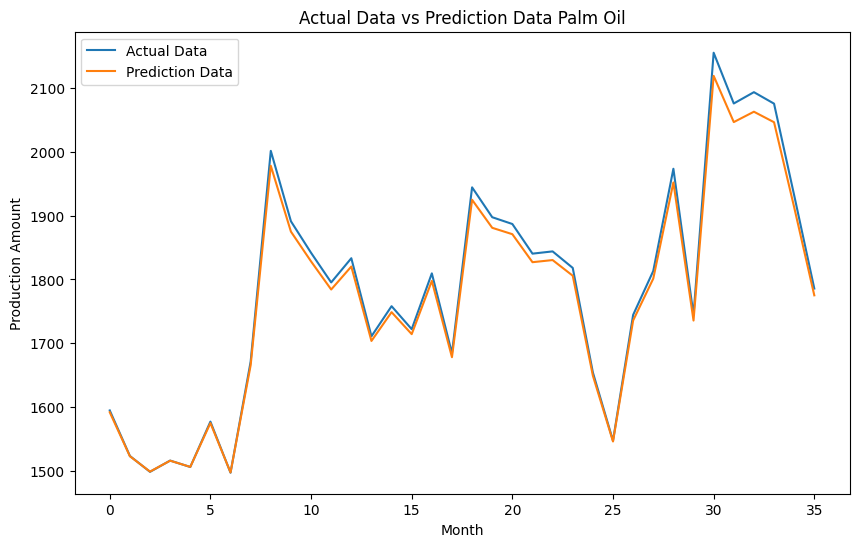



tanh-400
2/2 [==============================] - 1s 4ms/step
R2 score: 99.91%


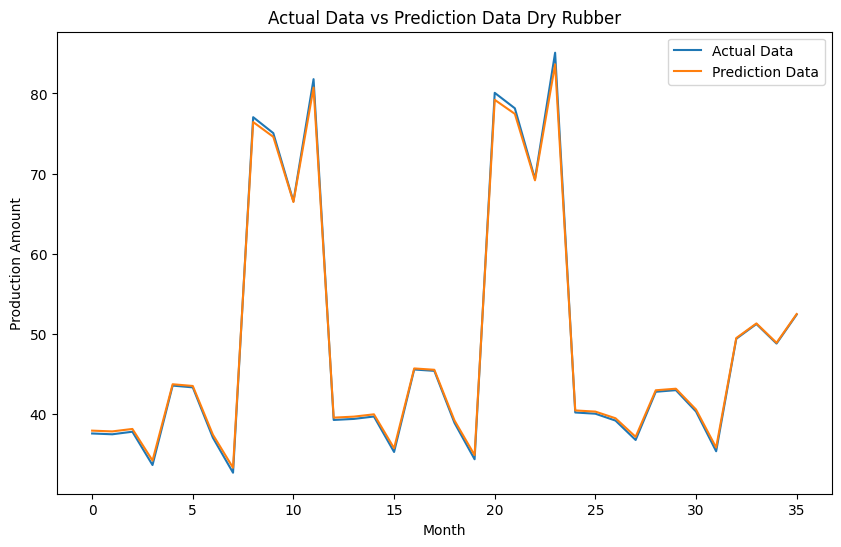



tanh-400
2/2 [==============================] - 2s 3ms/step
R2 score: 99.63%


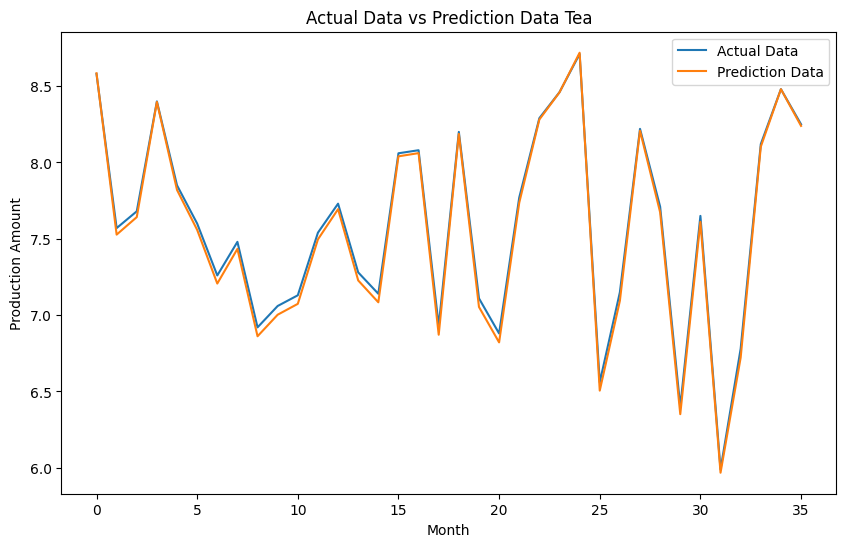



Pembagian 90:10
relu-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.77%


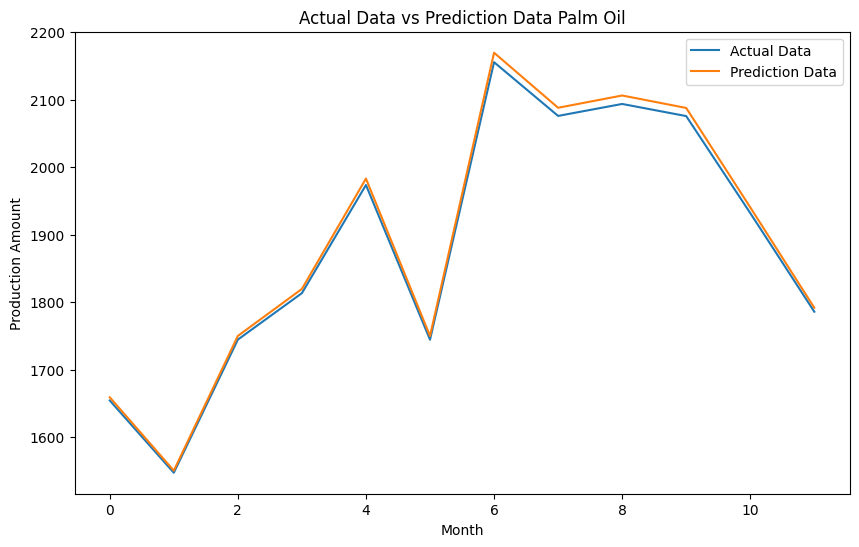



relu-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.64%


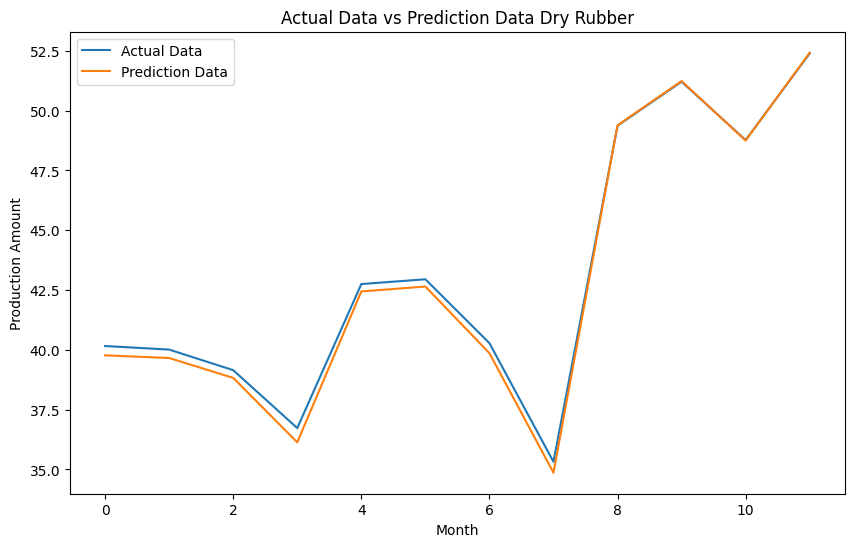



relu-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.73%


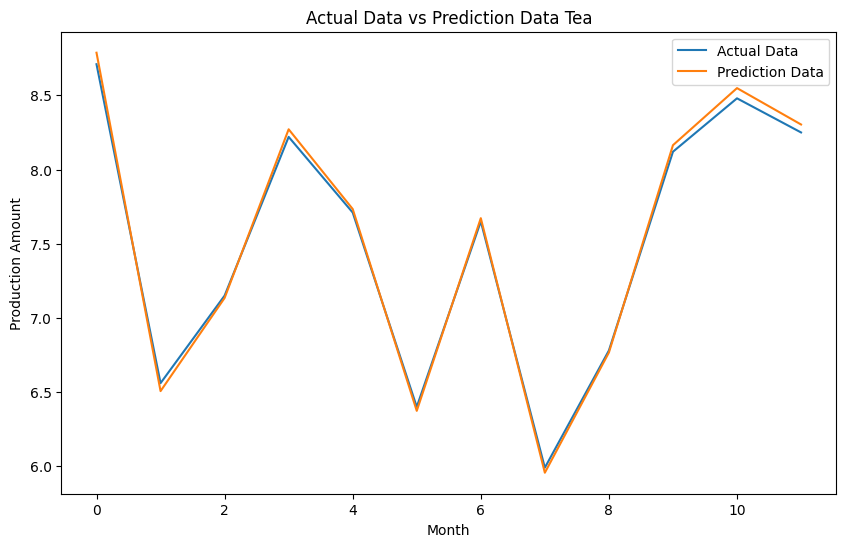



Pembagian 80:20
relu-600
1/1 [==============================] - 1s 1s/step
R2 score: 98.96%


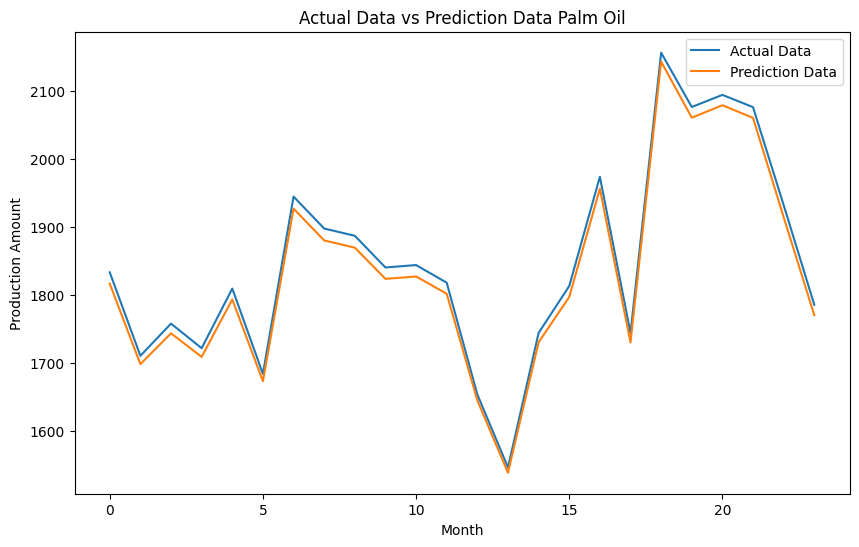



relu-600
1/1 [==============================] - 1s 1s/step
R2 score: 100.00%


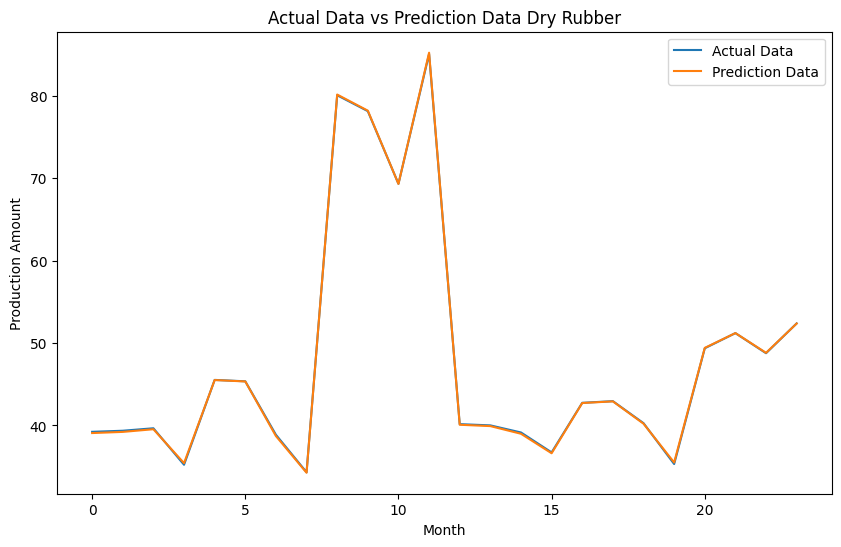



relu-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.74%


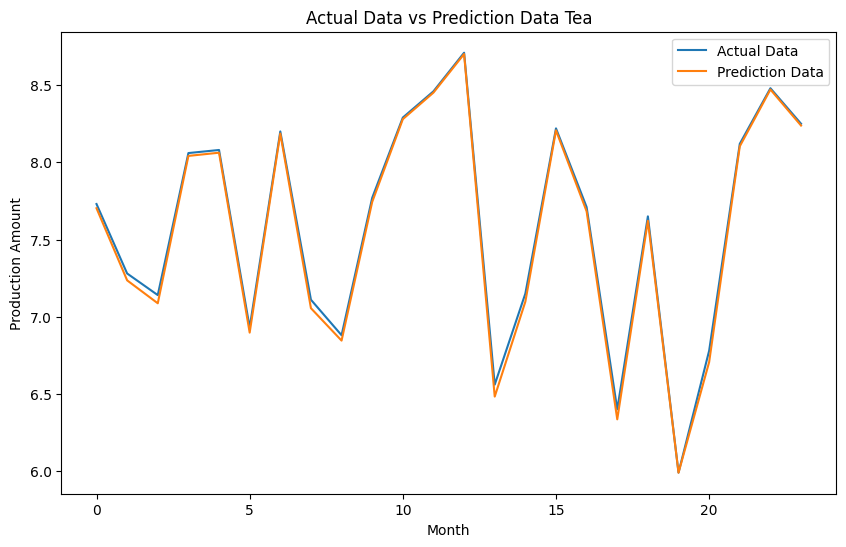



Pembagian 70:30
relu-600
2/2 [==============================] - 1s 8ms/step
R2 score: 99.97%


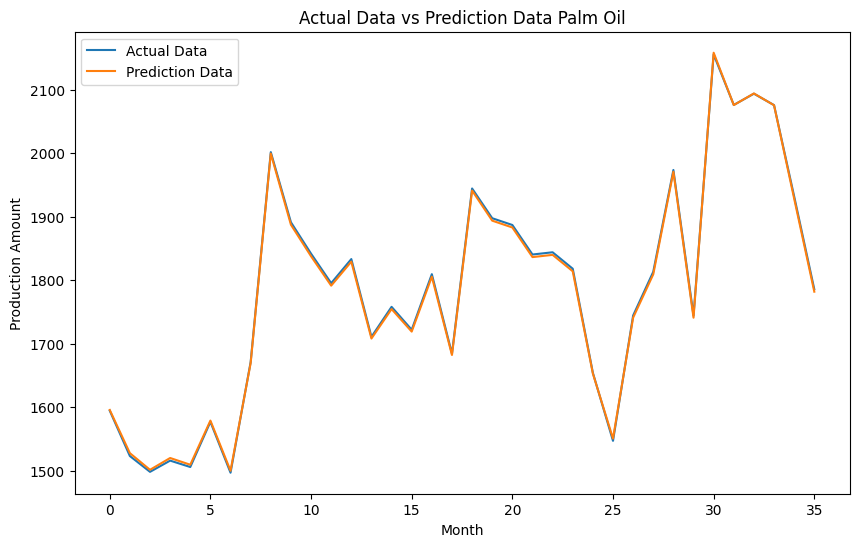



relu-600
2/2 [==============================] - 1s 4ms/step
R2 score: 99.69%


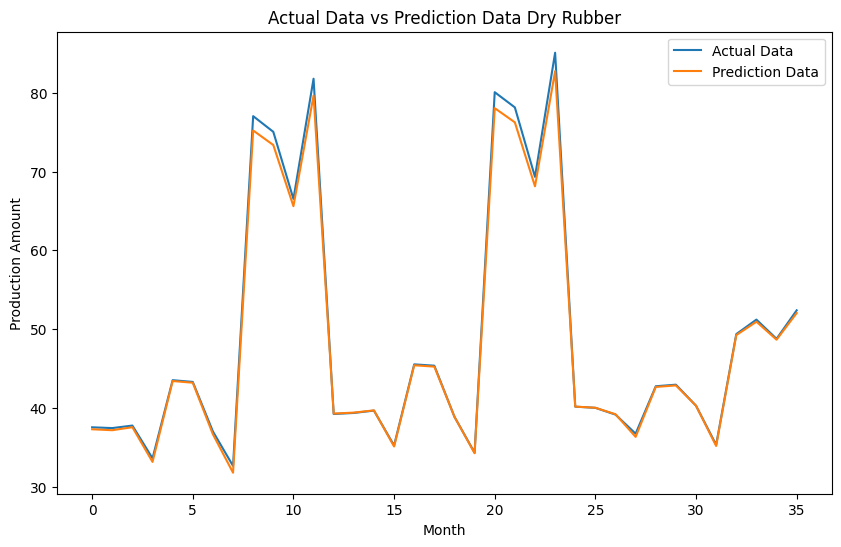



relu-600
2/2 [==============================] - 2s 3ms/step
R2 score: 99.99%


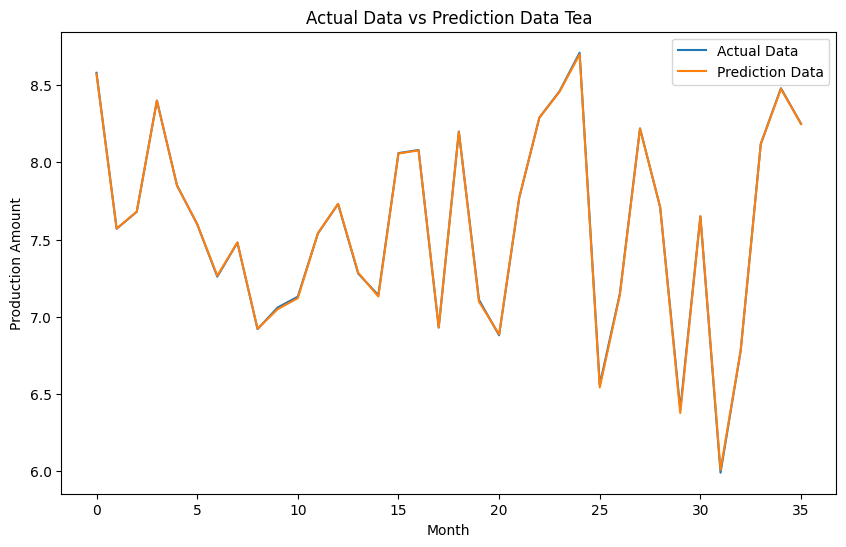



Pembagian 90:10
sigmoid-600
1/1 [==============================] - 1s 1s/step
R2 score: 95.55%


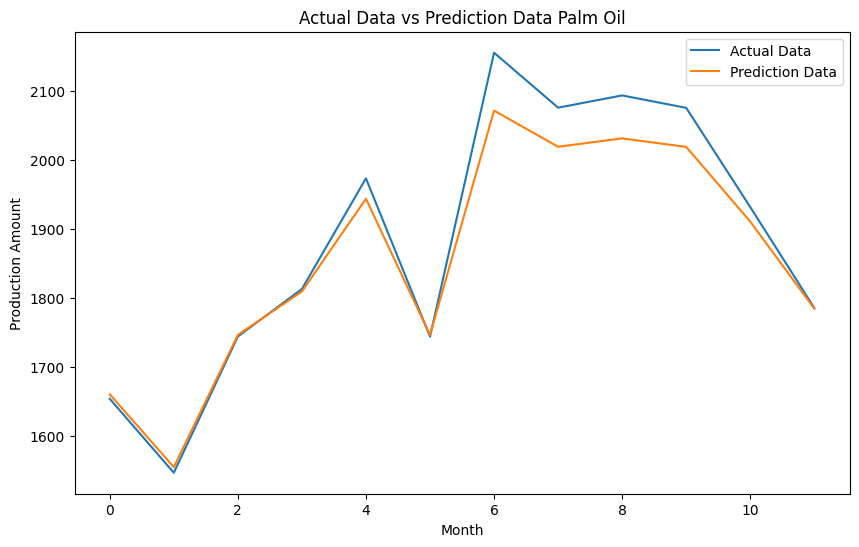



sigmoid-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.65%


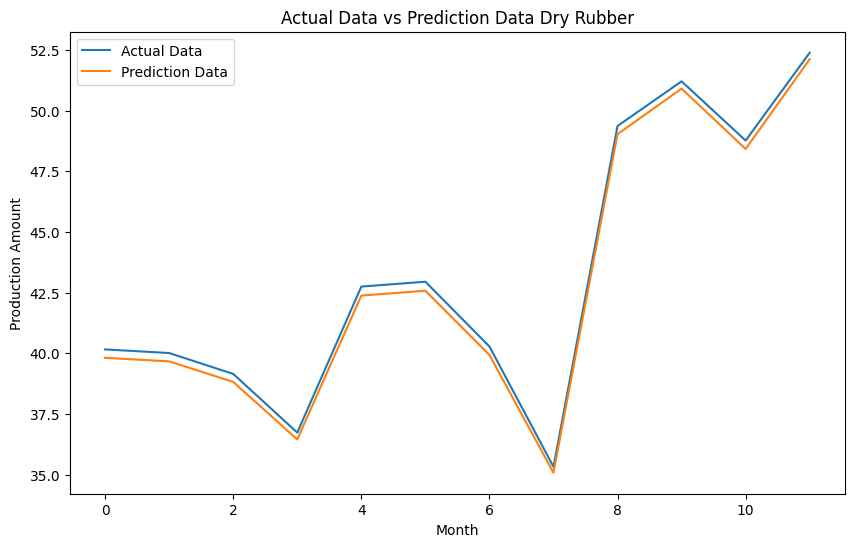



sigmoid-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.98%


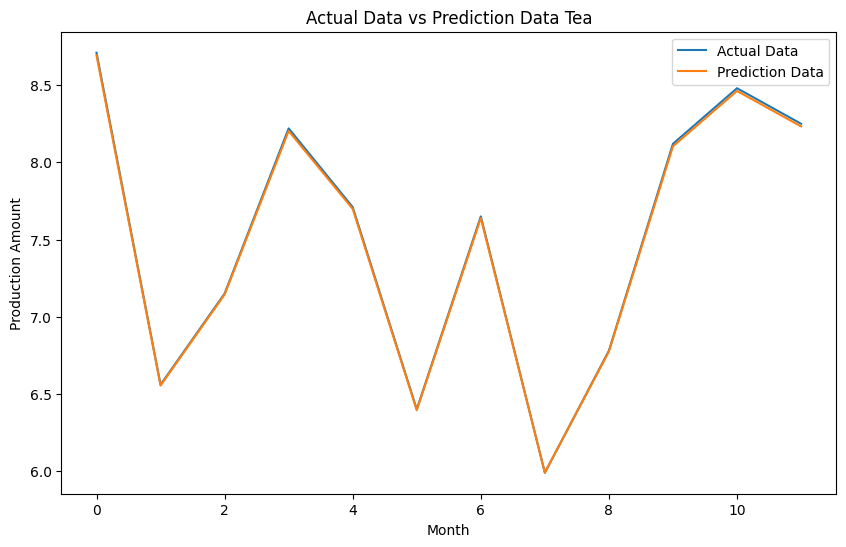



Pembagian 80:20
sigmoid-600
1/1 [==============================] - 1s 1s/step
R2 score: 96.87%


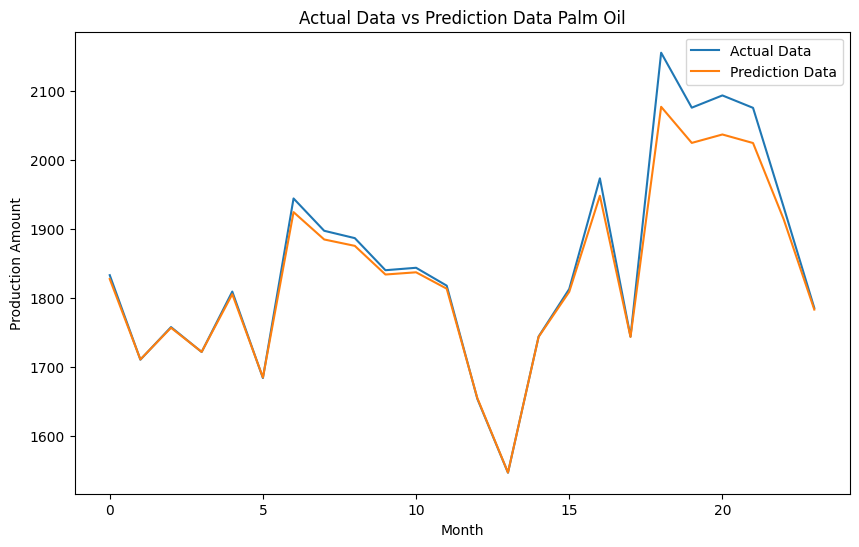



sigmoid-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.89%


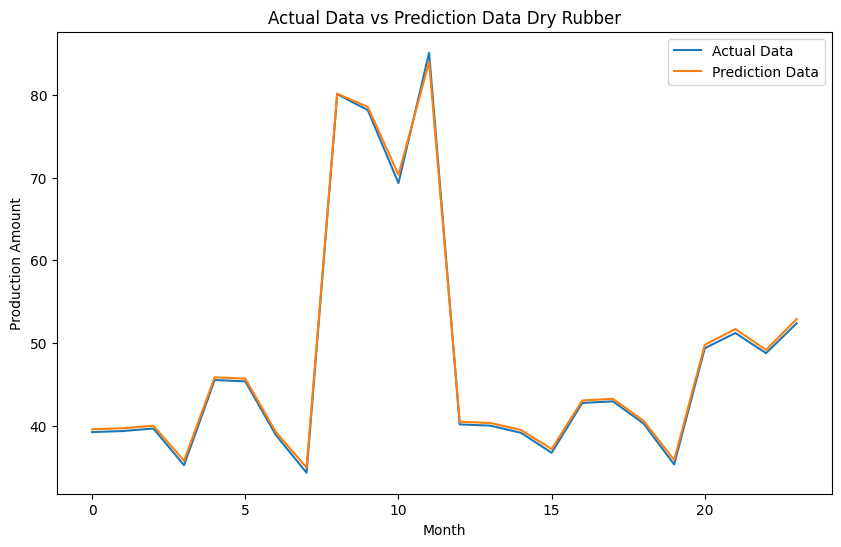



sigmoid-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.98%


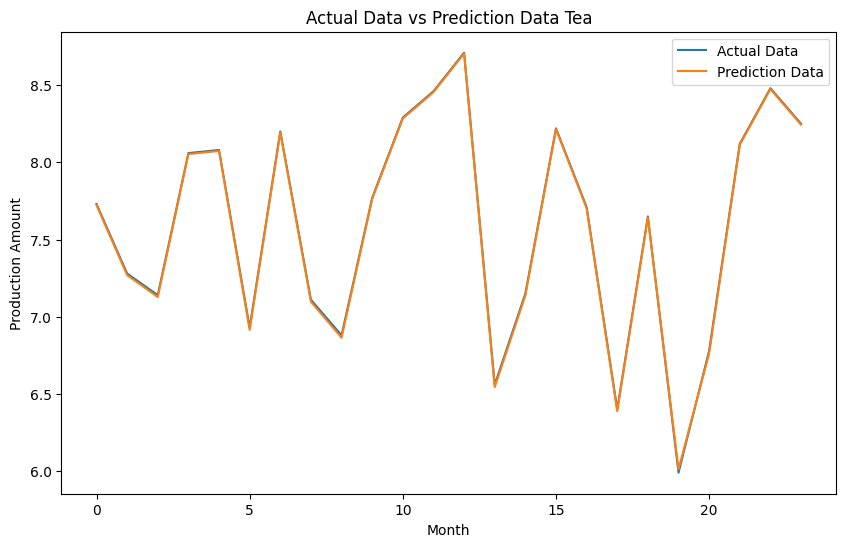



Pembagian 70:30
sigmoid-600
2/2 [==============================] - 1s 3ms/step
R2 score: 94.61%


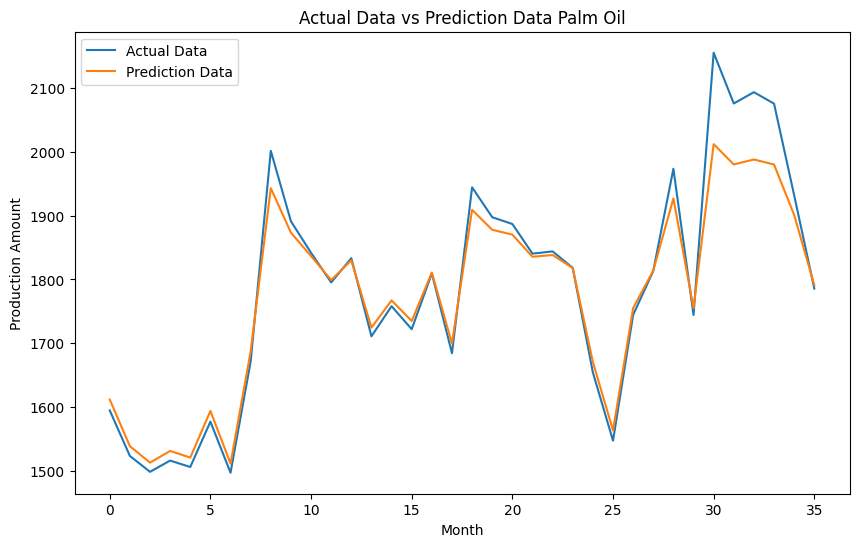



sigmoid-600
2/2 [==============================] - 1s 4ms/step
R2 score: 99.84%


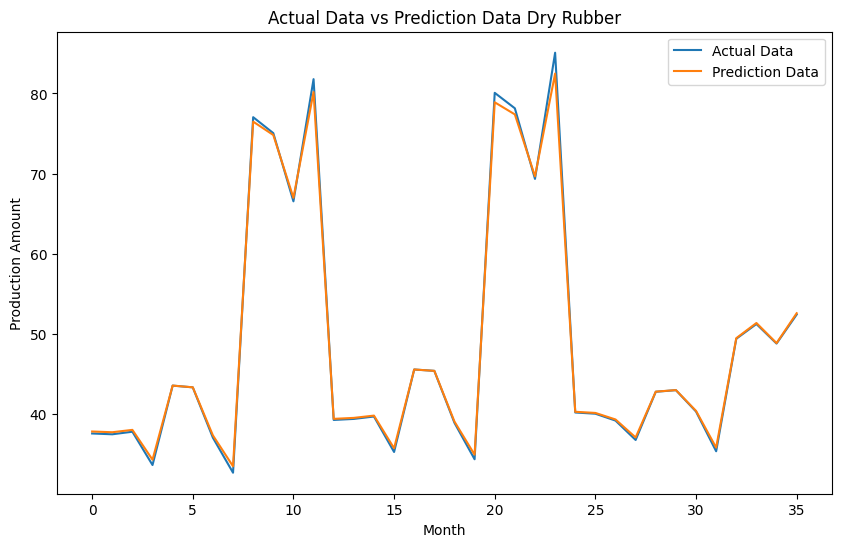



sigmoid-600
2/2 [==============================] - 1s 4ms/step
R2 score: 99.91%


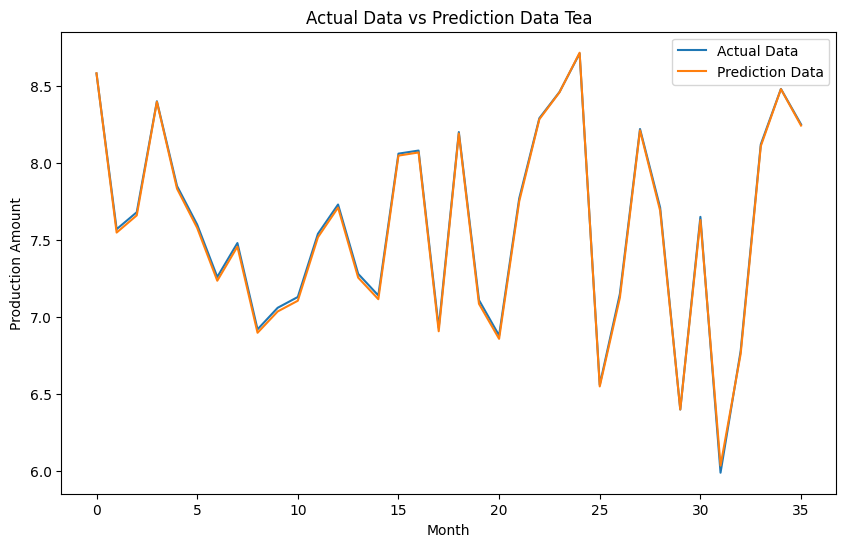



Pembagian 90:10
tanh-600
1/1 [==============================] - 1s 1s/step
R2 score: 98.39%


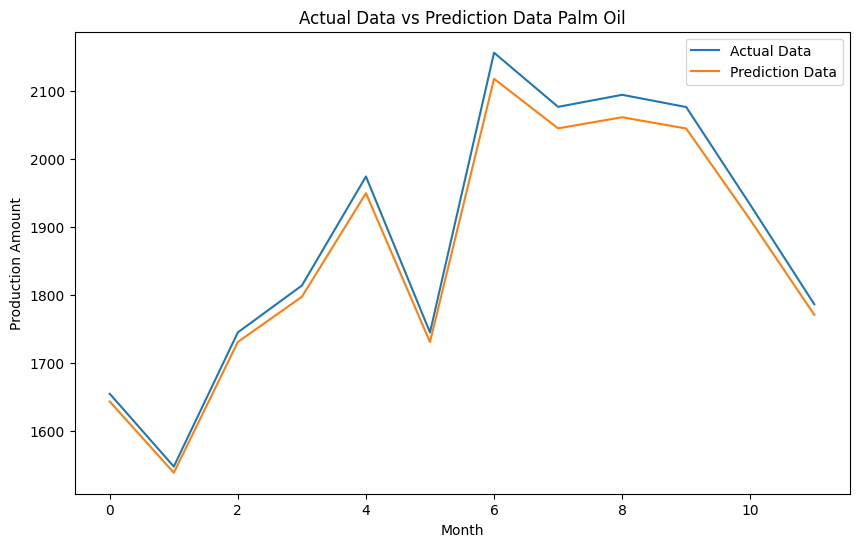



tanh-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.73%


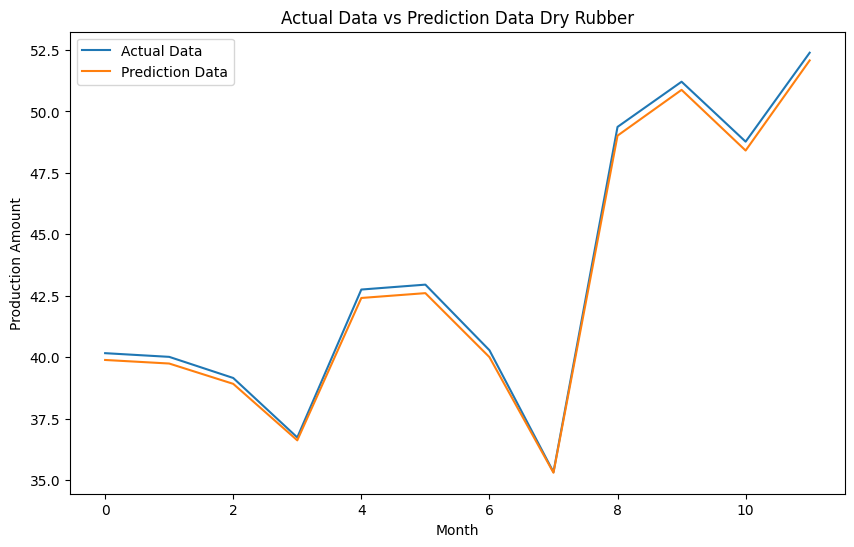



tanh-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.89%


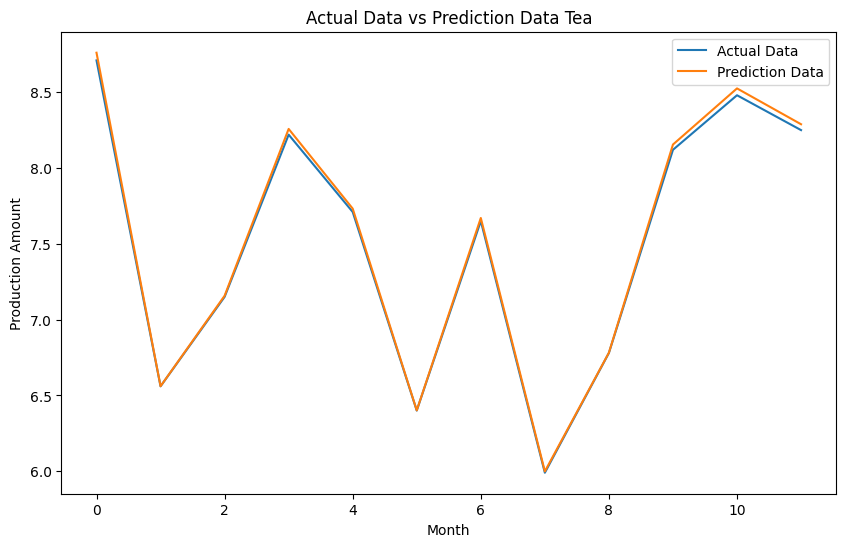



Pembagian 80:20
tanh-600
1/1 [==============================] - 1s 1s/step
R2 score: 96.87%


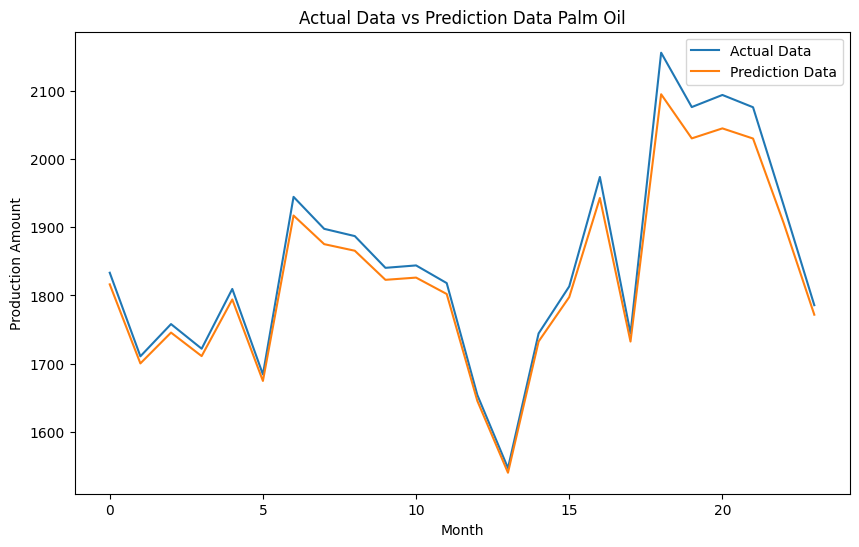



tanh-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.93%


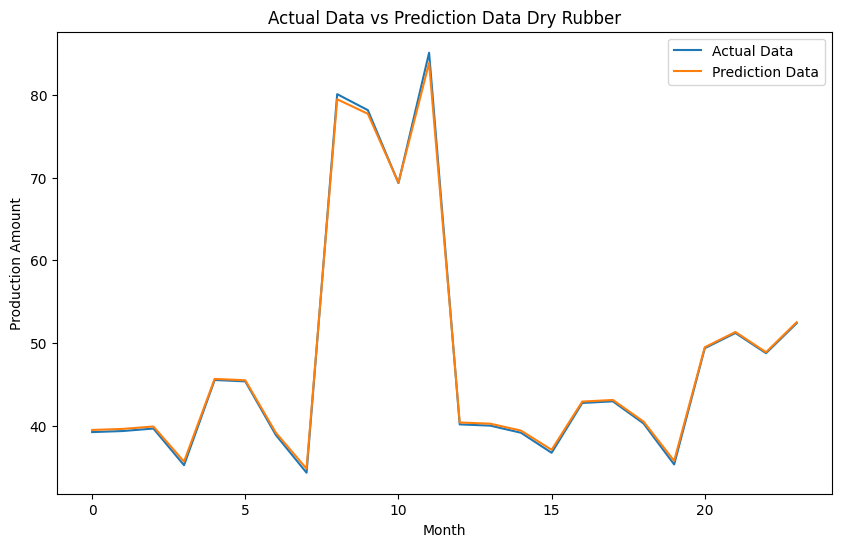



tanh-600
1/1 [==============================] - 1s 1s/step
R2 score: 99.83%


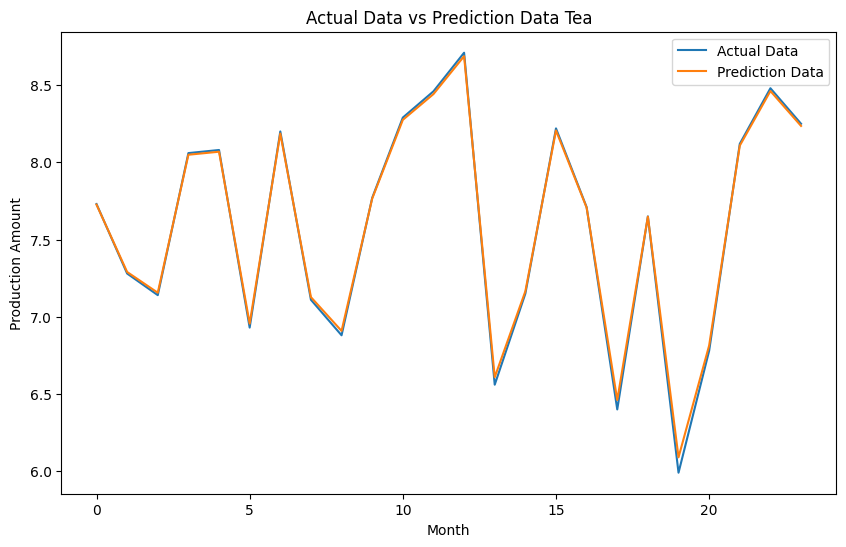



Pembagian 70:30
tanh-600
2/2 [==============================] - 1s 5ms/step
R2 score: 99.63%


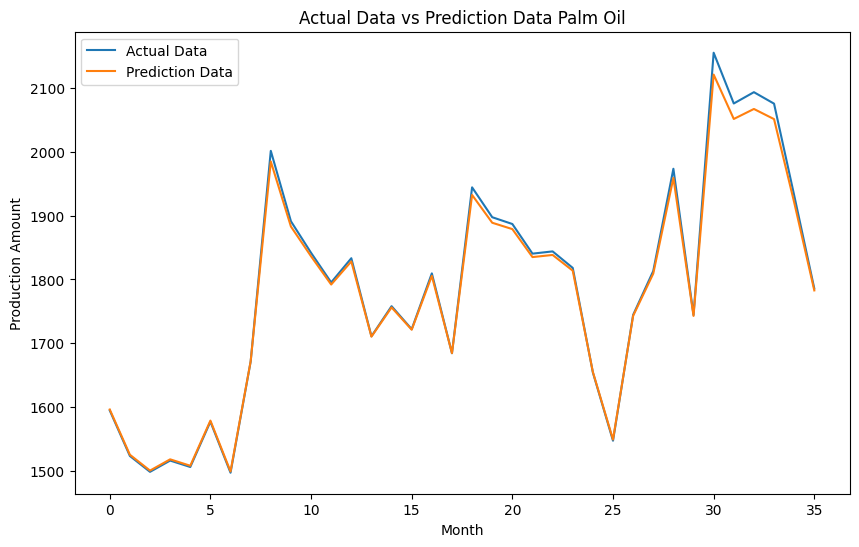



tanh-600
2/2 [==============================] - 1s 2ms/step
R2 score: 99.99%


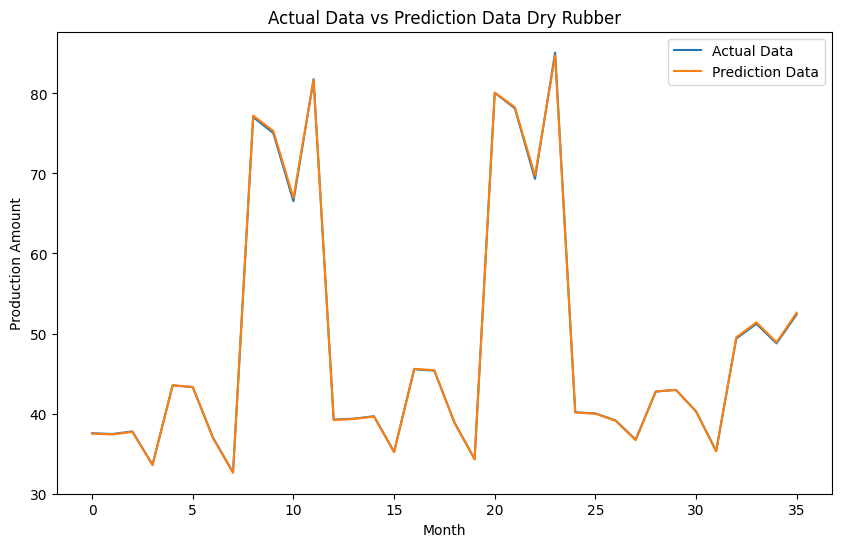



tanh-600
2/2 [==============================] - 1s 4ms/step
R2 score: 99.86%


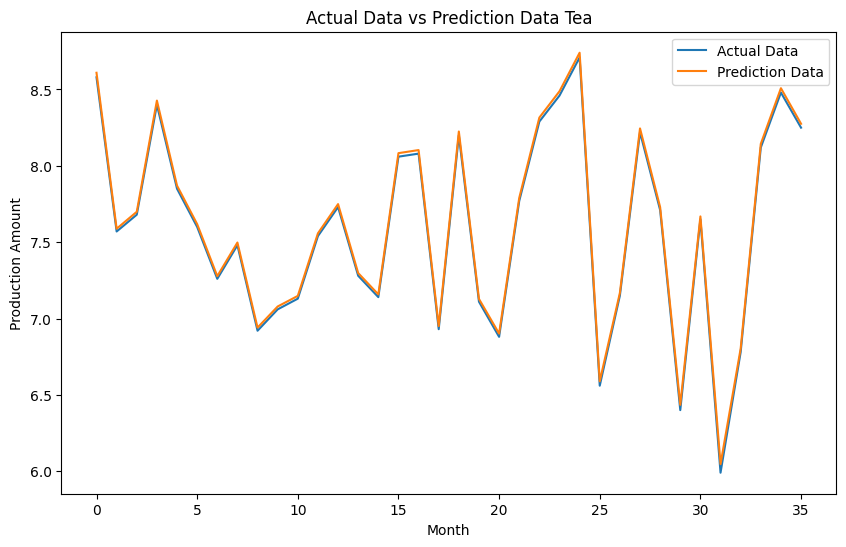



Pembagian 90:10
relu-1000
1/1 [==============================] - 1s 1s/step
R2 score: 99.97%


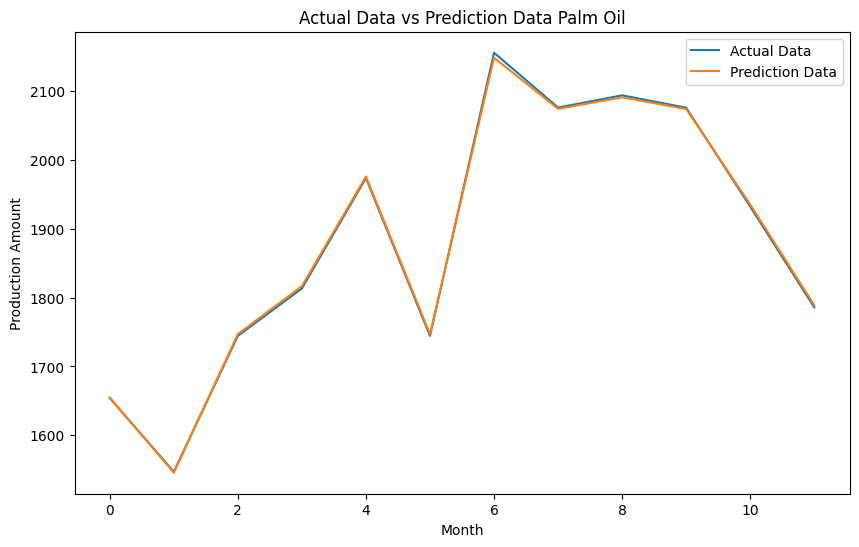



relu-1000
1/1 [==============================] - 1s 1s/step
R2 score: 99.83%


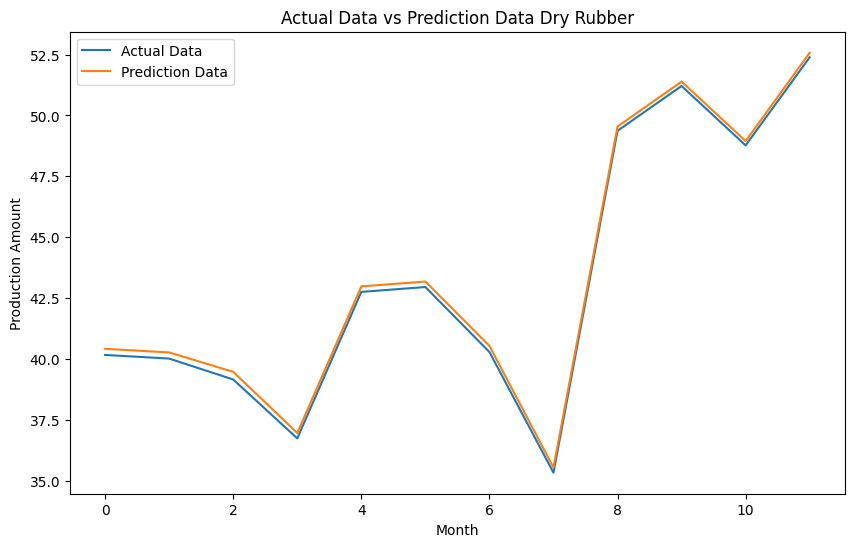



relu-1000
1/1 [==============================] - 1s 1s/step
R2 score: 99.95%


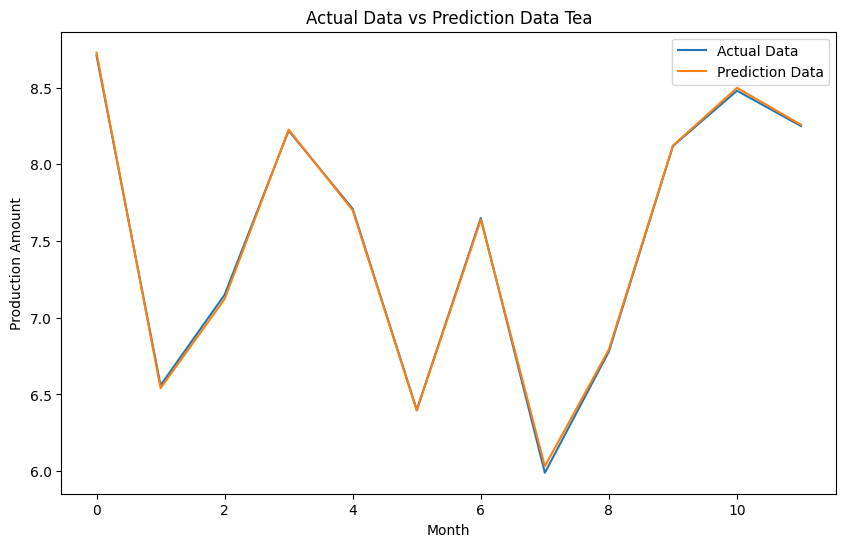



Pembagian 80:20
relu-1000
1/1 [==============================] - 1s 1s/step
R2 score: 99.83%


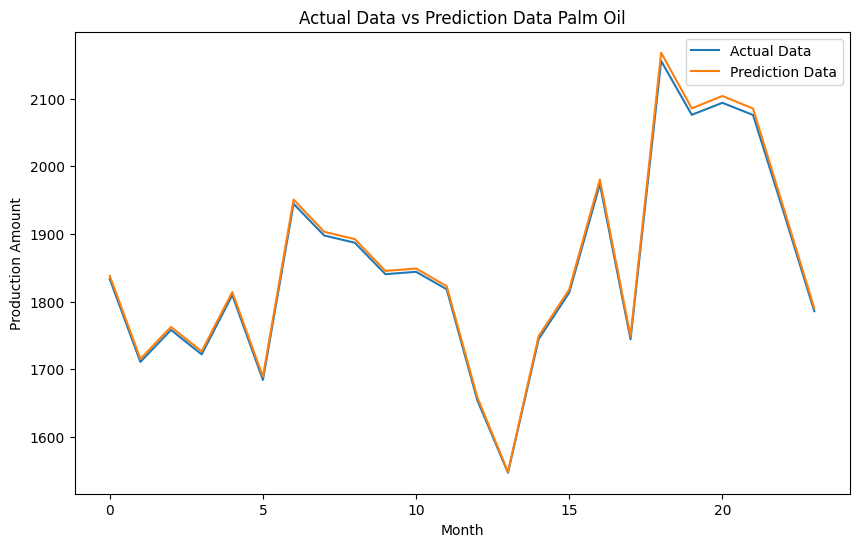



relu-1000
1/1 [==============================] - 1s 1s/step
R2 score: 99.75%


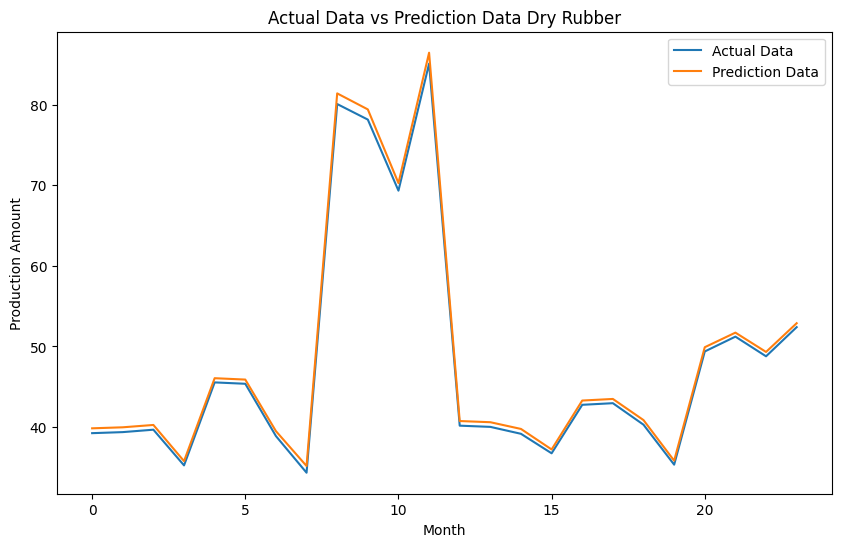



relu-1000
1/1 [==============================] - 1s 1s/step
R2 score: 99.92%


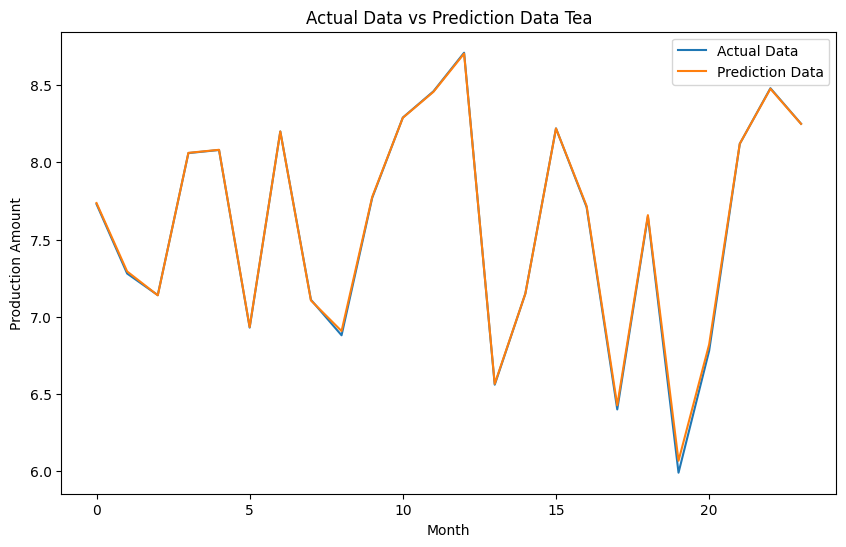



Pembagian 70:30
relu-1000
2/2 [==============================] - 1s 4ms/step
R2 score: 99.96%


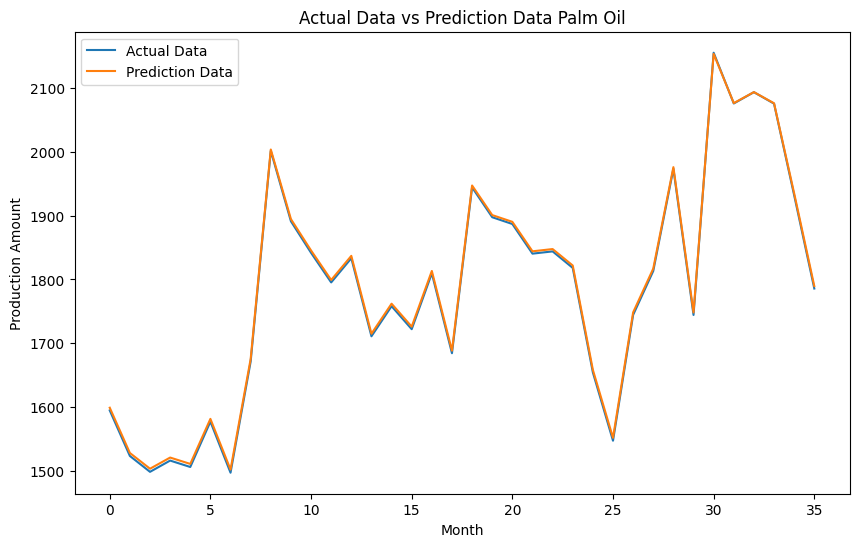



relu-1000
2/2 [==============================] - 1s 3ms/step
R2 score: 99.95%


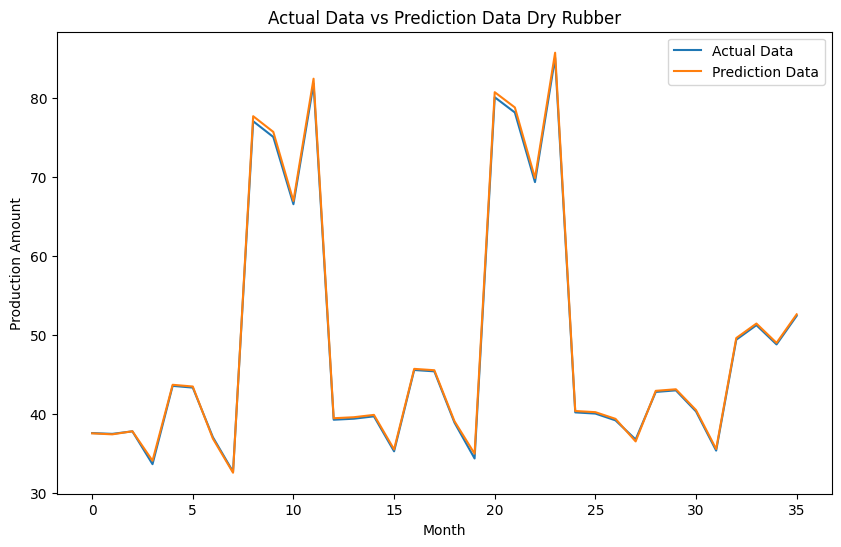



relu-1000
2/2 [==============================] - 1s 4ms/step
R2 score: 99.79%


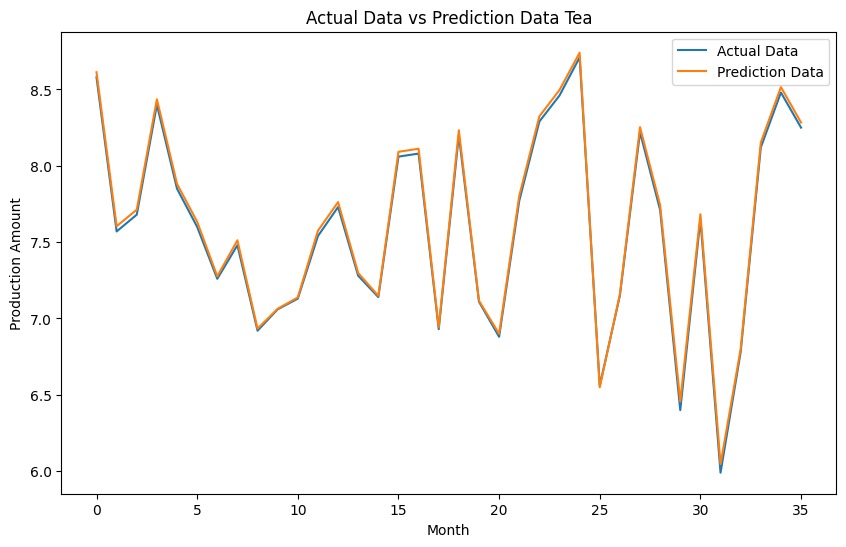



Pembagian 90:10
sigmoid-1000
1/1 [==============================] - 1s 970ms/step
R2 score: 97.84%


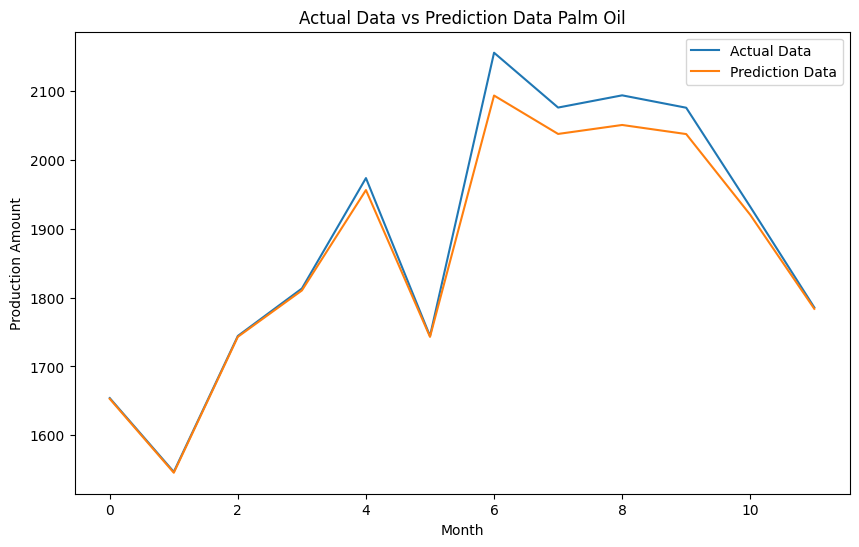



sigmoid-1000
1/1 [==============================] - 1s 965ms/step
R2 score: 99.58%


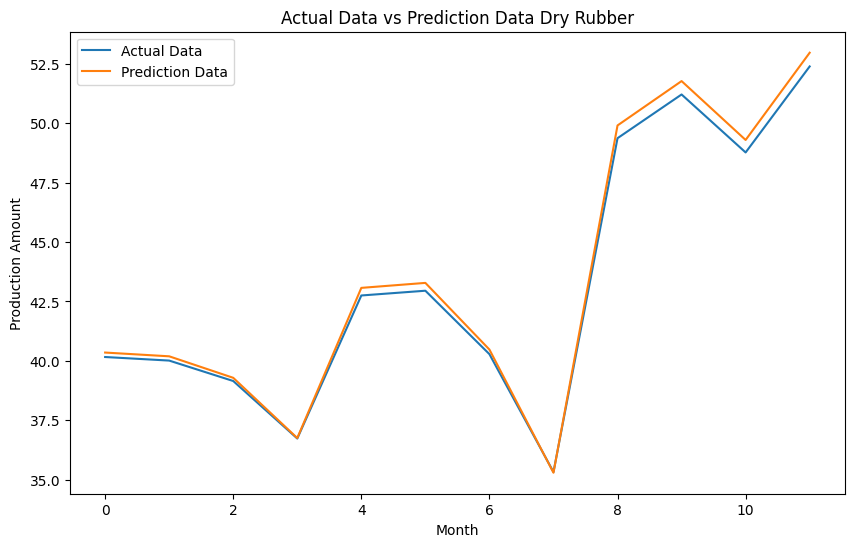



sigmoid-1000
1/1 [==============================] - 1s 958ms/step
R2 score: 99.81%


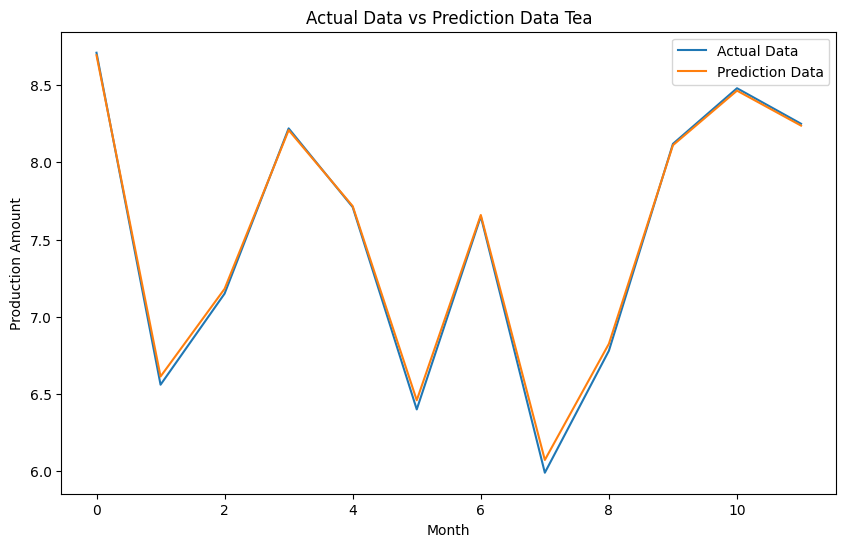



Pembagian 80:20
sigmoid-1000
1/1 [==============================] - 1s 939ms/step
R2 score: 99.33%


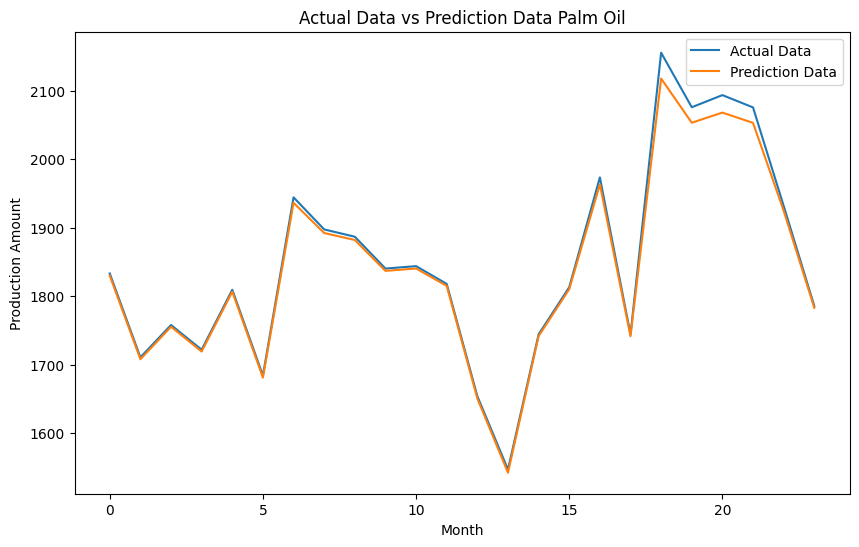



sigmoid-1000
1/1 [==============================] - 1s 923ms/step
R2 score: 99.91%


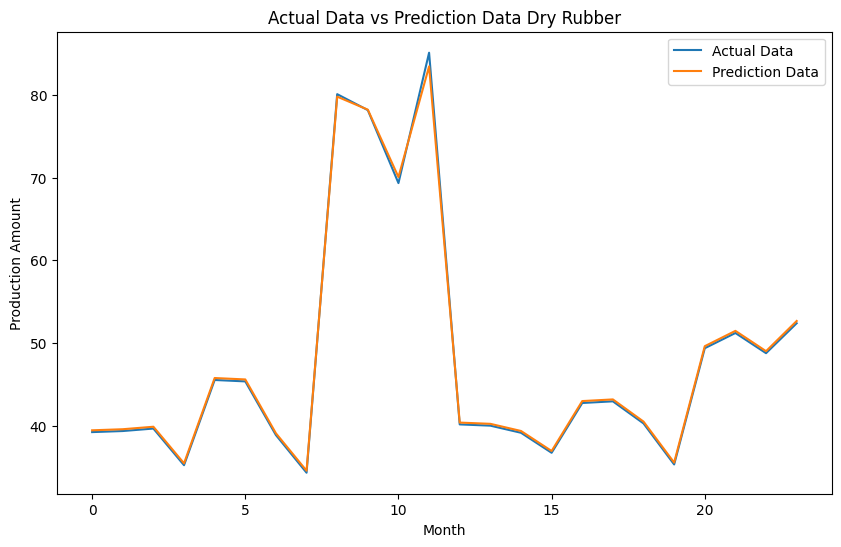



sigmoid-1000
1/1 [==============================] - 1s 965ms/step
R2 score: 99.99%


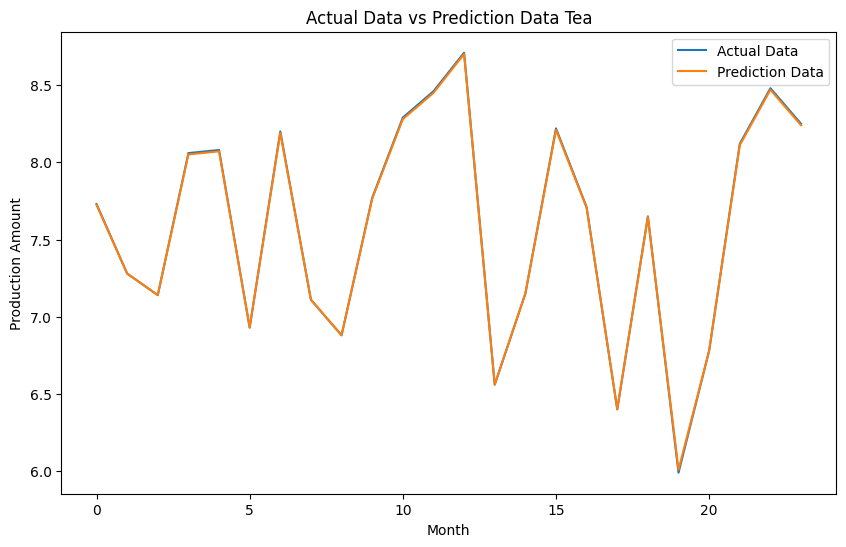



Pembagian 70:30
sigmoid-1000
2/2 [==============================] - 1s 3ms/step
R2 score: 98.43%


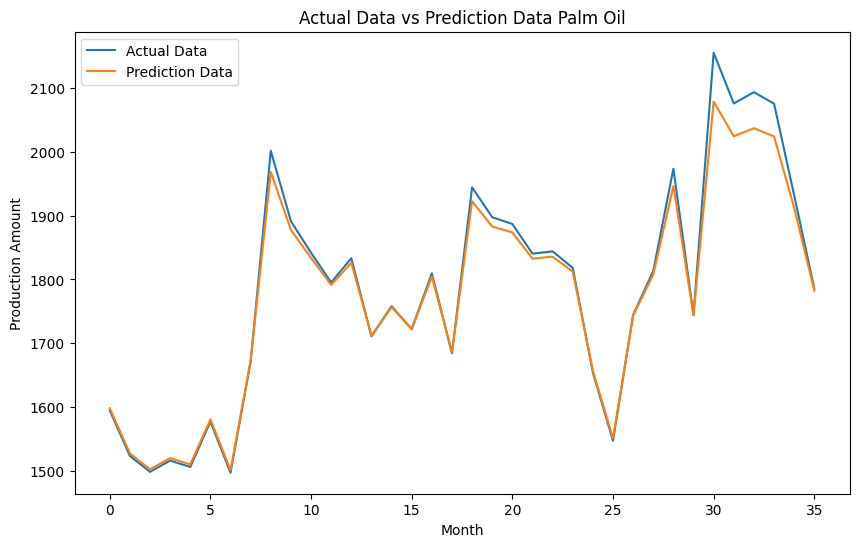



sigmoid-1000
2/2 [==============================] - 1s 5ms/step
R2 score: 99.63%


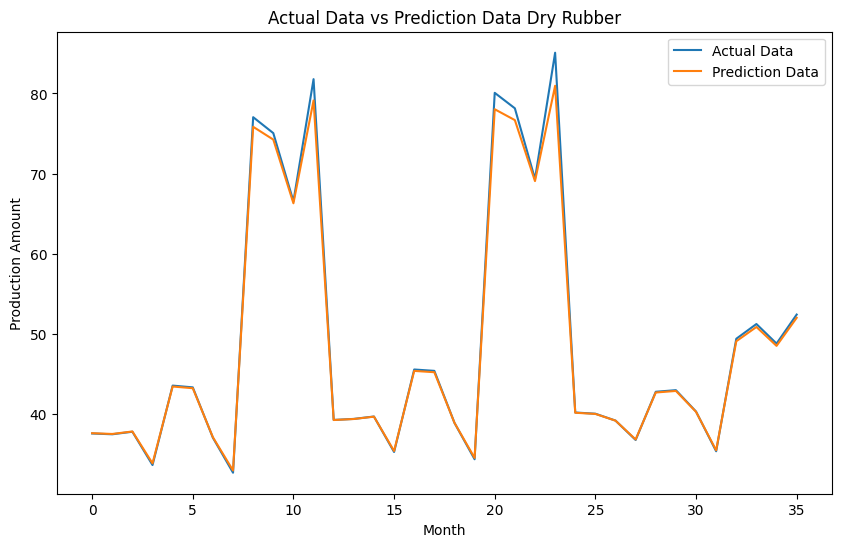



sigmoid-1000
2/2 [==============================] - 1s 4ms/step
R2 score: 99.96%


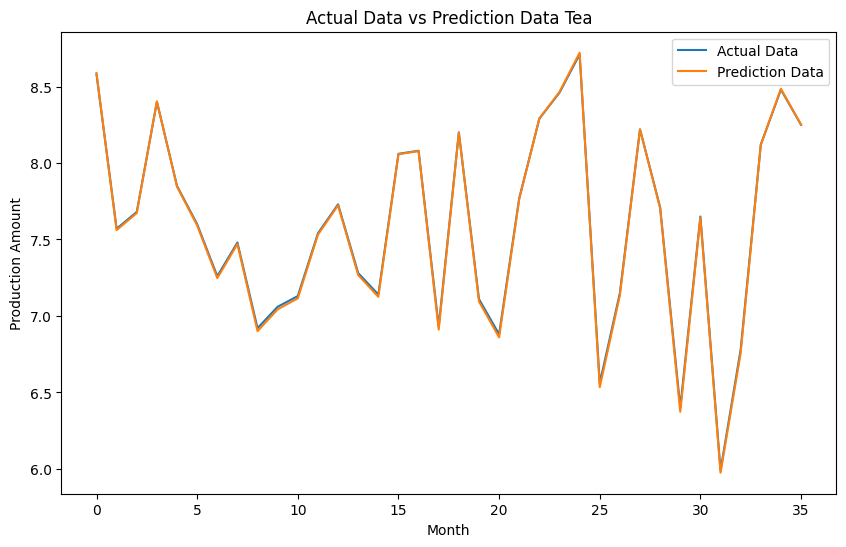



Pembagian 90:10
tanh-1000
1/1 [==============================] - 1s 944ms/step
R2 score: 99.92%


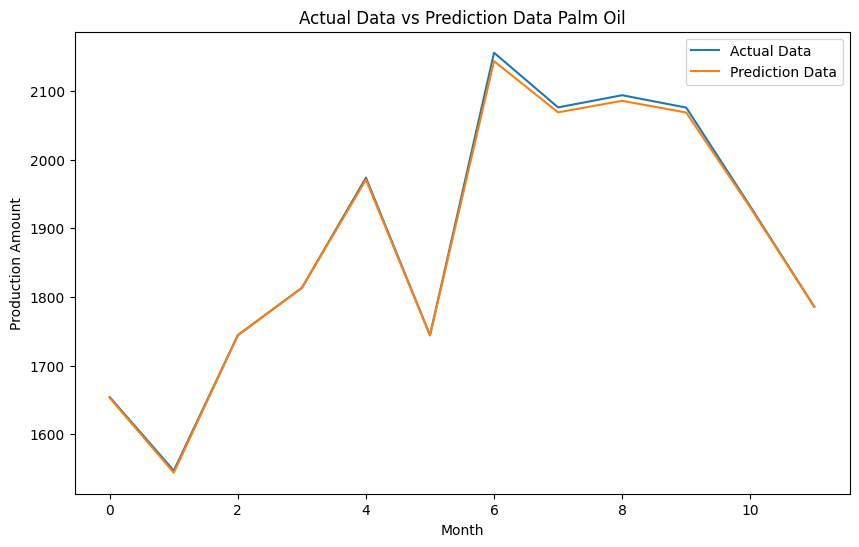



tanh-1000
1/1 [==============================] - 1s 973ms/step
R2 score: 99.94%


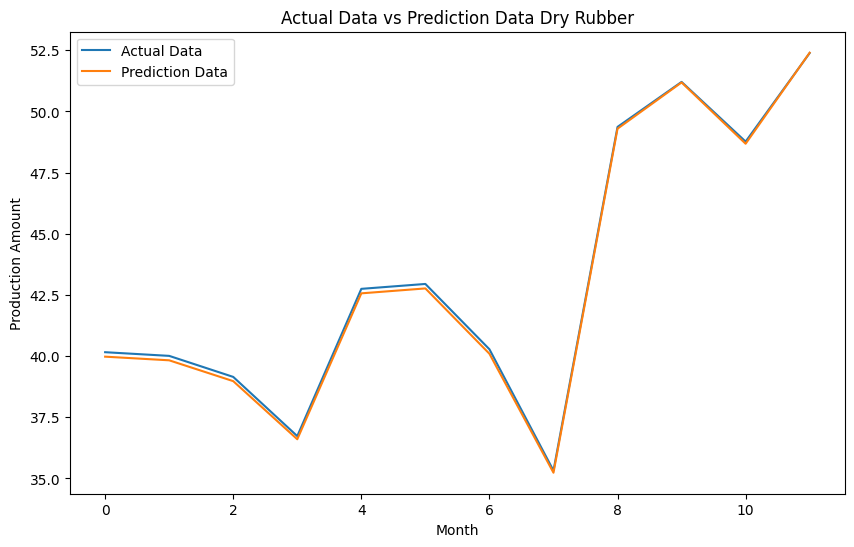



tanh-1000
1/1 [==============================] - 1s 938ms/step
R2 score: 99.52%


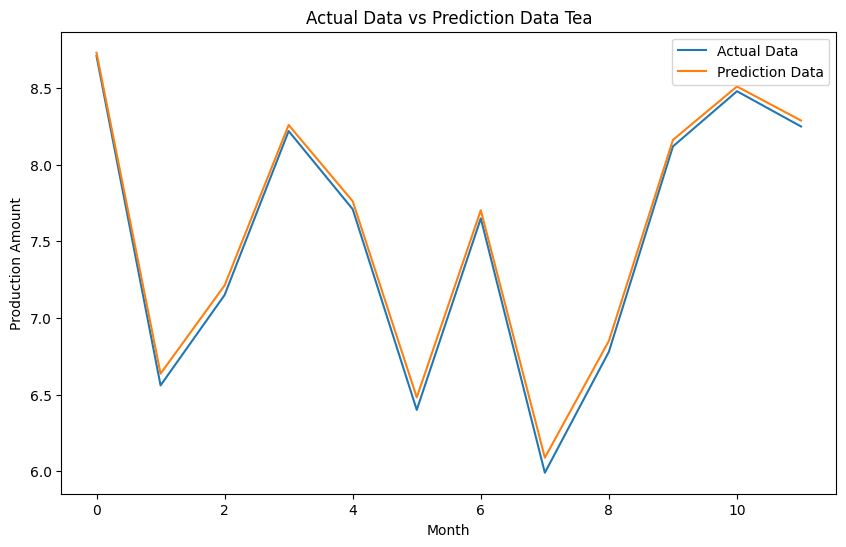



Pembagian 80:20
tanh-1000
1/1 [==============================] - 1s 943ms/step
R2 score: 97.39%


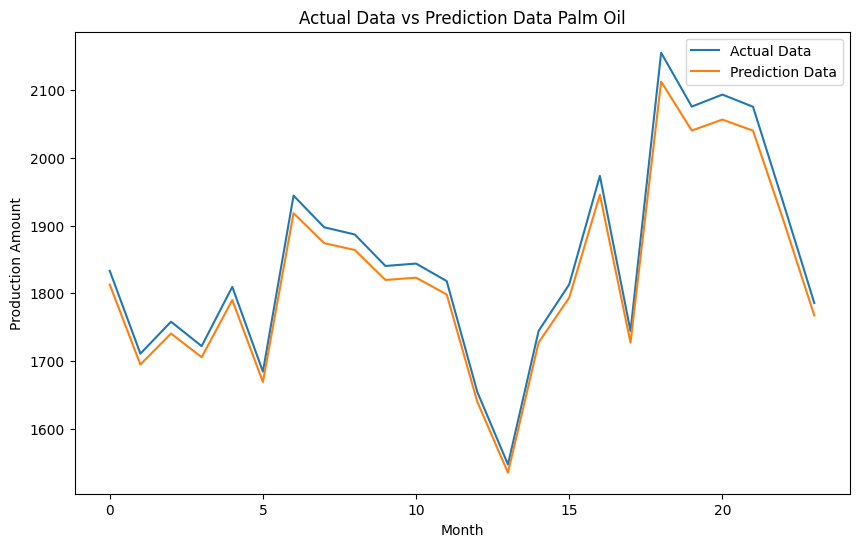



tanh-1000
1/1 [==============================] - 1s 1s/step
R2 score: 99.97%


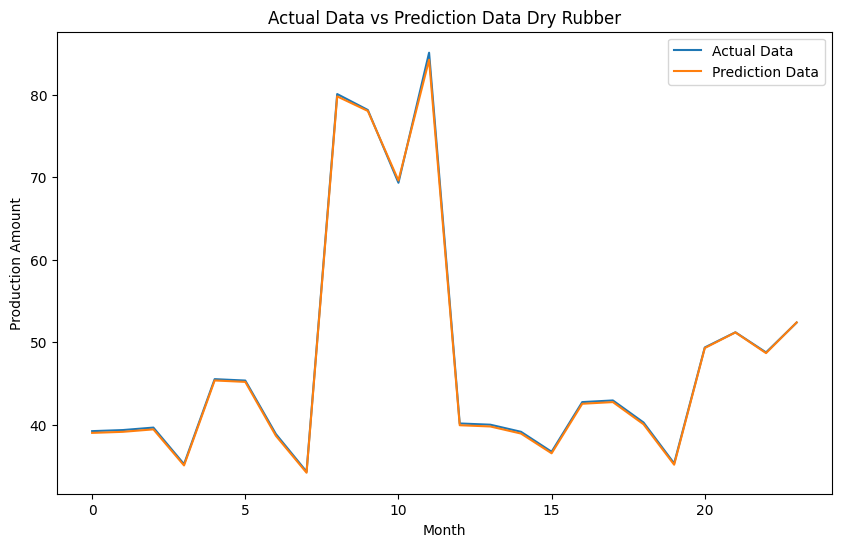



tanh-1000
1/1 [==============================] - 1s 961ms/step
R2 score: 99.71%


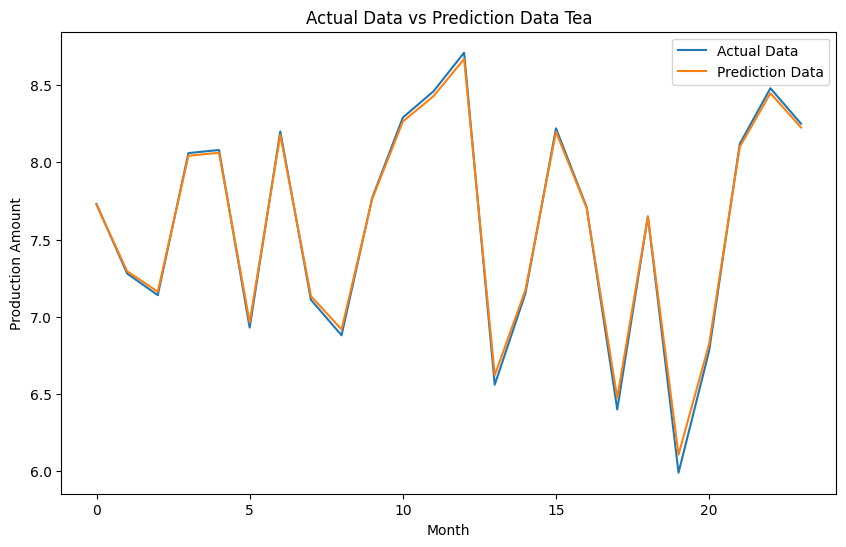



Pembagian 70:30
tanh-1000
2/2 [==============================] - 1s 3ms/step
R2 score: 99.83%


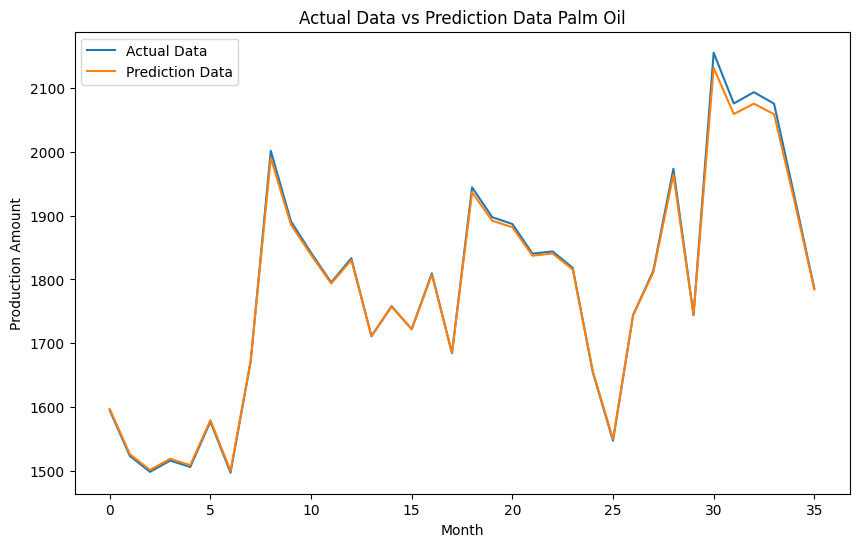



tanh-1000
2/2 [==============================] - 1s 3ms/step
R2 score: 99.96%


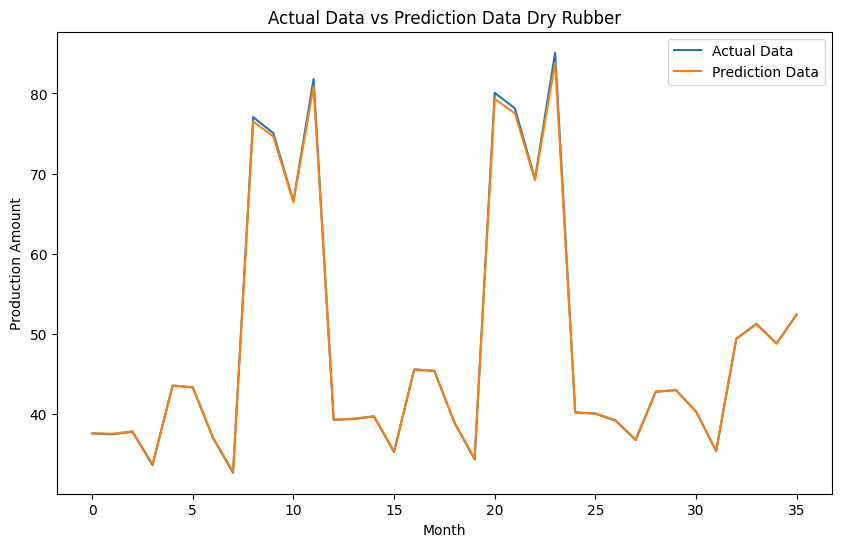



tanh-1000
2/2 [==============================] - 1s 4ms/step
R2 score: 99.92%


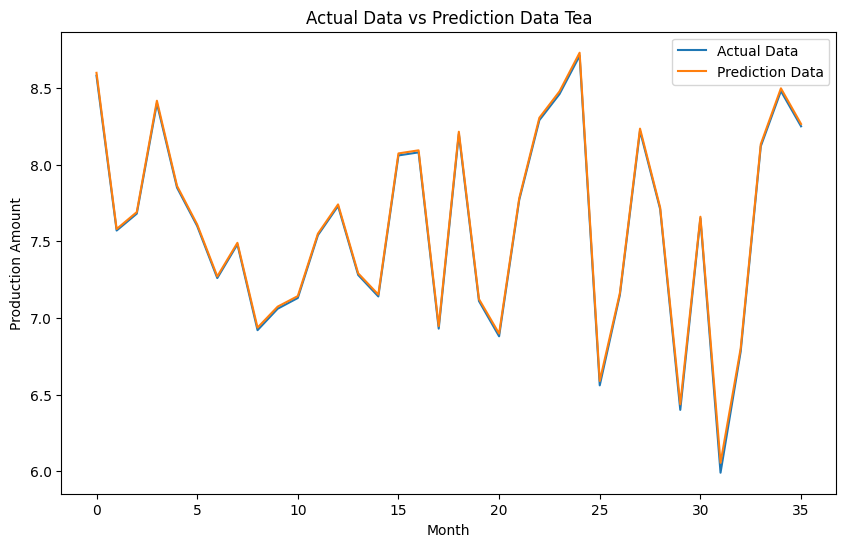

In [36]:
print("Pembagian 90:10")

print("relu-100")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 100, 60, 'relu')
print("relu-100")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 100, 60, 'relu')
print("relu-100")
model_lstm(teh, 'Tea', 0.1, 100, 60, 'relu')


print("Pembagian 80:20")


print("relu-100")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 100, 60, 'relu')
print("relu-100")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 100, 60, 'relu')
print("relu-100")
model_lstm(teh, 'Tea', 0.2, 100, 60, 'relu')


print("Pembagian 70:30")

print("relu-100")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 100, 60, 'relu')
print("relu-100")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 100, 60, 'relu')
print("relu-100")
model_lstm(teh, 'Tea', 0.3, 100, 60, 'relu')

print("==============================================")


print("Pembagian 90:10")


print("sigmoid-100")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 100, 60, 'sigmoid')
print("sigmoid-100")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 100, 60, 'sigmoid')
print("sigmoid-100")
model_lstm(teh, 'Tea', 0.1, 100, 60, 'sigmoid')


print("Pembagian 80:20")

print("sigmoid-100")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 100, 60, 'sigmoid')
print("sigmoid-100")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 100, 60, 'sigmoid')
print("sigmoid-100")
model_lstm(teh, 'Tea', 0.2, 100, 60, 'sigmoid')


print("Pembagian 70:30")

print("sigmoid-100")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 100, 60, 'sigmoid')
print("sigmoid-100")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 100, 60, 'sigmoid')
print("sigmoid-100")
model_lstm(teh, 'Tea', 0.3, 100, 60, 'sigmoid')

print("==============================================")

print("Pembagian 90:10")

print("tanh-100")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 100, 60, 'tanh')
print("tanh-100")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 100, 60, 'tanh')
print("tanh-100")
model_lstm(teh, 'Tea', 0.1, 100, 60, 'tanh')



print("Pembagian 80:20")

print("tanh-100")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 100, 60, 'tanh')
print("tanh-100")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 100, 60, 'tanh')
print("tanh-100")
model_lstm(teh, 'Tea', 0.2, 100, 60, 'tanh')



print("Pembagian 70:30")

print("tanh-100")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 100, 60, 'tanh')
print("tanh-100")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 100, 60, 'tanh')
print("tanh-100")
model_lstm(teh, 'Tea', 0.3, 100, 60, 'tanh')

print("==============================================")

print("Pembagian 90:10")

print("relu-400")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 400, 64, 'relu')
print("relu-400")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 400, 64, 'relu')
print("relu-400")
model_lstm(teh, 'Tea', 0.1, 400, 64, 'relu')


print("Pembagian 80:20")

print("relu-400")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 400, 64, 'relu')
print("relu-400")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 400, 64, 'relu')
print("relu-400")
model_lstm(teh, 'Tea', 0.3, 400, 64, 'relu')



print("Pembagian 70:30")

print("relu-400")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 400, 64, 'relu')
print("relu-400")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 400, 64, 'relu')
print("relu-400")
model_lstm(teh, 'Tea', 0.3, 400, 64, 'relu')

print("==============================================")

print("Pembagian 90:10")

print("sigmoid-400")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 400, 64, 'sigmoid')
print("sigmoid-400")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 400, 64, 'sigmoid')
print("sigmoid-400")
model_lstm(teh, 'Tea', 0.1, 400, 64, 'sigmoid')


print("Pembagian 80:20")

print("sigmoid-400")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 400, 64, 'sigmoid')
print("sigmoid-400")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 400, 64, 'sigmoid')
print("sigmoid-400")
model_lstm(teh, 'Tea', 0.2, 400, 64, 'sigmoid')


print("Pembagian 70:30")

print("sigmoid-400")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 400, 64, 'sigmoid')
print("sigmoid-400")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 400, 64, 'sigmoid')
print("sigmoid-400")
model_lstm(teh, 'Tea', 0.3, 400, 64, 'sigmoid')

print("==============================================")

print("Pembagian 90:10")

print("tanh-400")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 400, 64, 'tanh')
print("tanh-400")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 400, 64, 'tanh')
print("tanh-400")
model_lstm(teh, 'Tea', 0.1, 400, 64, 'tanh')


print("Pembagian 80:20")

print("tanh-400")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 400, 64, 'tanh')
print("tanh-400")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 400, 64, 'tanh')
print("tanh-400")
model_lstm(teh, 'Tea', 0.2, 400, 64, 'tanh')



print("Pembagian 70:30")

print("tanh-400")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 400, 64, 'tanh')
print("tanh-400")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 400, 64, 'tanh')
print("tanh-400")
model_lstm(teh, 'Tea', 0.3, 400, 64, 'tanh')

print("==============================================")

print("Pembagian 90:10")

print("relu-600")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 600, 80, 'relu')
print("relu-600")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 600, 80, 'relu')
print("relu-600")
model_lstm(teh, 'Tea', 0.1, 600, 80, 'relu')


print("Pembagian 80:20")

print("relu-600")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 600, 80, 'relu')
print("relu-600")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 600, 80, 'relu')
print("relu-600")
model_lstm(teh, 'Tea', 0.2, 600, 80, 'relu')



print("Pembagian 70:30")

print("relu-600")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 600, 80, 'relu')
print("relu-600")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 600, 80, 'relu')
print("relu-600")
model_lstm(teh, 'Tea', 0.3, 600, 80, 'relu')

print("==============================================")

print("Pembagian 90:10")

print("sigmoid-600")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 600, 80, 'sigmoid')
print("sigmoid-600")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 600, 80, 'sigmoid')
print("sigmoid-600")
model_lstm(teh, 'Tea', 0.1, 600, 80, 'sigmoid')


print("Pembagian 80:20")

print("sigmoid-600")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 600, 80, 'sigmoid')
print("sigmoid-600")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 600, 80, 'sigmoid')
print("sigmoid-600")
model_lstm(teh, 'Tea', 0.2, 600, 80, 'sigmoid')


print("Pembagian 70:30")


print("sigmoid-600")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 600, 80, 'sigmoid')
print("sigmoid-600")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 600, 80, 'sigmoid')
print("sigmoid-600")
model_lstm(teh, 'Tea', 0.3, 600, 80, 'sigmoid')

print("==============================================")

print("Pembagian 90:10")


print("tanh-600")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 600, 80, 'tanh')
print("tanh-600")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 600, 80, 'tanh')
print("tanh-600")
model_lstm(teh, 'Tea', 0.1, 600, 80, 'tanh')


print("Pembagian 80:20")


print("tanh-600")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 600, 80, 'tanh')
print("tanh-600")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 600, 80, 'tanh')
print("tanh-600")
model_lstm(teh, 'Tea', 0.2, 600, 80, 'tanh')


print("Pembagian 70:30")

print("tanh-600")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 600, 80, 'tanh')
print("tanh-600")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 600, 80, 'tanh')
print("tanh-600")
model_lstm(teh, 'Tea', 0.3, 600, 80, 'tanh')

print("==============================================")

print("Pembagian 90:10")

print("relu-1000")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 1000, 120, 'relu')
print("relu-1000")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 1000, 120, 'relu')
print("relu-1000")
model_lstm(teh, 'Tea', 0.1, 1000, 120, 'relu')


print("Pembagian 80:20")


print("relu-1000")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 1000, 120, 'relu')
print("relu-1000")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 1000, 120, 'relu')
print("relu-1000")
model_lstm(teh, 'Tea', 0.2, 1000, 120, 'relu')


print("Pembagian 70:30")

print("relu-1000")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 1000, 120, 'relu')
print("relu-1000")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 1000, 120, 'relu')
print("relu-1000")
model_lstm(teh, 'Tea', 0.3, 1000, 120, 'relu')

print("==============================================")

print("Pembagian 90:10")

print("sigmoid-1000")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 1000, 120, 'sigmoid')
print("sigmoid-1000")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 1000, 120, 'sigmoid')
print("sigmoid-1000")
model_lstm(teh, 'Tea', 0.1, 1000, 120, 'sigmoid')

print("Pembagian 80:20")

print("sigmoid-1000")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 1000, 120, 'sigmoid')
print("sigmoid-1000")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 1000, 120, 'sigmoid')
print("sigmoid-1000")
model_lstm(teh, 'Tea', 0.2, 1000, 120, 'sigmoid')



print("Pembagian 70:30")

print("sigmoid-1000")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 1000, 120, 'sigmoid')
print("sigmoid-1000")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 1000, 120, 'sigmoid')
print("sigmoid-1000")
model_lstm(teh, 'Tea', 0.3, 1000, 120, 'sigmoid')

print("==============================================")

print("Pembagian 90:10")

print("tanh-1000")
model_lstm(minyak_sawit, 'Palm Oil', 0.1, 1000, 120, 'tanh')
print("tanh-1000")
model_lstm(karet_kering, 'Dry Rubber', 0.1, 1000, 120, 'tanh')
print("tanh-1000")
model_lstm(teh, 'Tea', 0.1, 1000, 120, 'tanh')

print("Pembagian 80:20")

print("tanh-1000")
model_lstm(minyak_sawit, 'Palm Oil', 0.2, 1000, 120, 'tanh')
print("tanh-1000")
model_lstm(karet_kering, 'Dry Rubber', 0.2, 1000, 120, 'tanh')
print("tanh-1000")
model_lstm(teh, 'Tea', 0.2, 1000, 120, 'tanh')

print("Pembagian 70:30")

print("tanh-1000")
model_lstm(minyak_sawit, 'Palm Oil', 0.3, 1000, 120, 'tanh')
print("tanh-1000")
model_lstm(karet_kering, 'Dry Rubber', 0.3, 1000, 120, 'tanh')
print("tanh-1000")
model_lstm(teh, 'Tea', 0.3, 1000, 120, 'tanh')

# SVR Model


In [37]:
def model_svr(data, attribute_name, split_percentage=0.2, c=1000, gamma='scale', epsilon=0.1):
    X_train, X_test, y_train, y_test = split_data(normalization(data), normalization(data), split_percentage)


    model = SVR(kernel='rbf', C=c, gamma=gamma, epsilon=epsilon)
    model.fit(X_train.reshape(-1,1), y_train.ravel())
    

    y_pred = model.predict(X_test)
    train_pred = model.predict(X_train.reshape(-1,1))

    generate_r2(y_test, y_pred)

    generate_plot(to_original_value(y_test), to_original_value(y_pred), 'Test Data', 'Prediction Data', attribute_name)
    # generate_plot(to_original_value(X_train), to_original_value(train_pred), 'Data Training','Data Prediksi', attribute_name)

# SVR Evaluation


## Minyak Sawit


In [ ]:
model_svr(minyak_sawit, 'Palm Oil', 0.1, 400, 0.1, 0.1)

## Karet Kering


In [ ]:
model_svr(karet_kering, 'Dry Rubber', 0.1, 400, 0.1, 0.1)

## Teh


In [ ]:
model_svr(teh, 'Tea', 0.1, 400, 0.1, 0.1)

R2 score: 64.87%


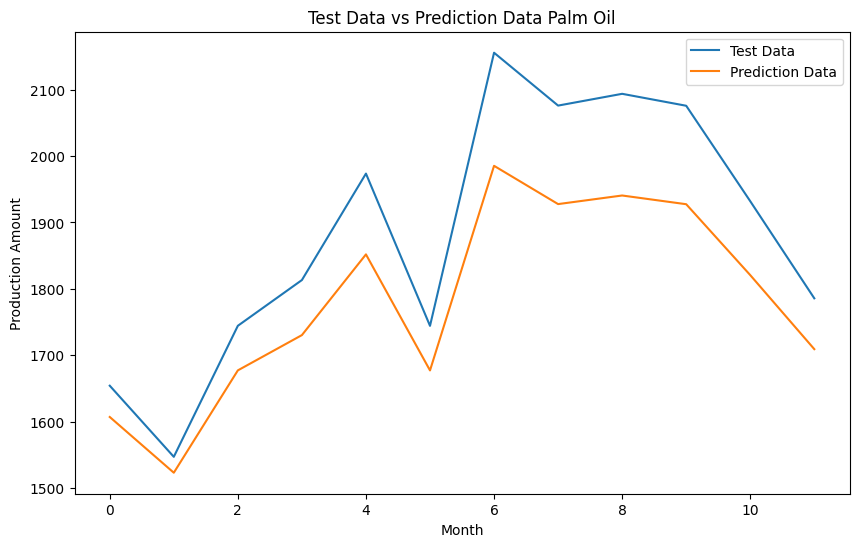



R2 score: 70.66%


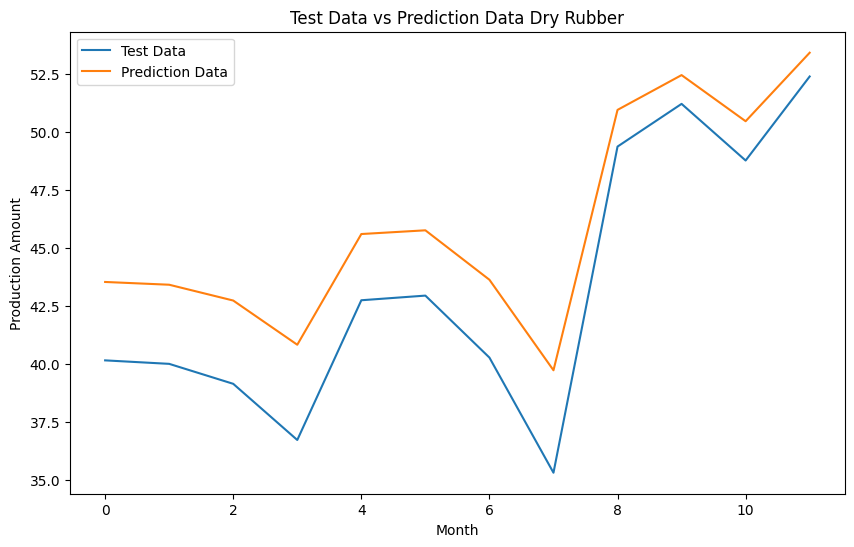



R2 score: 94.40%


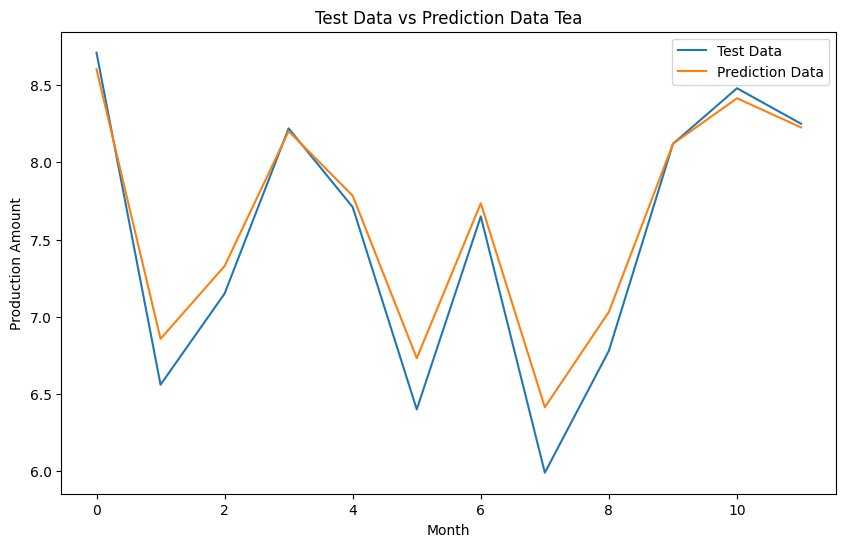



R2 score: 55.04%


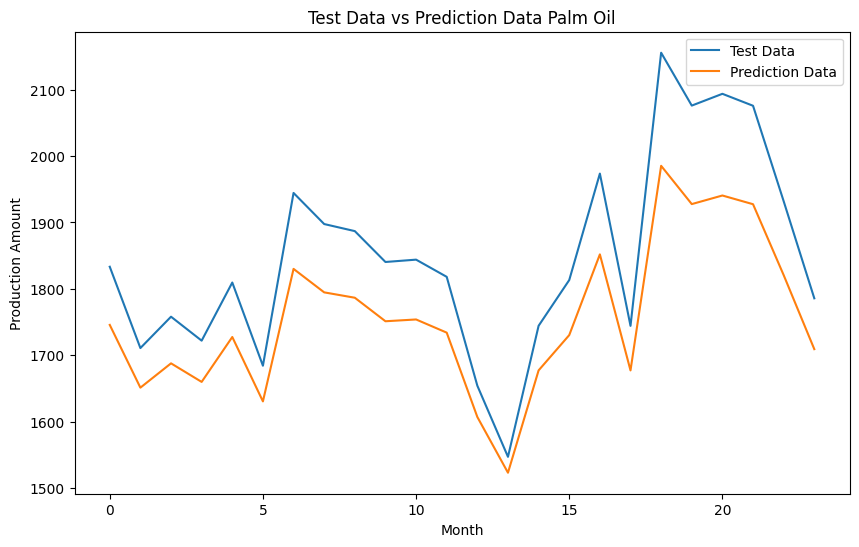



R2 score: 94.26%


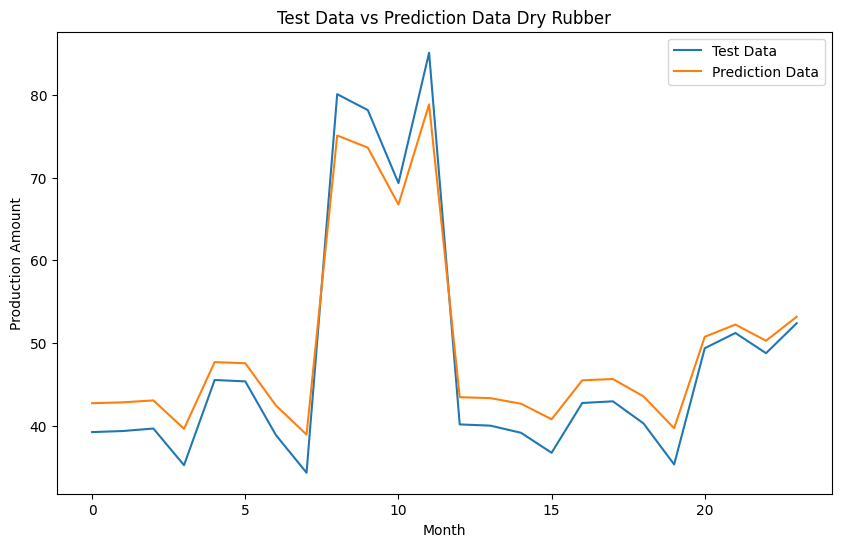



R2 score: 94.40%


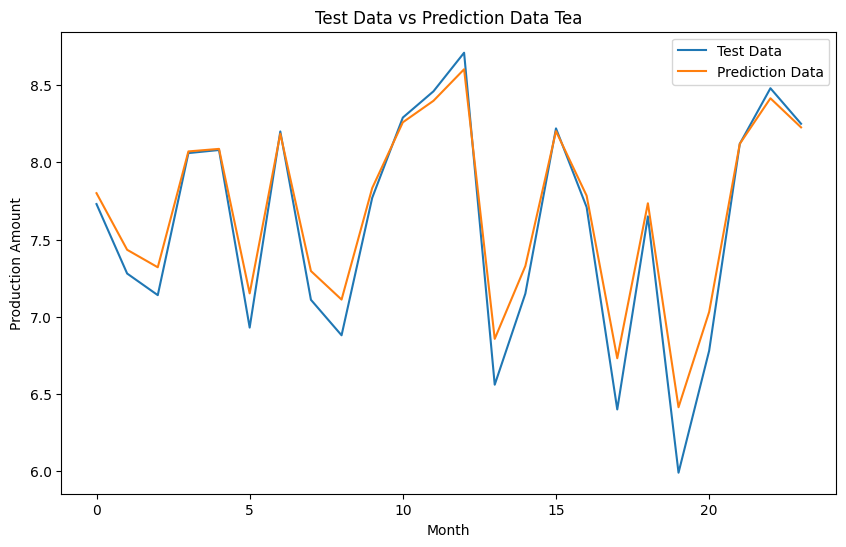



R2 score: 72.56%


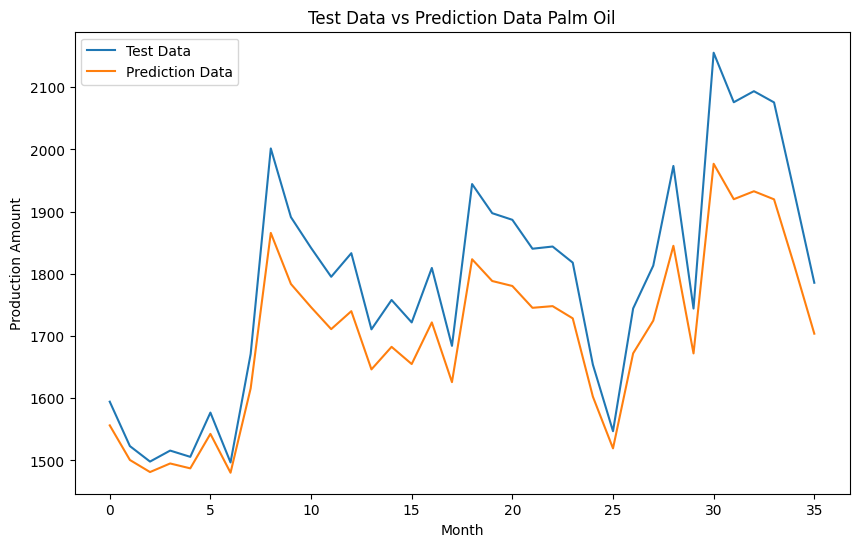



R2 score: 94.27%


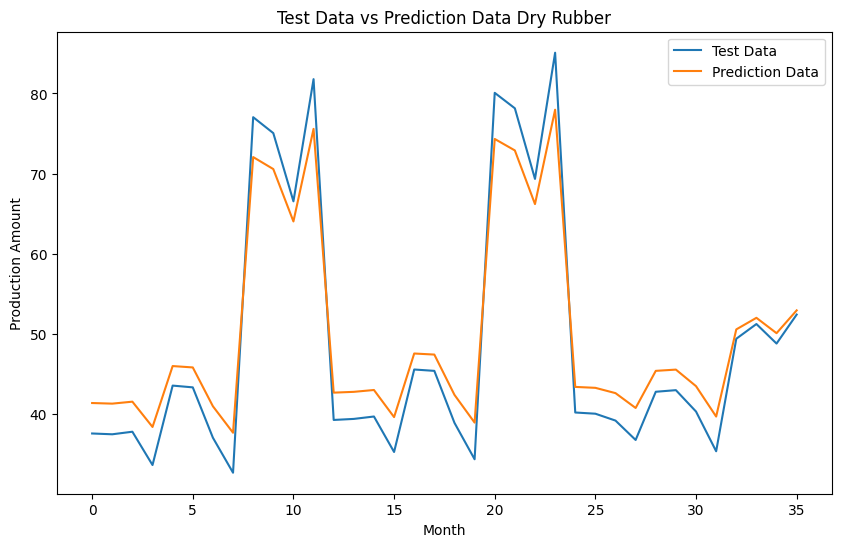



R2 score: 94.06%


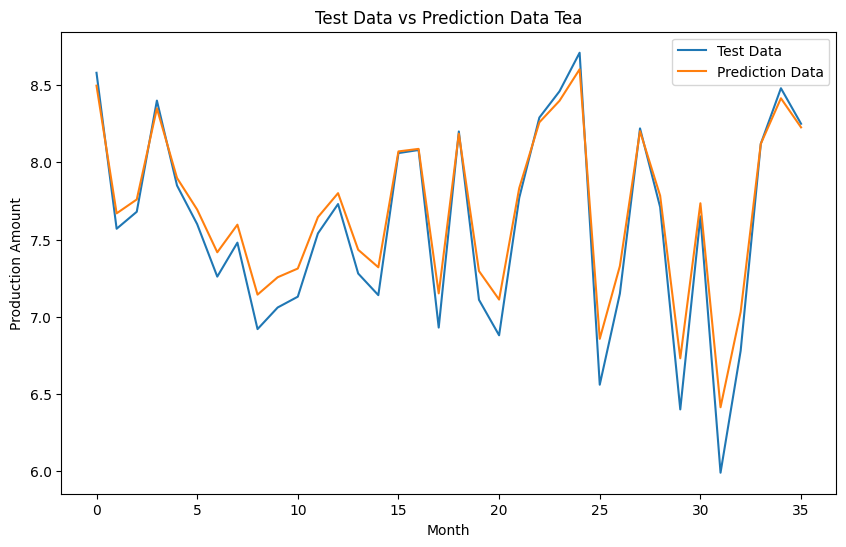

In [42]:
model_svr(minyak_sawit, 'Palm Oil', 0.1, 400, 0.1, 0.1)
model_svr(karet_kering, 'Dry Rubber', 0.1, 400, 0.1, 0.1)
model_svr(teh, 'Tea', 0.1, 400, 0.1, 0.1)

print("==============================================")

model_svr(minyak_sawit, 'Palm Oil', 0.2, 400, 0.1, 0.1)
model_svr(karet_kering, 'Dry Rubber', 0.2, 400, 0.1, 0.1)
model_svr(teh, 'Tea', 0.2, 400, 0.1, 0.1)


print("==============================================")

model_svr(minyak_sawit, 'Palm Oil', 0.3, 400, 0.1, 0.1)
model_svr(karet_kering, 'Dry Rubber', 0.3, 400, 0.1, 0.1)
model_svr(teh, 'Tea', 0.3, 400, 0.1, 0.1)

print("==============================================")

R2 score: 99.65%


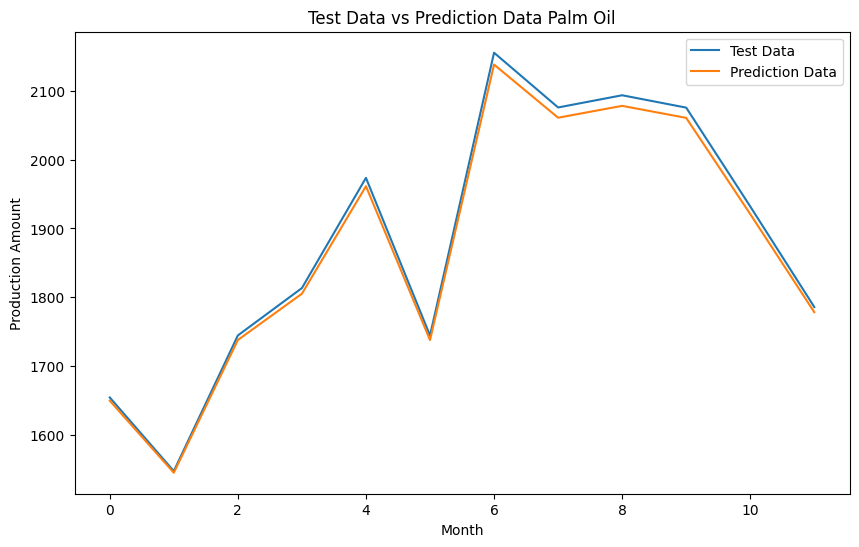



R2 score: 99.71%


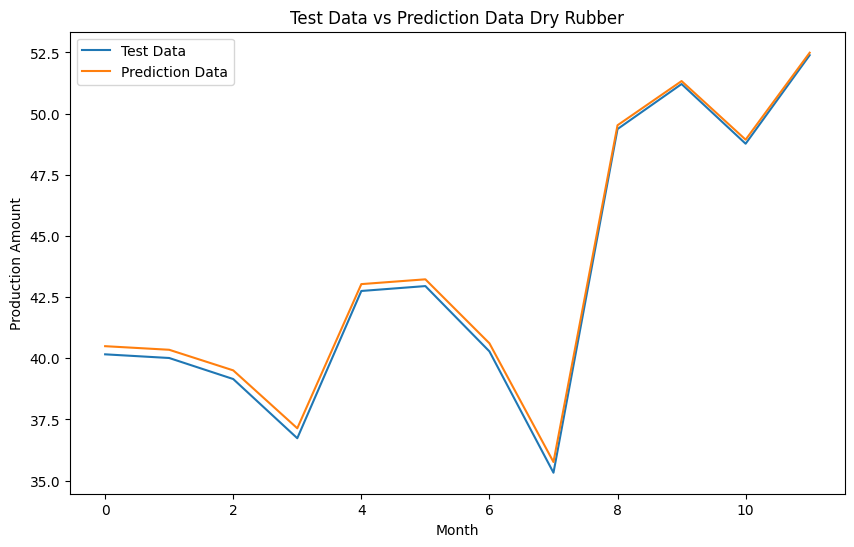



R2 score: 99.95%


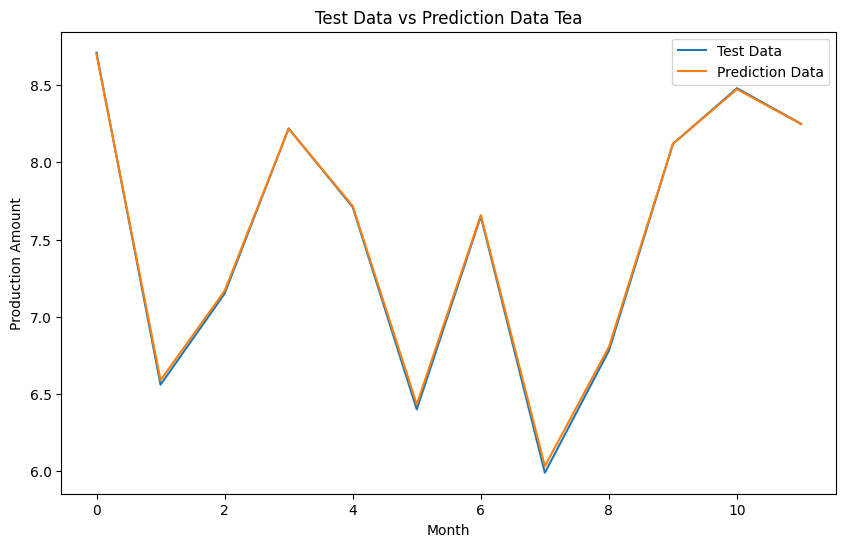



R2 score: 99.55%


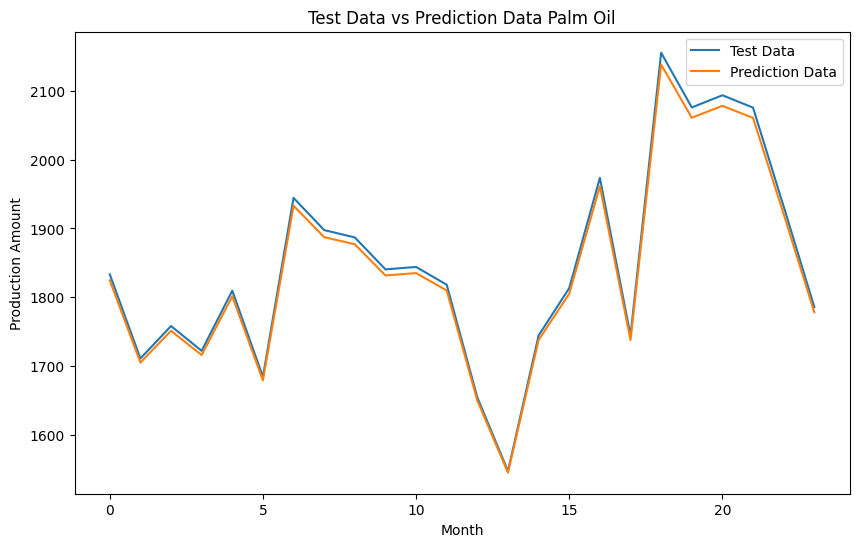



R2 score: 99.94%


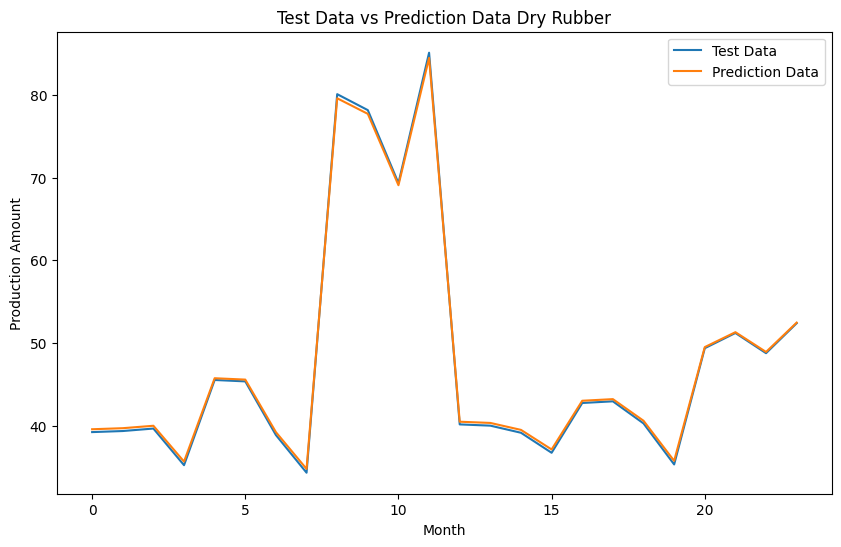



R2 score: 99.95%


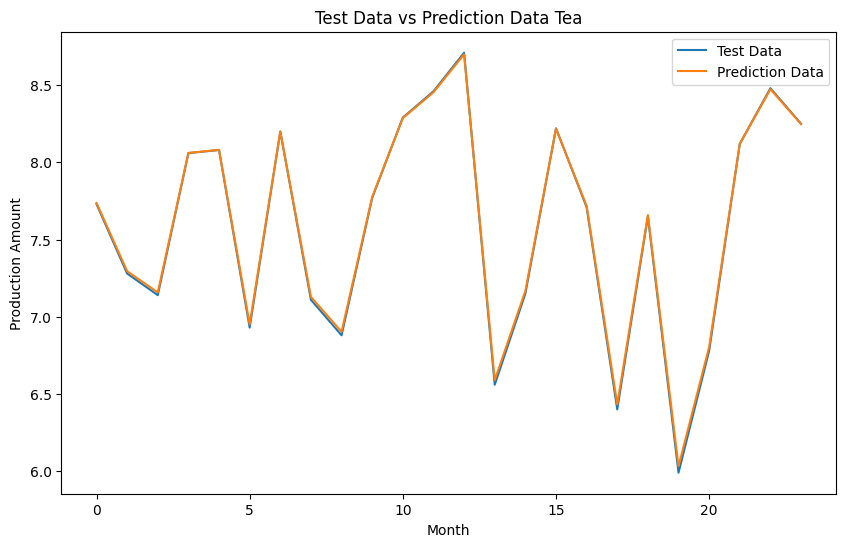



R2 score: 99.73%


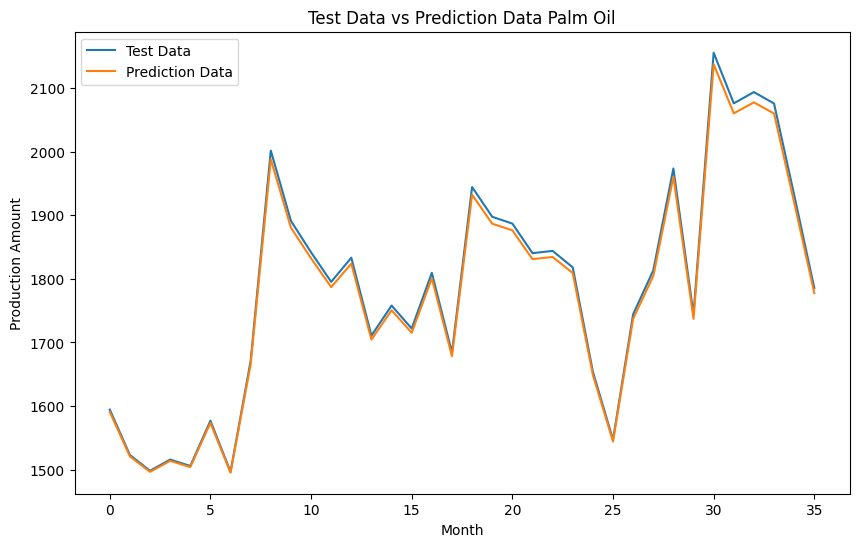



R2 score: 99.94%


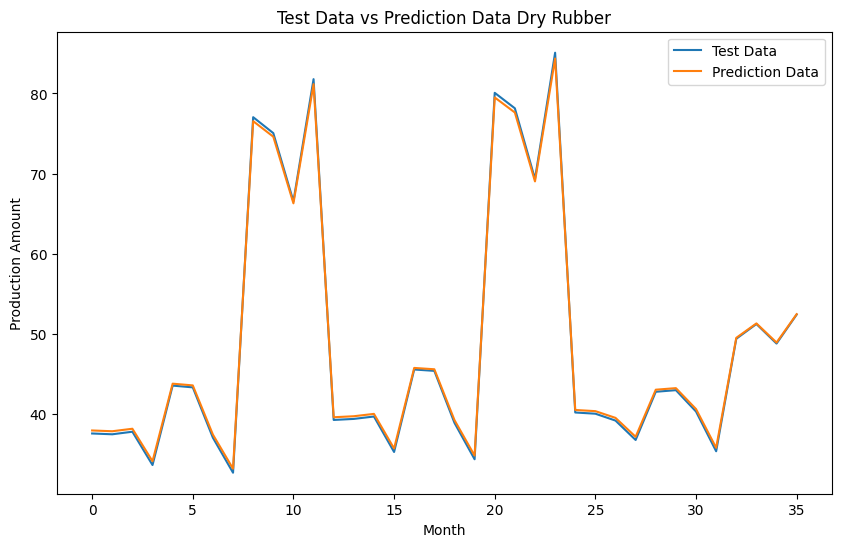



R2 score: 99.94%


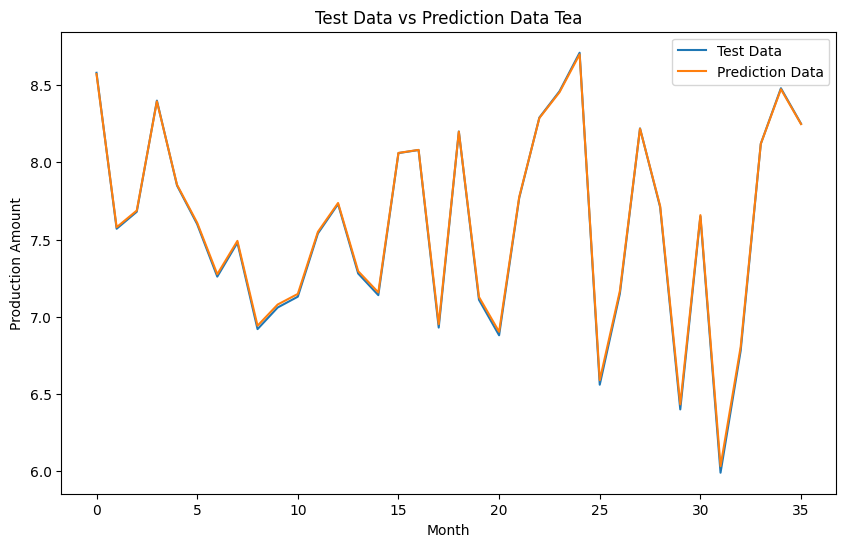

In [43]:
model_svr(minyak_sawit, 'Palm Oil', 0.1, 600, 0.01, 0.01)
model_svr(karet_kering, 'Dry Rubber', 0.1, 600, 0.01, 0.01)
model_svr(teh, 'Tea', 0.1, 600, 0.01, 0.01)

print("==============================================")

model_svr(minyak_sawit, 'Palm Oil', 0.2, 600, 0.01, 0.01)
model_svr(karet_kering, 'Dry Rubber', 0.2, 600, 0.01, 0.01)
model_svr(teh, 'Tea', 0.2, 600, 0.01, 0.01)


print("==============================================")

model_svr(minyak_sawit, 'Palm Oil', 0.3, 600, 0.01, 0.01)
model_svr(karet_kering, 'Dry Rubber', 0.3, 600, 0.01, 0.01)
model_svr(teh, 'Tea', 0.3, 600, 0.01, 0.01)

print("==============================================")

R2 score: 100.00%


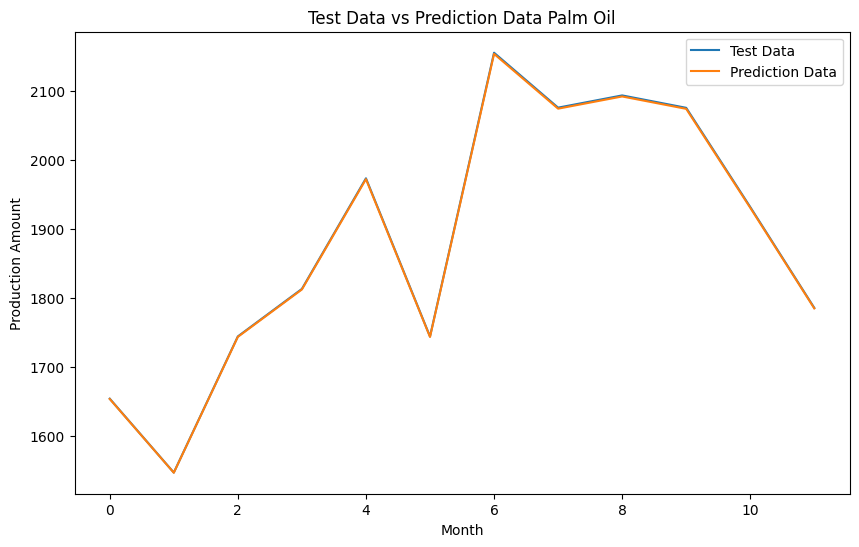



R2 score: 100.00%


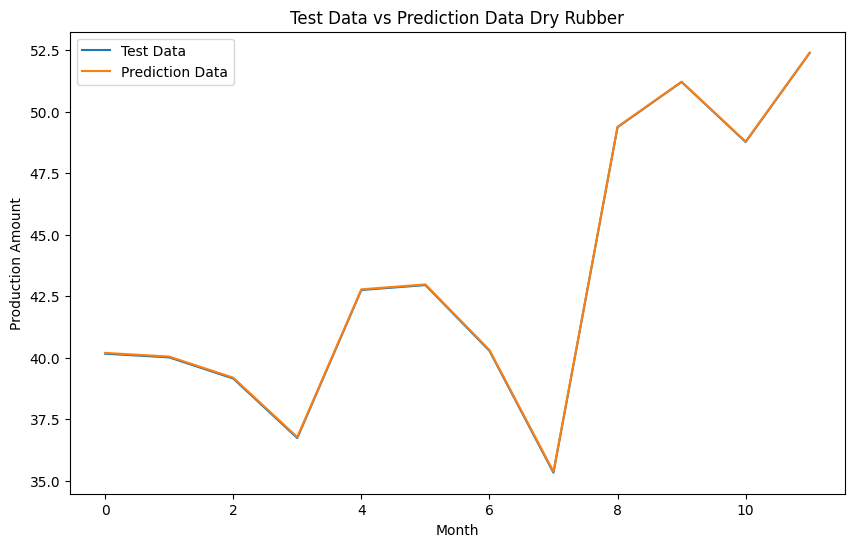



R2 score: 100.00%


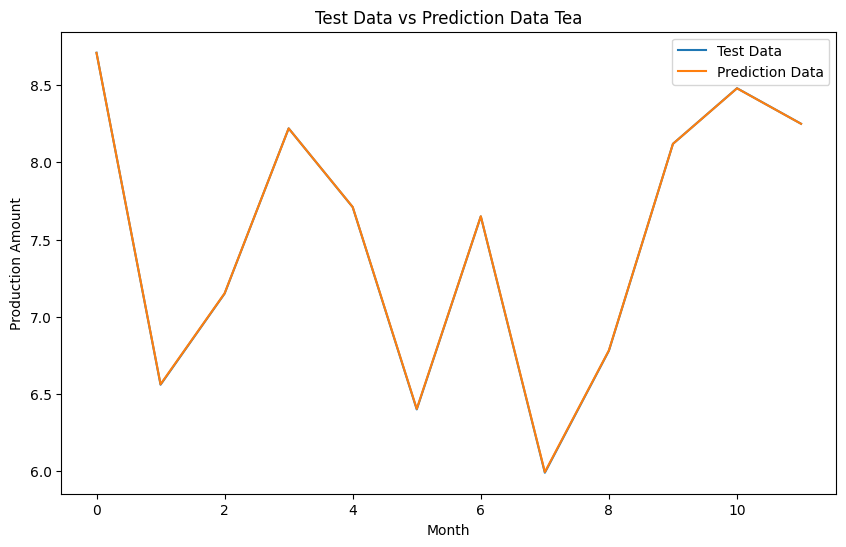



R2 score: 100.00%


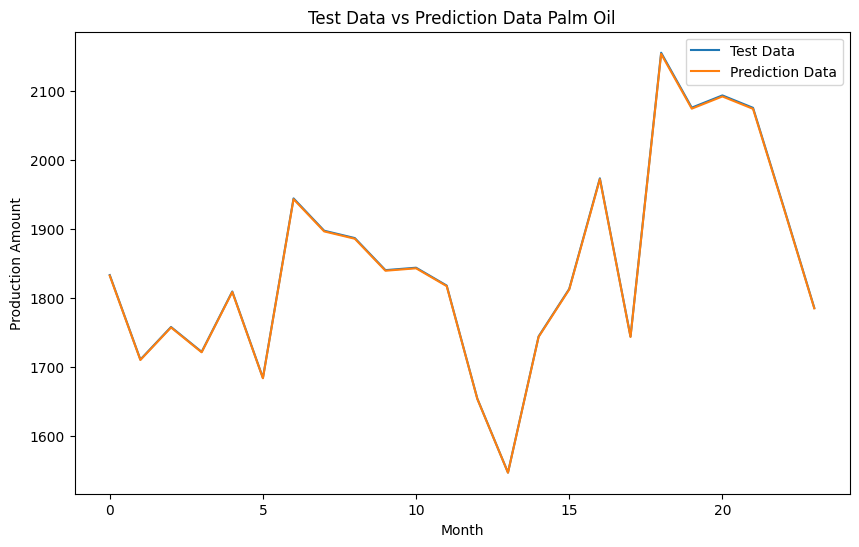



R2 score: 100.00%


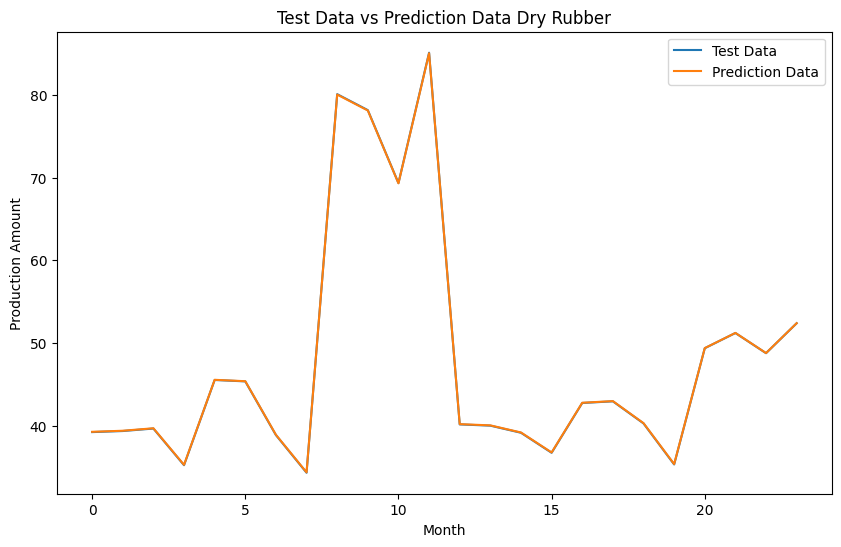



R2 score: 100.00%


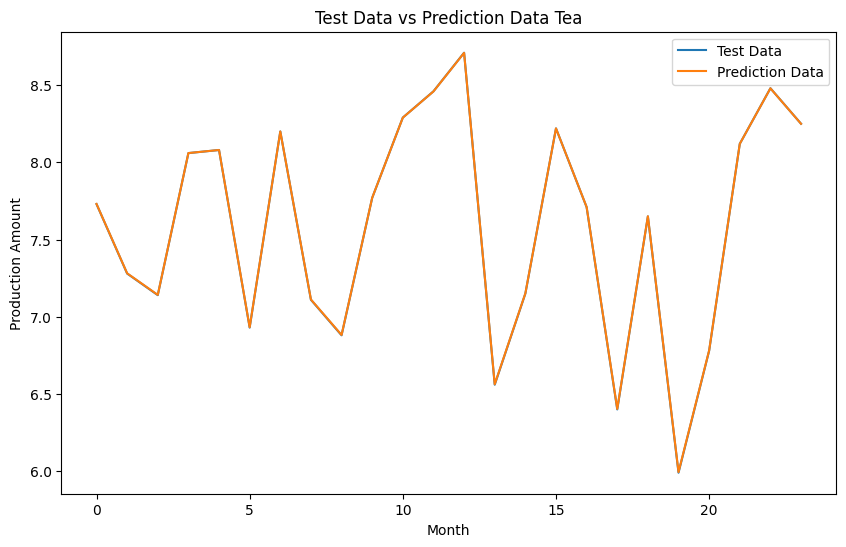



R2 score: 100.00%


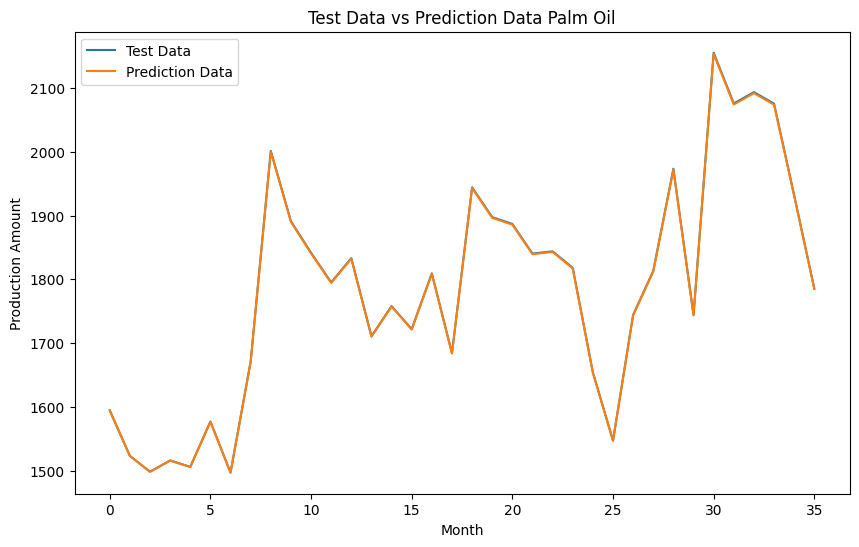



R2 score: 100.00%


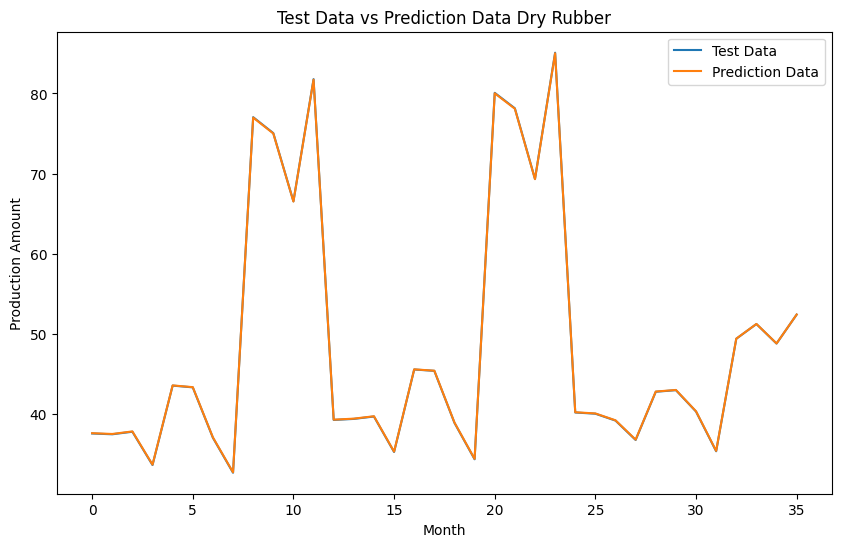



R2 score: 100.00%


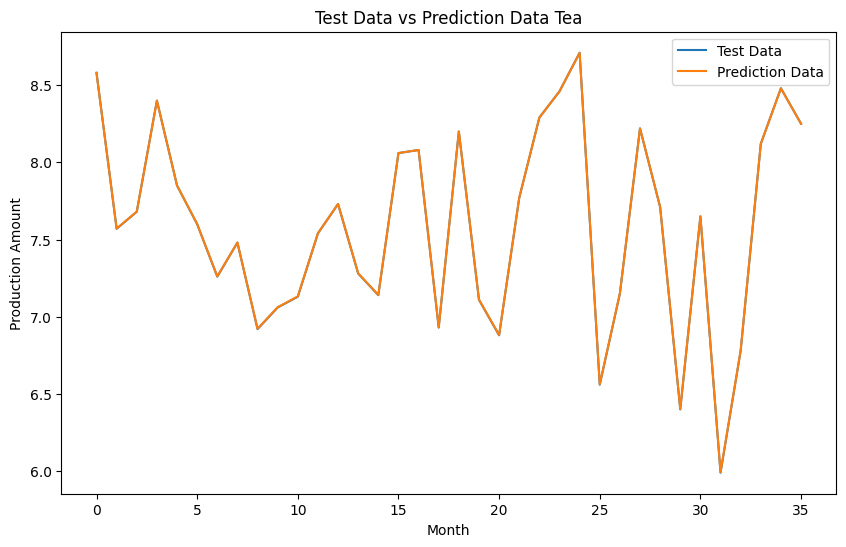

In [44]:
model_svr(minyak_sawit, 'Palm Oil', 0.1, 1000, 0.001, 0.001)
model_svr(karet_kering, 'Dry Rubber', 0.1, 1000, 0.001, 0.001)
model_svr(teh, 'Tea', 0.1, 1000, 0.001, 0.001)

print("==============================================")

model_svr(minyak_sawit, 'Palm Oil', 0.2, 1000, 0.001, 0.001)
model_svr(karet_kering, 'Dry Rubber', 0.2, 1000, 0.001, 0.001)
model_svr(teh, 'Tea', 0.2, 1000, 0.001, 0.001)


print("==============================================")

model_svr(minyak_sawit, 'Palm Oil', 0.3, 1000, 0.001, 0.001)
model_svr(karet_kering, 'Dry Rubber', 0.3, 1000, 0.001, 0.001)
model_svr(teh, 'Tea', 0.3, 1000, 0.001, 0.001)

print("==============================================")